In [67]:
import util
import graficos
import func 

In [68]:
import pandas as pd
import numpy as np
from io import StringIO
import astroquery
from astroquery.sdss import SDSS
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import time
import seaborn as sns
from scipy.integrate import quad
import matplotlib.patches as patches
import shutil
import zipfile
import os
import imageio
import matplotlib.patches as mpatches
import scipy 


from sklearn.cluster import DBSCAN

pd.set_option('display.max_columns', None)

In [69]:
merged_df_filtered_SN2 = pd.read_csv('lineas_filtradas_SN2.csv')

merged_df_filtered_SN2

,targetObjId,specObjId,plateID,targetType,platerun,mjd,fiberId,plate,tile,ra,dec,subClass,rChi2,velDispZ,velDispErr,velDisp,snMedian,snMedian_u,snMedian_g,snMedian_i,snMedian_r,snMedian_z,err_u,err_g,err_r,err_i,err_z,dered_u,dered_g,dered_r,dered_i,dered_z,flags_photo,sciencePrimary,z,zErr,petroFlux_u,petroFlux_g,petroFlux_r,petroFlux_i,petroFlux_z,petroFluxIvar_u,petroFluxIvar_g,petroFluxIvar_r,petroFluxIvar_i,petroFluxIvar_z,modelFlux_u,modelFlux_g,modelFlux_r,modelFlux_i,modelFlux_z,modelFluxIvar_u,modelFluxIvar_g,modelFluxIvar_r,modelFluxIvar_i,modelFluxIvar_z,etiqueta,r_comovil,r_err,DM,M_r,M_g,M_r_kcorrect,M_g_kcorrect,kcorrect_r,kcorrect_g,M_r_kcorrect_modelFlux,M_g_kcorrect_modelFlux,kcorrect_r_modelFlux,kcorrect_g_modelFlux,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,reliable,color_gr,AGN,AGN_VO87-OI,AGN_BPT-NII,AGN_VO87-SII
0,11557302279471150,1890442071513262080,1890385996420245504,SCIENCE,dr2003.12.1,53149,204,1679,1184,232.89301,39.887223,STARBURST,2.759871,0,20.199030,13.20125,20.68994,7.169607,19.48144,23.68311,24.57376,13.48847,0.016954,0.005013,0.004761,0.005174,0.012442,18.11242,17.24763,16.94011,16.75622,16.62669,68988043520,1,0.504029,0.000088,4.263180,44.841240,139.087000,226.722800,322.812000,0.303818,0.211878,0.034586,0.014106,0.006631,6.265040,41.953620,133.619600,218.578400,319.34800,2.703582,6.867417,2.088453,0.906649,0.108131,0,1878.202852,5.004538e-15,36.368712,-20.203112,-19.895592,-48.274387,-47.859370,0.568680,1.382684,-48.221554,-47.678967,0.559387,1.274550,440.78770,10.465620,492.24530,10.658280,7.652645,2.785784,354.00100,5.077673,203.39340,4.324126,616.89440,7.268903,40.588620,2.454408,29.624530,2.094657,57.35492,0.988380,1150.97900,10.251810,172.99570,2.981180,167.65650,3.318313,124.93480,3.357132,1,0.30752,False,False,False,False
1,11275376875274305,1515512174368286720,1515461321955502080,SCIENCE,dr2003.05.1,52822,185,1346,995,209.70949,41.751296,STARBURST,6.153744,0,21.478930,20.46089,19.66992,6.844073,18.97459,21.65471,22.72266,12.02489,0.014957,0.004230,0.004433,0.004760,0.011518,17.95212,17.03340,16.89958,16.68328,16.61744,35253360132112,1,0.158843,0.000029,0.569889,1.399914,5.545683,16.538250,24.021730,2.760902,11.563000,2.649189,0.874933,0.075430,0.047399,1.490131,5.430546,15.282240,21.14679,14.531430,49.911720,24.450910,9.048003,0.587336,0,640.718723,1.707218e-15,34.033337,-17.908267,-17.774447,-41.819157,-40.645794,0.486002,0.807273,-41.796375,-40.713600,0.486002,0.807273,746.57310,15.900580,876.58120,16.780560,11.569520,3.491089,717.64890,8.856584,657.80630,8.612718,1957.99000,18.503520,88.776520,3.241331,39.250120,2.609964,93.56466,1.517550,2475.86400,19.220480,282.21260,4.577276,261.09410,4.564888,191.74290,3.875889,1,0.13382,False,False,False,False
2,11557227673288870,1849999284963928064,1849853599673247744,SCIENCE,dr2003.11.3,53143,530,1643,1155,213.91326,37.371322,STARBURST,2.737305,0,14.462620,141.39130,21.10927,6.961064,19.57236,25.76343,25.19413,15.30732,0.018603,0.004356,0.004023,0.004231,0.010717,17.89254,16.98387,16.54391,16.15817,16.05874,217164414976,1,0.658958,0.000201,-4.381327,14.240200,68.500310,126.874100,218.794700,0.163823,0.970092,0.363155,0.162351,0.009918,2.797156,18.480520,82.343360,150.862800,233.39290,1.268823,5.002958,1.660192,0.709704,0.069481,0,2364.547309,6.300420e-15,36.868740,-21.099340,-20.659380,-48.632183,-47.738304,0.993035,1.804596,-48.727867,-47.962000,0.888877,1.745299,389.27280,8.196134,129.11600,6.954089,6.851777,3.297699,322.81520,5.174773,55.43773,3.619277,167.42450,4.686606,37.978380,2.795405,39.837310,2.945969,178.85780,1.980494,1420.25700,12.000730,539.47640,5.973621,199.8

In [70]:
agn_subclasses = merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN'] == True, 'subClass']

agn_subclasses.unique()

array(['AGN BROADLINE', 'AGN', 'STARFORMING', 'STARBURST', nan,
       'STARBURST BROADLINE', 'STARFORMING BROADLINE', 'BROADLINE'],
      dtype=object)

## Matrices de cocientes

In [71]:
flux_columns = [
    'oii_3726_flux',  'oii_3729_flux',
    'oiii_4363_flux',  'h_beta_flux', 
    'oiii_4959_flux',  'oiii_5007_flux',
    'hei_5876_flux', 'oi_6300_flux',
    'nii_6548_flux', 'h_alpha_flux',
    'nii_6584_flux', 'sii_6717_flux',
    'sii_6731_flux']

matrices_SN2 = []

for idx, galaxy in merged_df_filtered_SN2.iterrows():
    
    flux_values = galaxy[flux_columns].values

    #13x13 matrix to store Fi/Fj ratios
    ratio_matrix = np.zeros((len(flux_columns), len(flux_columns)))

    #Fill the matrix
    for i in range(len(flux_columns)):
        for j in range(len(flux_columns)):
            if flux_values[j] != 0:  
                ratio_matrix[i, j] = flux_values[i] / flux_values[j]
            else:
                ratio_matrix[i, j] = np.nan  

    
    matrices_SN2.append(ratio_matrix)

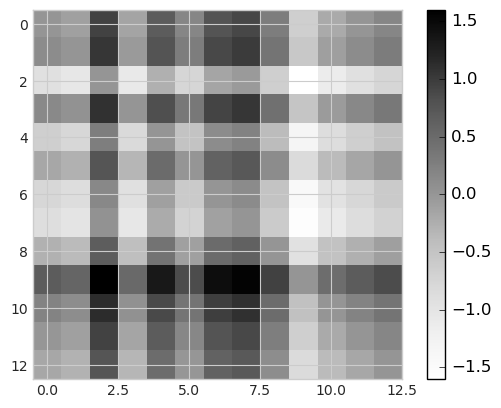

In [72]:

fig = plt.imshow(np.log10(matrices_SN2[10]))
plt.style.use('classic')
plt.colorbar(fig)

In [175]:
print(plt.style.available)
plt.style.use('classic')

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


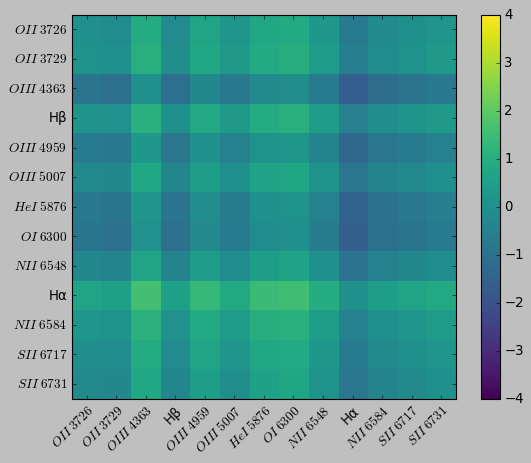

In [176]:
abbreviated_labels = [
    '$OII\\;3726$', '$OII\\;3729$', 
    '$OIII\\;4363$', 'Hβ', 
    '$OIII\\;4959$', '$OIII\\;5007$', 
    '$HeI\\;5876$', '$OI\\;6300$', 
    '$NII\\;6548$', 'Hα', 
    '$NII\\;6584$', '$SII\\;6717$', 
    '$SII\\;6731$'
]

line_dict = {
    'OII 3726': 0,  # Posición en 'abbreviated_labels'
    'Hβ': 3,
    'OIII 4959': 4,
    'NII 6584': 10,
    'Hα': 9,
    'SII 6717': 11
}

fig, ax = plt.subplots()
im = ax.imshow(np.log10(matrices_SN2[10]), cmap='viridis', vmin=-4, vmax=4, interpolation='nearest')

ax.set_xticks(np.arange(len(abbreviated_labels)))
ax.set_yticks(np.arange(len(abbreviated_labels)))
ax.set_xticklabels(abbreviated_labels)
ax.set_yticklabels(abbreviated_labels)

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.style.use('classic')
plt.colorbar(im)


"""#ratios de diagramas BPT
ratios_to_highlight = [
    ('OII 3726', 'Hβ'),
    ('OIII 4959', 'Hβ'),
    ('NII 6584', 'Hα'),
    ('SII 6717', 'Hα')
]

for line1, line2 in ratios_to_highlight:
    # Obtener índices de las líneas en la matriz
    i = line_dict[line1]
    j = line_dict[line2]
    
    # Añadir un borde negro alrededor del píxel correspondiente (i,j)
    rect = patches.Rectangle((j-0.5, i-0.5), 1, 1, linewidth=2, edgecolor='black', facecolor='none')
    ax.add_patch(rect)"""

# Mostrar la gráfica
plt.show()


In [178]:
#### VIDEO PARA LAS SN>2 ####
# Ordenar las galaxias por el color (g-r)

"""merged_df_sorted = merged_df_filtered_SN2.sort_values(by='color_gr')

frames = []

for idx, galaxy in merged_df_sorted.iterrows():
    fig, ax = plt.subplots()
    
    ratio_matrix = matrices_SN2[idx]
    
    im = ax.imshow(np.log10(ratio_matrix), cmap='viridis', vmin=-4, vmax=4)

    ax.set_xticks(np.arange(len(abbreviated_labels)))
    ax.set_yticks(np.arange(len(abbreviated_labels)))
    ax.set_xticklabels(abbreviated_labels)
    ax.set_yticklabels(abbreviated_labels)

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    plt.colorbar(im)

    # Guardar el frame como imagen
    frame_filename = f'frame_{idx}.png'
    plt.savefig(frame_filename)
    frames.append(frame_filename)
    
    plt.close()

# Crear el video con las imágenes
with imageio.get_writer('galaxies_video_SN2.mp4', format='mp4', fps=2) as writer:
    for frame in frames:
        image = imageio.imread(frame)
        writer.append_data(image)"""

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_3163/2625521227.py:33: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame)
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (800, 600) to (800, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [ ]:
### Guardar frames en una carpeta aparte comprimida: SN > 2
"""
# Crear una carpeta para almacenar los frames
frames_folder = 'video_frames_SN2'
if not os.path.exists(frames_folder):
    os.makedirs(frames_folder)

# Mover los frames generados a la carpeta
for frame in frames:
    shutil.move(frame, os.path.join(frames_folder, frame))

# Crear un archivo .zip que contenga los frames
zip_filename = 'video_frames_SN2.zip'
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for root, dirs, files in os.walk(frames_folder):
        for file in files:
            zipf.write(os.path.join(root, file), arcname=file)

print(f'Frames comprimidos en {zip_filename}')"""

Frames comprimidos en video_frames_SN2.zip


In [ ]:
### Guardar cocientes en .csv para SN > 2

abbreviated_labels = [
    'OII 3726', 'OII 3729', 
    'OIII 4363', 'Hβ', 
    'OIII 4959', 'OIII 5007', 
    'HeI 5876', 'OI 6300', 
    'NII 6548', 'Hα', 
    'NII 6584', 'SII 6717', 
    'SII 6731'
]

galaxy_data = []

# Iterar sobre las galaxias y las matrices de cocientes
for idx, galaxy in merged_df_filtered_SN2.iterrows():
    
    #matriz de cocientes de la galaxia
    ratio_matrix = matrices_SN2[idx]

    #índices de la triangular inferior, sin la diagonal
    tri_lower_indices = np.tril_indices(len(flux_columns), k=-1)

    tri_lower_values = ratio_matrix[tri_lower_indices]
    
    galaxy_info = {
        'specObjId': galaxy['specObjId'],
        'color_gr': galaxy['color_gr'],  
        'M_r': galaxy['M_r'], 
        'z': galaxy['z'],
        'AGN_Kewley': galaxy['AGN'],
        'AGN_VO87-OI':galaxy['AGN_VO87-OI'],
        'AGN_BPT-NII': galaxy['AGN_BPT-NII'],
        'AGN_VO87-SII': galaxy['AGN_VO87-SII']
    }
    
    for i, value in enumerate(tri_lower_values):
        galaxy_info[f'ratio_{abbreviated_labels[tri_lower_indices[0][i]]}/{abbreviated_labels[tri_lower_indices[1][i]]}'] = value
    
    galaxy_data.append(galaxy_info)

df_galaxies_SN2 = pd.DataFrame(galaxy_data)

# Guardar el DataFrame en un archivo CSV
#df_galaxies_SN2.to_csv('galaxy_ratios_SN2.csv', index=False)

print("DataFrame creado y guardado como 'galaxy_ratios_SN2.csv'")

DataFrame creado y guardado como 'galaxy_ratios_SN2.csv'


In [5]:
df_galaxies_SN2 = pd.read_csv('galaxy_ratios_SN2.csv')

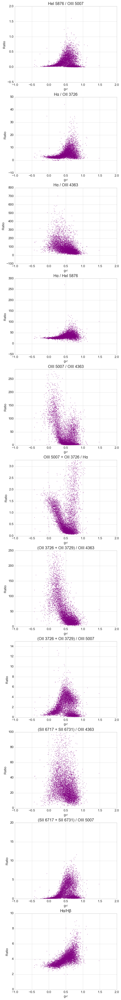

In [172]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 50), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = df_galaxies_SN2['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
axs[0].scatter(x_1, df_galaxies_SN2['ratio_HeI 5876/OIII 5007'], s=0.2, color='purple')
axs[0].set_title('HeI 5876 / OIII 5007')
#axs[0].set_ylim(0, 200)

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
axs[1].scatter(x_1, df_galaxies_SN2['ratio_Hα/OII 3726'], s=0.2, color='purple')
axs[1].set_title('Hα / OII 3726')
#axs[1].set_ylim(0, 200)

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
axs[2].scatter(x_1, df_galaxies_SN2['ratio_Hα/OIII 4363'], s=0.2, color='purple')
axs[2].set_title('Hα / OIII 4363')
#axs[2].set_ylim(0, 200)

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
axs[3].scatter(x_1, df_galaxies_SN2['ratio_Hα/HeI 5876'], s=0.2, color='purple')
axs[3].set_title('Hα / HeI 5876')
#axs[3].set_ylim(0, 200)

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
axs[4].scatter(x_1, df_galaxies_SN2['ratio_OIII 5007/OIII 4363'], s=0.2, color='purple')
axs[4].set_title('OIII 5007 / OIII 4363')
axs[4].set_ylim(0, df_galaxies_SN2['ratio_OIII 5007/OIII 4363'].quantile(0.999))
#axs[4].set_ylim(0, 200)

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

#axs[5].scatter(x, (1/df_galaxies['ratio_Hα/OIII 5007']) + (1/df_galaxies['ratio_Hα/OII 3726']), s=0.2)
axs[5].scatter(x_1, (1/df_galaxies_SN2['ratio_Hα/OIII 5007']) + (1/df_galaxies_SN2['ratio_Hα/OII 3726']), s=0.2, color='purple')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')
axs[5].set_ylim(0, ((1/df_galaxies_SN2['ratio_Hα/OIII 5007']) + (1/df_galaxies_SN2['ratio_Hα/OII 3726'])).quantile(0.99))
#axs[5].set_ylim(0, 200)

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363

#axs[6].scatter(x, (1 / df_galaxies['ratio_OIII 4363/OII 3726']) + (1 / df_galaxies['ratio_OIII 4363/OII 3729']), s=0.2)
axs[6].scatter(x_1, (1 / df_galaxies_SN2['ratio_OIII 4363/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 4363/OII 3729']), s=0.2, color='purple')
axs[6].set_title('(OII 3726 + OII 3729) / OIII 4363')
axs[6].set_ylim(0, 250)

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007

#axs[7].scatter(x, (1 / df_galaxies['ratio_OIII 5007/OII 3726']) + (1 / df_galaxies['ratio_OIII 5007/OII 3729']), s=0.2)
axs[7].scatter(x_1, (1 / df_galaxies_SN2['ratio_OIII 5007/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 5007/OII 3729']), s=0.2, color='purple')
axs[7].set_title('(OII 3726 + OII 3729) / OIII 5007')
axs[7].set_ylim(0, 15)

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

#axs[8].scatter(x, df_galaxies['ratio_SII 6717/OIII 4363'] + df_galaxies['ratio_SII 6731/OIII 4363'], s=0.2)
axs[8].scatter(x_1, df_galaxies_SN2['ratio_SII 6717/OIII 4363'] + df_galaxies_SN2['ratio_SII 6731/OIII 4363'], s=0.2, color='purple')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')
axs[8].set_ylim(0, 100)

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007

#axs[9].scatter(x, df_galaxies['ratio_SII 6717/OIII 5007'] + df_galaxies['ratio_SII 6731/OIII 5007'], s=0.2)
axs[9].scatter(x_1, df_galaxies_SN2['ratio_SII 6717/OIII 5007'] + df_galaxies_SN2['ratio_SII 6731/OIII 5007'], s=0.2, color='purple')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')
axs[9].set_ylim(0, 20)

#axs[9].scatter(x, df_galaxies['ratio_SII 6717/OIII 5007'] + df_galaxies['ratio_SII 6731/OIII 5007'], s=0.2)
axs[10].scatter(x_1, df_galaxies_SN2['ratio_Hα/Hβ'] , s=0.2, color='purple')
axs[10].set_title('Hα/Hβ')
#axs[10].set_ylim(0, df_galaxies_SN2['ratio_Hα/Hβ'].quantile(0.99))
axs[10].set_ylim(0, 10)
"""
axs[11].scatter(x_1, df_galaxies_SN2['ratio_(OII 3726 + OII 3729)/OIII 4363'] , s=0.2, color='purple')
axs[11].set_title('(OII 3726 + OII 3729)/OIII 4363')
a#xs[11].set_ylim(0, 200)

axs[12].scatter(x_1, df_galaxies_SN2['ratio_(OII 3726 + OII 3729)/OIII 5007'] , s=0.2, color='purple')
axs[12].set_title('(OII 3726 + OII 3729)/OIII 5007')
a#xs[12].set_ylim(0, 15)"""

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Ratio')


plt.show()


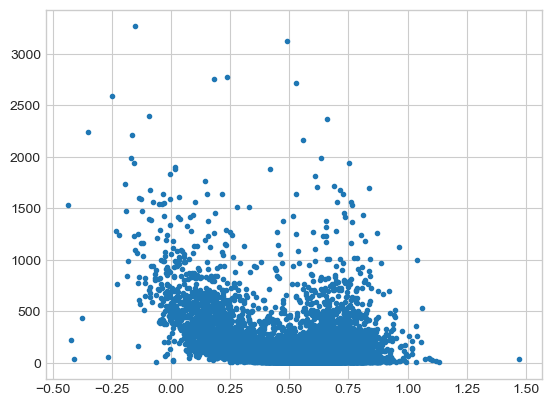

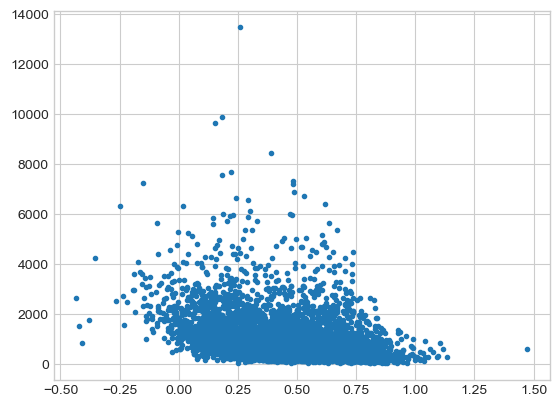

In [13]:
plt.plot(merged_df_filtered_SN2['color_gr'], merged_df_filtered_SN2['oiii_4959_flux'], '.')
plt.show()
plt.plot(merged_df_filtered_SN2['color_gr'], merged_df_filtered_SN2['h_alpha_flux'], '.')

In [14]:
# Crear las nuevas columnas para las combinaciones de razones.
df_galaxies_SN2['ratio_(OII 3726 + OII 3729)/OIII 4363'] = (1 / df_galaxies_SN2['ratio_OIII 4363/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 4363/OII 3729'])
df_galaxies_SN2['ratio_(OII 3726 + OII 3729)/OIII 5007'] = (1 / df_galaxies_SN2['ratio_OIII 5007/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 5007/OII 3729'])
df_galaxies_SN2['ratio_(OIII 5007 + OII 3726)/Hα'] = (1/df_galaxies_SN2['ratio_Hα/OIII 5007']) + (1/df_galaxies_SN2['ratio_Hα/OII 3726'])
df_galaxies_SN2['ratio_(SII 6717 + SII 6731)/OIII 4363'] = df_galaxies_SN2['ratio_SII 6717/OIII 4363'] + df_galaxies_SN2['ratio_SII 6731/OIII 4363']
df_galaxies_SN2['ratio_(SII 6717 + SII 6731)/OIII 5007'] = df_galaxies_SN2['ratio_SII 6717/OIII 5007'] + df_galaxies_SN2['ratio_SII 6731/OIII 5007']

#df_galaxies_SN2.to_csv('galaxy_ratios_SN2.csv', index=False)

(array([  4.,   1.,   2.,   7.,  19.,  25.,  83., 124., 218., 316., 427.,
        494., 546., 636., 730., 779., 826., 709., 579., 327., 140.,  46.,
         16.,   8.,   4.,   0.,   0.,   0.,   0.,   1.]),
 array([-0.43349   , -0.36996633, -0.30644267, -0.242919  , -0.17939533,
        -0.11587167, -0.052348  ,  0.01117567,  0.07469933,  0.138223  ,
         0.20174667,  0.26527033,  0.328794  ,  0.39231767,  0.45584133,
         0.519365  ,  0.58288867,  0.64641233,  0.709936  ,  0.77345967,
         0.83698333,  0.900507  ,  0.96403067,  1.02755433,  1.091078  ,
         1.15460167,  1.21812533,  1.281649  ,  1.34517267,  1.40869633,
         1.47222   ]),
 <BarContainer object of 30 artists>)

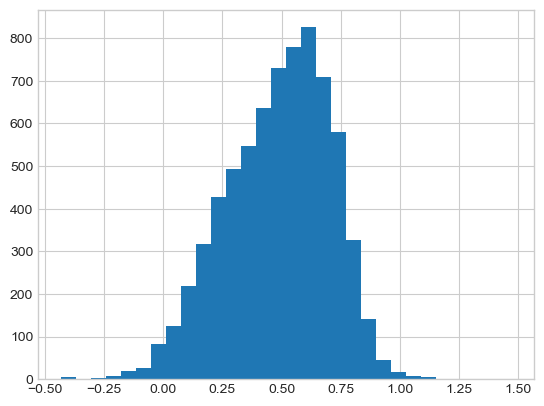

In [15]:
plt.hist(df_galaxies_SN2['color_gr'], bins=30)

Mediana con percentiles y dispersión para los diferentes cocientes:

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_3163/775891577.py:15: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.5)


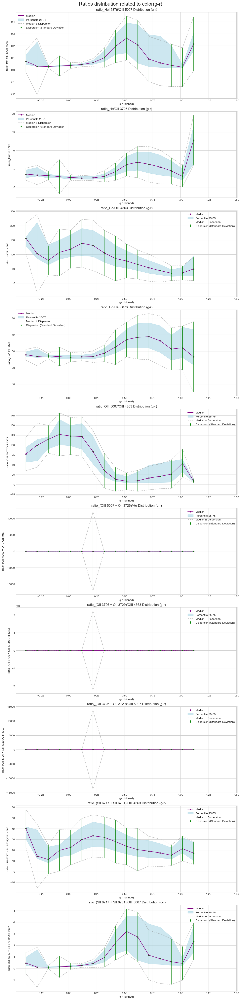

In [16]:
ratios = [
    'ratio_HeI 5876/OIII 5007',
    'ratio_Hα/OII 3726',
    'ratio_Hα/OIII 4363',
    'ratio_Hα/HeI 5876',
    'ratio_OIII 5007/OIII 4363',
    'ratio_(OIII 5007 + OII 3726)/Hα',
    'ratio_(OII 3726 + OII 3729)/OIII 4363',
    'ratio_(OII 3726 + OII 3729)/OIII 5007',
    'ratio_(SII 6717 + SII 6731)/OIII 4363',
    'ratio_(SII 6717 + SII 6731)/OIII 5007'
]

fig, axs = plt.subplots(len(ratios), 1, figsize=(12, 50), constrained_layout=True)
plt.subplots_adjust(hspace=0.5)  

bin_size = 0.1
bins = np.arange(df_galaxies_SN2['color_gr'].min(), df_galaxies_SN2['color_gr'].max() , bin_size)

for i, ratio in enumerate(ratios):
    #Agrupar por bins y calcular estadísticas
    bin_groups = df_galaxies_SN2.groupby(pd.cut(df_galaxies_SN2['color_gr'], bins))[ratio]
    medians = bin_groups.median()
    percentiles_25 = bin_groups.quantile(0.25)
    percentiles_75 = bin_groups.quantile(0.75)
    dispersion = bin_groups.std()

    x_coords = [interval.mid for interval in medians.index]

    axs[i].plot(x_coords, medians, color='purple', marker='o', markersize=4, label='Median')
    axs[i].fill_between(x_coords, percentiles_25, percentiles_75, color='lightblue', alpha=0.6, label='Percentile 25-75')
    axs[i].errorbar(x_coords, medians, yerr=dispersion, fmt='.', color='green', alpha=0.8, label='Dispersion (Standard Deviation)')
    axs[i].plot(x_coords, medians + dispersion, linestyle='--', color='gray', alpha=0.5, label='Median ± Dispersion')
    axs[i].plot(x_coords, medians - dispersion, linestyle='--', color='gray', alpha=0.5)

    axs[i].set_title(f'{ratio} Distribution (g-r)')
    axs[i].set_xlabel('g-r (binned)')
    axs[i].set_ylabel(ratio)
    axs[i].legend()

fig.suptitle('Ratios distribution related to color(g-r)', fontsize=18)
plt.show()


## Revisando posibles AGN de los diagramas de diagnostico: 


In [129]:
### Crear columna para nuestra propia clasificación de AGN y Star Forming ###
"""
df_galaxies_SN2['Galaxy_Type'] = df_galaxies_SN2.apply(lambda row: 'AGN' if (row['AGN_VO87-OI'] == True and 
                                                   row['AGN_BPT-NII'] == True and 
                                                   row['AGN_VO87-SII'] == True) else 'Star Forming', axis=1) """

conditions = [
    df_galaxies_SN2['AGN_BPT-NII'] == True,
    df_galaxies_SN2['AGN_VO87-OI'] == True,
    df_galaxies_SN2['AGN_VO87-SII'] == True
]
choices = ['AGN_kauf', 'AGN_OI', 'AGN_SII']

# Asignar valores según las condiciones
df_galaxies_SN2['Galaxy_Type'] = np.select(conditions, choices, default='Star Forming')


In [130]:
df_galaxies_SN2['Galaxy_Type'].unique()

array(['Star Forming', 'AGN_kauf', 'AGN_OI', 'AGN_SII'], dtype=object)

In [131]:
agn_vo87_oi = df_galaxies_SN2['AGN_VO87-OI'].sum()
agn_bpt_nii = df_galaxies_SN2['AGN_BPT-NII'].sum()
agn_vo87_sii = df_galaxies_SN2['AGN_VO87-SII'].sum()

print(f"Galaxias con AGN según VO87-OI: {agn_vo87_oi}")
print(f"Galaxias con AGN según BPT-NII: {agn_bpt_nii}")
print(f"Galaxias con AGN según VO87-SII: {agn_vo87_sii}")


Galaxias con AGN según VO87-OI: 1405
Galaxias con AGN según BPT-NII: 2082
Galaxias con AGN según VO87-SII: 878


In [132]:
merged_df_filtered_SN2['Galaxy_Type'] = df_galaxies_SN2['Galaxy_Type']

### Revisar medianas para los 4 tipos de AGN (Con los tres diagramas y el combinado)

In [185]:
### Columna para galaxias que entran dentro de los tres diagramas de clasificacion
merged_df_filtered_SN2['AGN_combinado'] = (
    merged_df_filtered_SN2['AGN_BPT-NII'] & 
    merged_df_filtered_SN2['AGN_VO87-OI'] &
    merged_df_filtered_SN2['AGN_VO87-SII']
)

df_galaxies_SN2['AGN_combinado'] = merged_df_filtered_SN2['AGN_combinado']

agn_classifications = {
    'AGN_BPT-NII': 'green',
    'AGN_VO87-OI': 'purple',
    'AGN_VO87-SII': 'darkorange',
    'AGN_combinado': 'black'
}

def color_magnitude_diagram_statistics(data, color_col, mag_col, bin_size=0.3):
    bins = np.arange(data[mag_col].min(), data[mag_col].max(), bin_size)
    bin_centers = bins[:-1] + bin_size / 2
    medians = []
    perc_15 = []
    perc_85 = []
    
    for i in range(len(bins) - 1):
        bin_data = data[(data[mag_col] >= bins[i]) & (data[mag_col] < bins[i + 1])]
        if len(bin_data) > 0:
            medians.append(bin_data[color_col].median())
            perc_15.append(bin_data[color_col].quantile(0.15))
            perc_85.append(bin_data[color_col].quantile(0.85))
        else:
            medians.append(np.nan)
            perc_15.append(np.nan)
            perc_85.append(np.nan)
    
    return bin_centers, medians, perc_15, perc_85


In [186]:
plt.style.use('seaborn-v0_8-whitegrid')#seaborn-v0_8-whitegrid

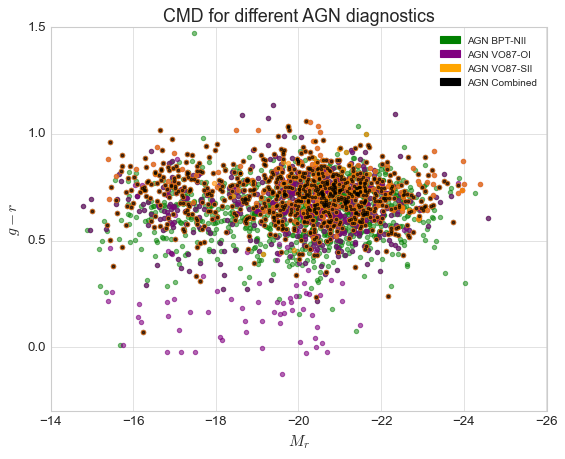

In [187]:


# Create the figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Scatter plots for different AGN classifications
ax.scatter(merged_df_filtered_SN2['M_r'][merged_df_filtered_SN2['AGN_BPT-NII'] == True], 
           merged_df_filtered_SN2['color_gr'][merged_df_filtered_SN2['AGN_BPT-NII'] == True], 
           color='green', s=15, alpha=0.5, label='AGN BPT-NII')

ax.scatter(merged_df_filtered_SN2['M_r'][merged_df_filtered_SN2['AGN_VO87-OI'] == True], 
           merged_df_filtered_SN2['color_gr'][merged_df_filtered_SN2['AGN_VO87-OI'] == True], 
           color='purple', s=15, alpha=0.6, label='AGN VO87-OI')

ax.scatter(merged_df_filtered_SN2['M_r'][merged_df_filtered_SN2['AGN_VO87-SII'] == True], 
           merged_df_filtered_SN2['color_gr'][merged_df_filtered_SN2['AGN_VO87-SII'] == True], 
           color='darkorange', s=15, alpha=0.6, label='AGN VO87-SII')

ax.scatter(merged_df_filtered_SN2['M_r'][merged_df_filtered_SN2['AGN_combinado'] == True], 
           merged_df_filtered_SN2['color_gr'][merged_df_filtered_SN2['AGN_combinado'] == True], 
           color='black', s=5, alpha=0.6, label='AGN Combined')

# Invert x-axis
ax.invert_xaxis()
ax.set_ylim(-0.3,1.5)

# Labels and title
ax.set_xlabel(r'$M_r$', fontsize=14)
ax.set_ylabel(r'$g - r$', fontsize=14)
ax.set_title('CMD for different AGN diagnostics', fontsize=16)

# Legend using patches
legend_handles = [
    mpatches.Patch(color='green', label='AGN BPT-NII'),
    mpatches.Patch(color='purple', label='AGN VO87-OI'),
    mpatches.Patch(color='orange', label='AGN VO87-SII'),
    mpatches.Patch(color='black', label='AGN Combined')
]
ax.legend(handles=legend_handles, loc='upper right', prop={'size': 9})

# Show plot
plt.show()


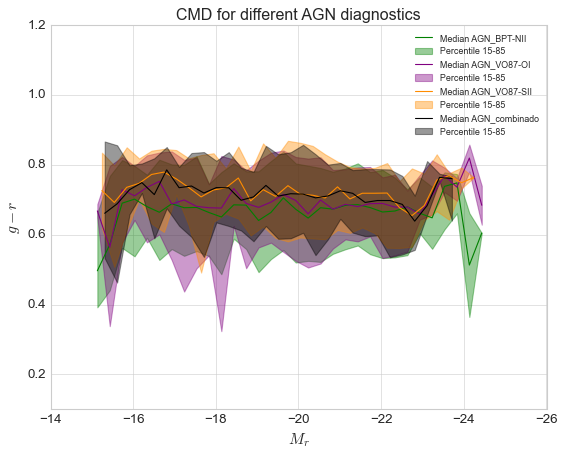

In [188]:
#fig, axs = plt.subplots(2, 2, figsize=(14, 12), constrained_layout=True)
#axs = axs.flatten()

#diagramas para cada clasificación de AGN
for idx, (agn_type, color) in enumerate(agn_classifications.items()):
    data = df_galaxies_SN2[df_galaxies_SN2[agn_type]]
    

    color_column = 'color_gr' 
    mag_column = 'M_r'       
    bin_centers, medians, perc_15, perc_85 = color_magnitude_diagram_statistics(data, color_column, mag_column)
    plt.plot(bin_centers, medians, label=f'Median {agn_type}', color=color)
    plt.fill_between(bin_centers, perc_15, perc_85, color=color, alpha=0.4, label='Percentile 15-85')
 
    plt.title(f'CMD for different AGN diagnostics')
    plt.xlabel(r'$M_r$', fontsize=14)
    plt.ylabel(r'$g - r$', fontsize=14)
    plt.ylim(0.1,1.2)
    plt.xlim(-14, -26)
    plt.legend(loc='upper right', fontsize=8)
    

plt.show()


In [314]:
"""
fig, axs = plt.subplots(1, 1, figsize=(8, 15), constrained_layout=True)  

#Hα / OIII 4363
axs[0].scatter(df_galaxies_SN2['color_gr'], df_galaxies_SN2['ratio_Hα/OIII 4363'], s=0.5, color='purple', label='Todas las galaxias')
axs[0].scatter(df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True, 'color_gr'], 
            df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True, 'ratio_Hα/OIII 4363'], 
            s=5, alpha=0.6, color='green', label='AGN') #Galaxias con AGNs
axs[0].set_title('Hα / OIII 4363')
axs[0].set_ylim(min(df_galaxies_SN2['ratio_Hα/OIII 4363']), max(df_galaxies_SN2['ratio_Hα/OIII 4363']))
axs[0].set_xlabel('Color (g-r)')
axs[0].set_ylabel('Hα / OIII 4363')

handles, labels = axs[0].get_legend_handles_labels() #Para leyenda mejor ajustada
legend_handles = [mpatches.Patch(color='purple', label='Todas las galaxias'),
                   mpatches.Patch(color='green', label='AGN')]

axs[0].legend(handles=legend_handles, loc='upper right', prop={'size': 7}, scatterpoints=1)

#OIII 4959 flujo
axs[1].scatter(merged_df_filtered_SN2['color_gr'], merged_df_filtered_SN2['oiii_4363_flux'], s=0.5, color='purple', label='Todas las galaxias')
axs[1].scatter(merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True, 'color_gr'], 
            merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True, 'oiii_4363_flux'], 
            s=5, alpha=0.6, color='green', label='AGN')
axs[1].set_title('OIII 4959 Flux')
axs[1].set_xlabel('Color (g-r)')
axs[1].set_ylabel('OIII 4959 Flux')
axs[1].legend(handles=legend_handles, loc='upper right', prop={'size': 7}, scatterpoints=1)

#Hα flujo
axs[2].scatter(merged_df_filtered_SN2['color_gr'], merged_df_filtered_SN2['h_alpha_flux'], s=0.5, color='purple', label='Todas las galaxias')
axs[2].scatter(merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True, 'color_gr'], 
            merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True, 'h_alpha_flux'], 
            s=5, alpha=0.6, color='green', label='AGN')
axs[2].set_title('Hα Flux   ')
axs[2].set_xlabel('Color (g-r)')
axs[2].set_ylabel('Hα Flux')
axs[2].legend(handles=legend_handles, loc='upper right', prop={'size': 7}, scatterpoints=1)
"""



"\nfig, axs = plt.subplots(1, 1, figsize=(8, 15), constrained_layout=True)  \n\n#Hα / OIII 4363\naxs[0].scatter(df_galaxies_SN2['color_gr'], df_galaxies_SN2['ratio_Hα/OIII 4363'], s=0.5, color='purple', label='Todas las galaxias')\naxs[0].scatter(df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True, 'color_gr'], \n            df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True, 'ratio_Hα/OIII 4363'], \n            s=5, alpha=0.6, color='green', label='AGN') #Galaxias con AGNs\naxs[0].set_title('Hα / OIII 4363')\naxs[0].set_ylim(min(df_galaxies_SN2['ratio_Hα/OIII 4363']), max(df_galaxies_SN2['ratio_Hα/OIII 4363']))\naxs[0].set_xlabel('Color (g-r)')\naxs[0].set_ylabel('Hα / OIII 4363')\n\nhandles, labels = axs[0].get_legend_handles_labels() #Para leyenda mejor ajustada\nlegend_handles = [mpatches.Patch(color='purple', label='Todas las galaxias'),\n                   mpatches.Patch(color='green', label='AGN')]\n\naxs[0].legend(handles=legend_handles, loc='upper right', pr

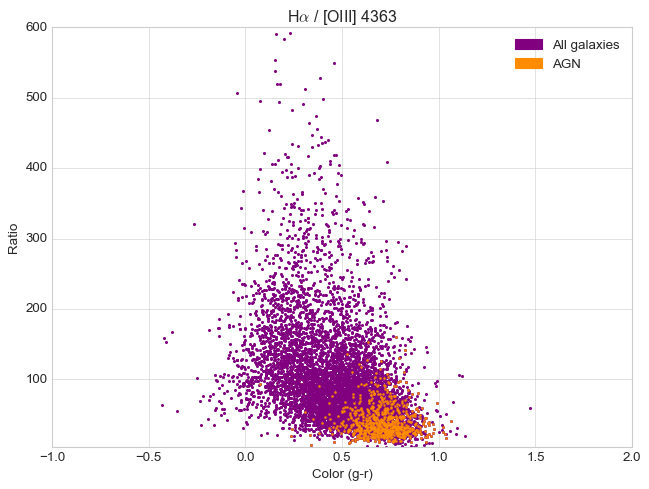

In [126]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(df_galaxies_SN2['color_gr'], 
           df_galaxies_SN2['ratio_Hα/OIII 4363'], 
           s=3, color='purple', label='Todas las galaxias')

ax.scatter(df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'], 'color_gr'], 
           df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'], 'ratio_Hα/OIII 4363'], 
           s=2, alpha=0.8, color='darkorange', label='AGN')

ax.set_title(r'H$\alpha$ / [OIII] 4363')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')
ax.set_ylim(df_galaxies_SN2['ratio_Hα/OIII 4363'].min(), 
            600)

legend_handles = [mpatches.Patch(color='purple', label='All galaxies'),
                  mpatches.Patch(color='darkorange', label='AGN')]

ax.legend(handles=legend_handles, loc='upper right', prop={'size': 12})
plt.show()


In [582]:
"""
# OIII 5007/ OIII 4363 

fig, axs = plt.subplots(3, 1, figsize=(8, 15), constrained_layout=True)  

axs[0].scatter(df_galaxies_SN2['color_gr'], df_galaxies_SN2['ratio_OIII 5007/OIII 4363'], s=0.5, color='purple', label='Todas las galaxias')
axs[0].scatter(df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True , 'color_gr'], 
            df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True , 'ratio_OIII 5007/OIII 4363'], 
            s=1, alpha=0.6, color='orange', label='AGN') #Galaxias con AGNs
axs[0].set_title('OIII 5007/ OIII 4363')
axs[0].set_ylim(0, 200)
axs[0].set_xlabel('Color (g-r)')
axs[0].set_ylabel('OIII 5007/ OIII 4363')

handles, labels = axs[0].get_legend_handles_labels() #Para leyenda mejor ajustada
legend_handles = [mpatches.Patch(color='purple', label='Todas las galaxias'),
                   mpatches.Patch(color='orange', label='AGN')]

axs[0].legend(handles=legend_handles, loc='upper right', prop={'size': 7}, scatterpoints=1)


#OIII 4959 flujo
axs[1].scatter(merged_df_filtered_SN2['color_gr'], merged_df_filtered_SN2['oiii_5007_flux'], s=0.5, color='purple', label='Todas las galaxias')
axs[1].scatter(merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True , 'color_gr'], 
            merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True , 'oiii_5007_flux'], 
            s=1, alpha=0.6, color='orange', label='AGN')
axs[1].set_title('OIII 5007 Flux')
axs[1].set_xlabel('Color (g-r)')
axs[1].set_ylabel('OIII 5007 Flux')
axs[1].legend(handles=legend_handles, loc='upper right', prop={'size': 7}, scatterpoints=1)

#Hα flujo
axs[2].scatter(merged_df_filtered_SN2['color_gr'], merged_df_filtered_SN2['oiii_4363_flux'], s=0.5, color='purple', label='Todas las galaxias')
axs[2].scatter(merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True , 'color_gr'], 
            merged_df_filtered_SN2.loc[merged_df_filtered_SN2['AGN_combinado'] == True , 'oiii_4363_flux'], 
            s=1, alpha=0.6, color='orange', label='AGN')
axs[2].set_title(' OIII 4363 Flux  ')
axs[2].set_xlabel('Color (g-r)')
axs[2].set_ylabel('OIII 4363 Flux')
axs[2].legend(handles=legend_handles, loc='upper right', prop={'size': 7}, scatterpoints=1)


plt.show()"""

"\n# OIII 5007/ OIII 4363 \n\nfig, axs = plt.subplots(3, 1, figsize=(8, 15), constrained_layout=True)  \n\naxs[0].scatter(df_galaxies_SN2['color_gr'], df_galaxies_SN2['ratio_OIII 5007/OIII 4363'], s=0.5, color='purple', label='Todas las galaxias')\naxs[0].scatter(df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True , 'color_gr'], \n            df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'] == True , 'ratio_OIII 5007/OIII 4363'], \n            s=1, alpha=0.6, color='orange', label='AGN') #Galaxias con AGNs\naxs[0].set_title('OIII 5007/ OIII 4363')\naxs[0].set_ylim(0, 200)\naxs[0].set_xlabel('Color (g-r)')\naxs[0].set_ylabel('OIII 5007/ OIII 4363')\n\nhandles, labels = axs[0].get_legend_handles_labels() #Para leyenda mejor ajustada\nlegend_handles = [mpatches.Patch(color='purple', label='Todas las galaxias'),\n                   mpatches.Patch(color='orange', label='AGN')]\n\naxs[0].legend(handles=legend_handles, loc='upper right', prop={'size': 7}, scatterpoints=1)\n\n\n#O

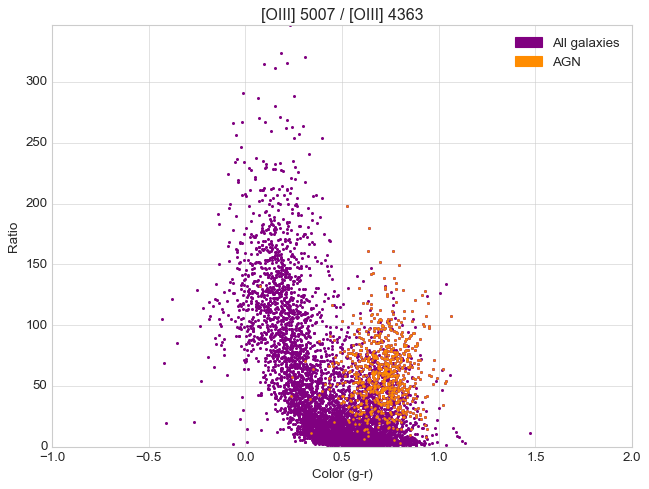

In [127]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(df_galaxies_SN2['color_gr'], 
           df_galaxies_SN2['ratio_OIII 5007/OIII 4363'], 
           s=3, color='purple', label='Todas las galaxias')

ax.scatter(df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'], 'color_gr'], 
           df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'], 'ratio_OIII 5007/OIII 4363'], 
           s=2, alpha=0.8, color='darkorange', label='AGN')

ax.set_title('[OIII] 5007 / [OIII] 4363')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')
ax.set_ylim(0, 
            df_galaxies_SN2['ratio_OIII 5007/OIII 4363'].max())

legend_handles = [mpatches.Patch(color='purple', label='All galaxies'),
                  mpatches.Patch(color='darkorange', label='AGN')]

ax.legend(handles=legend_handles, loc='upper right', prop={'size': 12})
plt.show()


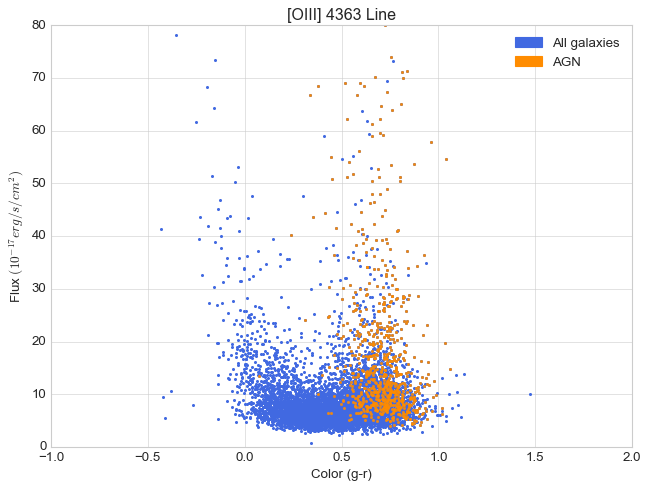

In [168]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(df_galaxies_SN2['color_gr'], 
           merged_df_filtered_SN2['oiii_4363_flux'], 
           s=3, color='royalblue', label='Todas las galaxias')

ax.scatter(df_galaxies_SN2.loc[df_galaxies_SN2['AGN_combinado'], 'color_gr'], 
           merged_df_filtered_SN2.loc[df_galaxies_SN2['AGN_combinado'], 'oiii_4363_flux'], 
           s=3, alpha=0.8, color='darkorange', label='AGN')

ax.set_title('[OIII] 4363 Line')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel(r'Flux $(10^{-17} erg/s/cm^2)$')
ax.set_ylim(0, 80)
#ax.set_xlim(-0.7, 1.2)

legend_handles = [mpatches.Patch(color='royalblue', label='All galaxies'),
                  mpatches.Patch(color='darkorange', label='AGN')]

ax.legend(handles=legend_handles, loc='upper right', prop={'size': 12})
plt.show()

### Residuales de clasificacion AGN:


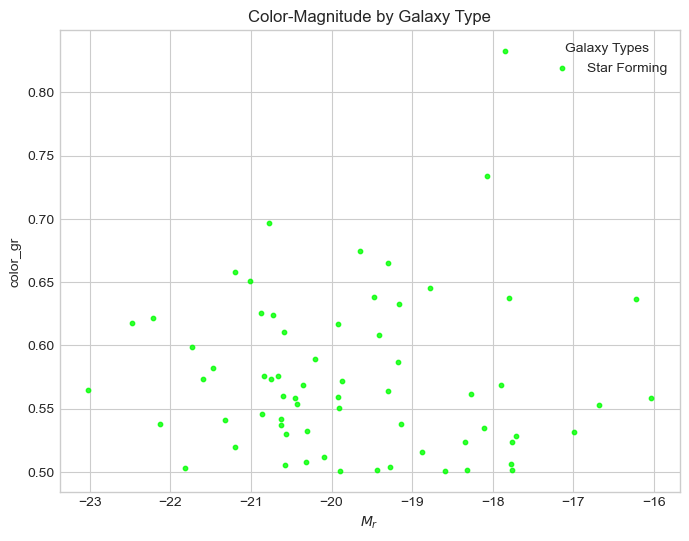

In [26]:
residual_AGN = df_galaxies_SN2.loc[
    (df_galaxies_SN2['AGN_combinado'] == False) &
    (df_galaxies_SN2['Galaxy_Type'] == 'Star Forming') &
    (df_galaxies_SN2['color_gr'] >= 0.5) &    ######Is this arbitrary choice relevant in the proceding results?
    (df_galaxies_SN2['color_gr'] <= 1) & 
    (df_galaxies_SN2['ratio_OIII 5007/OIII 4363'] >= 25) & 
    (df_galaxies_SN2['ratio_OIII 5007/OIII 4363'] <= 150)
].index

graficos.color_Mag_by_label(df_galaxies_SN2.loc[residual_AGN], 'color_gr', label_column='Galaxy_Type', color_map='brg')


In [28]:
residuales_lista = np.array([134,  274,  372,  496,  565,  600,  602,  650,  716,  784,  865,
             889, 1301, 1404, 1540, 1657, 1795, 1876, 2064, 2150, 2173, 2181,
            2236, 2290, 2425, 2452, 2509, 2667, 2679, 2741, 2752, 2903, 2997,
            3061, 3085, 3091, 3131, 3228, 3752, 3800, 3834, 3930, 3955, 4363,
            4478, 4487, 4564, 5010, 5025, 5320, 5578, 5678, 5869, 6212, 6221,
            6298, 6336, 6340, 6353, 6470, 6486, 6572, 6780, 6781, 6818, 6881])


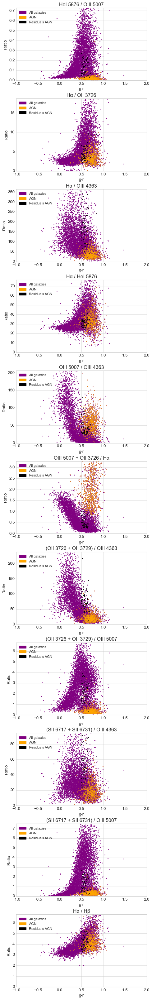

In [578]:
fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  
x_1 = df_galaxies_SN2['color_gr']  # Color g-r

# Filtrar galaxias clasificadas como AGN por VO87-OI y por criterio combinado
agn_vo87 = df_galaxies_SN2[df_galaxies_SN2['AGN_VO87-OI']]
agn_combined = df_galaxies_SN2[df_galaxies_SN2['AGN_combinado']]
residual_galaxies = df_galaxies_SN2.loc[residual_AGN]

# Gráfico 1: HeI 5876 / OIII 5007
axs[0].scatter(x_1, df_galaxies_SN2['ratio_HeI 5876/OIII 5007'], s=2, color='purple', label='All galaxies')
#axs[0].scatter(agn_vo87['color_gr'], agn_vo87['ratio_HeI 5876/OIII 5007'], s=2, color='green', label='AGN_VO87-OI')
axs[0].scatter(agn_combined['color_gr'], agn_combined['ratio_HeI 5876/OIII 5007'], s=2, color='orange', alpha=0.6, label='AGN')
axs[0].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_HeI 5876/OIII 5007'], s=2, color='black', label='Residuals')
axs[0].set_title('HeI 5876 / OIII 5007')
axs[0].legend(loc='upper left', fontsize=10)
axs[0].set_ylim(0, df_galaxies_SN2['ratio_HeI 5876/OIII 5007'].quantile(0.99))

# Gráfico 2: Hα / OII 3726
axs[1].scatter(x_1, df_galaxies_SN2['ratio_Hα/OII 3726'], s=2, color='purple', label='All galaxies')
#axs[1].scatter(agn_vo87['color_gr'], agn_vo87['ratio_Hα/OII 3726'], s=2, color='green', label='AGN_VO87-OI')
axs[1].scatter(agn_combined['color_gr'], agn_combined['ratio_Hα/OII 3726'], s=2, color='orange', alpha=0.6, label='AGN')
axs[1].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/OII 3726'], s=2, color='black', label='Residuals')
axs[1].set_title('Hα / OII 3726')
axs[1].set_ylim(0, df_galaxies_SN2['ratio_Hα/OII 3726'].quantile(0.99))
axs[1].legend(loc='upper left', fontsize=10)

# Gráfico 3: Hα / OIII 4363
axs[2].scatter(x_1, df_galaxies_SN2['ratio_Hα/OIII 4363'], s=2, color='purple', label='All galaxies')
#axs[2].scatter(agn_vo87['color_gr'], agn_vo87['ratio_Hα/OIII 4363'], s=2, color='green', label='AGN_VO87-OI')
axs[2].scatter(agn_combined['color_gr'], agn_combined['ratio_Hα/OIII 4363'], s=2, color='orange', alpha=0.6, label='AGN')
axs[2].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/OIII 4363'], s=2, color='black', label='Residuals')
axs[2].set_title('Hα / OIII 4363')
axs[2].set_ylim(0, df_galaxies_SN2['ratio_Hα/OIII 4363'].quantile(0.99))
axs[2].legend(loc='upper left', fontsize=10)

# Gráfico 4: Hα / HeI 5876
axs[3].scatter(x_1, df_galaxies_SN2['ratio_Hα/HeI 5876'], s=2, color='purple', label='All galaxies')
#axs[3].scatter(agn_vo87['color_gr'], agn_vo87['ratio_Hα/HeI 5876'], s=2, color='green', label='AGN_VO87-OI')
axs[3].scatter(agn_combined['color_gr'], agn_combined['ratio_Hα/HeI 5876'], s=2, color='orange', alpha=0.6, label='AGN')
axs[3].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/HeI 5876'], s=2, color='black', label='Residuals')
axs[3].set_title('Hα / HeI 5876')
axs[3].set_ylim(0, df_galaxies_SN2['ratio_Hα/HeI 5876'].quantile(0.99))
axs[3].legend(loc='upper left', fontsize=10)

# Gráfico 5: OIII 5007 / OIII 4363
axs[4].scatter(x_1, df_galaxies_SN2['ratio_OIII 5007/OIII 4363'], s=2, color='purple', label='All galaxies')
#axs[4].scatter(agn_vo87['color_gr'], agn_vo87['ratio_OIII 5007/OIII 4363'], s=2, color='green', label='AGN_VO87-OI')
axs[4].scatter(agn_combined['color_gr'], agn_combined['ratio_OIII 5007/OIII 4363'], s=2, color='orange', alpha=0.6, label='AGN')
axs[4].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_OIII 5007/OIII 4363'], s=2, color='black', label='Residuals')
axs[4].set_title('OIII 5007 / OIII 4363')
axs[4].set_ylim(0, df_galaxies_SN2['ratio_OIII 5007/OIII 4363'].quantile(0.99))
axs[4].legend(loc='upper left', fontsize=10)

# Gráfico 6: (OIII 5007 + OII 3726) / Hα
axs[5].scatter(x_1, (1/df_galaxies_SN2['ratio_Hα/OIII 5007']) + (1/df_galaxies_SN2['ratio_Hα/OII 3726']), s=2, color='purple', label='All galaxies')
#axs[5].scatter(agn_vo87['color_gr'], (1/agn_vo87['ratio_Hα/OIII 5007']) + (1/agn_vo87['ratio_Hα/OII 3726']), s=2, color='green', label='AGN_VO87-OI')
axs[5].scatter(agn_combined['color_gr'], (1/agn_combined['ratio_Hα/OIII 5007']) + (1/agn_combined['ratio_Hα/OII 3726']), s=2, color='orange', alpha=0.6, label='AGN')
axs[5].scatter(residual_galaxies['color_gr'], (1/residual_galaxies['ratio_Hα/OIII 5007']) + (1/residual_galaxies['ratio_Hα/OII 3726']), s=2, color='black', label='Residuals')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')
axs[5].set_ylim(0, ((1/df_galaxies_SN2['ratio_Hα/OIII 5007']) + (1/df_galaxies_SN2['ratio_Hα/OII 3726'])).quantile(0.99))
axs[5].legend(loc='upper left', fontsize=10)

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
axs[6].scatter(x_1, (1 / df_galaxies_SN2['ratio_OIII 4363/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 4363/OII 3729']), s=2, color='purple', label='All galaxies')
#axs[6].scatter(agn_vo87['color_gr'], (1 / agn_vo87['ratio_OIII 4363/OII 3726']) + (1 / agn_vo87['ratio_OIII 4363/OII 3729']), s=2, color='green', label='AGN_VO87-OI')
axs[6].scatter(agn_combined['color_gr'], (1 / agn_combined['ratio_OIII 4363/OII 3726']) + (1 / agn_combined['ratio_OIII 4363/OII 3729']), s=2, color='orange', alpha=0.6, label='AGN')
axs[6].scatter(residual_galaxies['color_gr'], (1 / residual_galaxies['ratio_OIII 4363/OII 3726']) + (1 / residual_galaxies['ratio_OIII 4363/OII 3729']), s=2, color='black', label='Residuals')
axs[6].set_title('(OII 3726 + OII 3729) / OIII 4363')
axs[6].set_ylim(0, ((1 / df_galaxies_SN2['ratio_OIII 4363/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 4363/OII 3729'])).quantile(0.99))
axs[6].legend(loc='upper left', fontsize=10)

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
axs[7].scatter(x_1, (1 / df_galaxies_SN2['ratio_OIII 5007/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 5007/OII 3729']), s=2, color='purple', label='All galaxies')
#axs[7].scatter(agn_vo87['color_gr'], (1 / agn_vo87['ratio_OIII 5007/OII 3726']) + (1 / agn_vo87['ratio_OIII 5007/OII 3729']), s=2, color='green', label='AGN_VO87-OI')
axs[7].scatter(agn_combined['color_gr'], (1 / agn_combined['ratio_OIII 5007/OII 3726']) + (1 / agn_combined['ratio_OIII 5007/OII 3729']), s=2, color='orange', alpha=0.6, label='AGN')
axs[7].scatter(residual_galaxies['color_gr'], (1 / residual_galaxies['ratio_OIII 5007/OII 3726']) + (1 / residual_galaxies['ratio_OIII 5007/OII 3729']), s=2, color='black', label='Residuals')
axs[7].set_title('(OII 3726 + OII 3729) / OIII 5007')
axs[7].set_ylim(0, ((1 / df_galaxies_SN2['ratio_OIII 5007/OII 3726']) + (1 / df_galaxies_SN2['ratio_OIII 5007/OII 3729'])).quantile(0.99))
axs[7].legend(loc='upper left', fontsize=10)

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363
axs[8].scatter(x_1, df_galaxies_SN2['ratio_SII 6717/OIII 4363'] + df_galaxies_SN2['ratio_SII 6731/OIII 4363'], s=2, color='purple', label='All galaxies')
#axs[8].scatter(agn_vo87['color_gr'], agn_vo87['ratio_SII 6717/OIII 4363'] + agn_vo87['ratio_SII 6731/OIII 4363'], s=2, color='green', label='AGN_VO87-OI')
axs[8].scatter(agn_combined['color_gr'], agn_combined['ratio_SII 6717/OIII 4363'] + agn_combined['ratio_SII 6731/OIII 4363'], s=2, color='orange', alpha=0.6, label='AGN')
axs[8].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_SII 6717/OIII 4363'] + residual_galaxies['ratio_SII 6731/OIII 4363'], s=2, color='black', label='Residuals')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')
axs[8].set_ylim(0, (df_galaxies_SN2['ratio_SII 6717/OIII 4363'] + df_galaxies_SN2['ratio_SII 6731/OIII 4363']).quantile(0.99))
axs[8].legend(loc='upper left', fontsize=10)

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
axs[9].scatter(x_1, df_galaxies_SN2['ratio_SII 6717/OIII 5007'] + df_galaxies_SN2['ratio_SII 6731/OIII 5007'], s=2, color='purple', label='All galaxies')
#axs[9].scatter(agn_vo87['color_gr'], agn_vo87['ratio_SII 6717/OIII 5007'] + agn_vo87['ratio_SII 6731/OIII 5007'], s=2, color='green', label='AGN_VO87-OI')
axs[9].scatter(agn_combined['color_gr'], agn_combined['ratio_SII 6717/OIII 5007'] + agn_combined['ratio_SII 6731/OIII 5007'], s=2, color='orange', alpha=0.6, label='AGN')
axs[9].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_SII 6717/OIII 5007'] + residual_galaxies['ratio_SII 6731/OIII 5007'], s=2, color='black', label='Residuals')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')
axs[9].set_ylim(0, (df_galaxies_SN2['ratio_SII 6717/OIII 5007'] + df_galaxies_SN2['ratio_SII 6731/OIII 5007']).quantile(0.99))
axs[9].legend(loc='upper left', fontsize=10)

# Gráfico 11: Hα / Hβ
axs[10].scatter(x_1, df_galaxies_SN2['ratio_Hα/Hβ'], s=2, color='purple', label='All galaxies')
#axs[10].scatter(agn_vo87['color_gr'], agn_vo87['ratio_Hα/Hβ'], s=2, color='green', label='AGN_VO87-OI')
axs[10].scatter(agn_combined['color_gr'], agn_combined['ratio_Hα/Hβ'], s=2, color='orange', alpha=0.6, label='AGN')
axs[10].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/Hβ'], s=2, color='black', label='Residuals')
axs[10].set_title('Hα / Hβ')
axs[10].set_ylim(0, df_galaxies_SN2['ratio_Hα/Hβ'].quantile(0.99))
axs[10].legend(loc='upper left', fontsize=10)

legend_handles = [mpatches.Patch(color='purple', label='All galaxies'),
                  mpatches.Patch(color='orange', label='AGN'),
                  mpatches.Patch(color='black', label='Residuals AGN')]

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Ratio')
    ax.legend(handles=legend_handles, loc='upper left', prop={'size': 10})

plt.show()

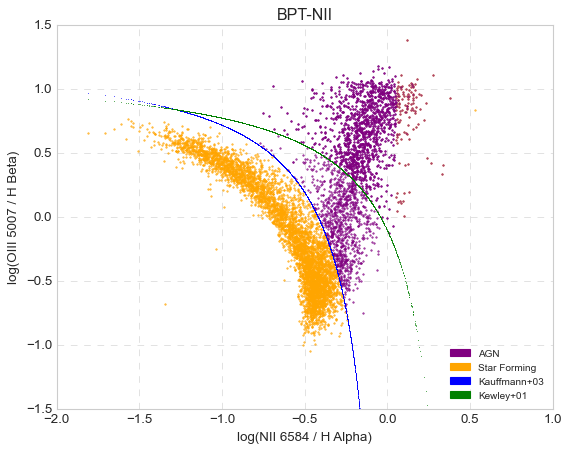

In [170]:
#x_data_residuales = merged_df['nii_6584_flux'] / merged_df['h_alpha_flux']
#y_data_residuales = merged_df['oiii_4959_flux'] / merged_df['h_beta_flux']
flujos_residuales = merged_df_filtered_SN2.loc[residual_AGN]
x_data_residuales = np.log10(flujos_residuales['nii_6584_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'] / flujos_residuales['h_alpha_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'])
y_data_residuales = np.log10(flujos_residuales['oiii_5007_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'] / flujos_residuales['h_beta_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'])

x_data = np.log10(merged_df_filtered_SN2['nii_6584_flux'] / merged_df_filtered_SN2['h_alpha_flux'])
y_data = np.log10(merged_df_filtered_SN2['oiii_5007_flux'] / merged_df_filtered_SN2['h_beta_flux'])

# Kauffmann+03 and Kewley+01
log_y_kauffmann = 0.61 / (x_data - 0.05) + 1.3
log_y_kewley = 0.61 / ((x_data) - 0.47) + 1.19

ids_encima_kewley = merged_df_filtered_SN2[y_data > log_y_kewley].index
ids_encima_kauffman = merged_df_filtered_SN2[y_data > log_y_kauffmann].index

plt.figure(figsize=(8, 6))

plt.plot(x_data[y_data <= log_y_kauffmann], y_data[y_data <= log_y_kauffmann], '.', color='orange', alpha=0.7, markersize=3)

plt.plot(x_data[y_data > log_y_kewley], y_data[y_data > log_y_kewley], '.', color='purple', alpha=0.6, markersize=3)
plt.plot(x_data[y_data > log_y_kauffmann], y_data[y_data > log_y_kauffmann], '.', color='purple', alpha=0.7, markersize=3, label='AGN')

plt.plot(x_data, log_y_kauffmann, '.', color='blue', label='Kauffmann+03', markersize=0.6, alpha=1)
plt.plot(x_data, log_y_kewley, '.', color='green', label='Kewley+01', markersize=0.6, alpha=1)

#plt.plot(x_data_residuales, y_data_residuales, '.', color='black', alpha=1, markersize=3, label='Residuals "Star Forming"')
#plt.yscale('log')
#plt.xscale('log')
plt.ylim(-1.5,1.5)

legend_handles = [mpatches.Patch(color='purple', label='AGN'),
                  mpatches.Patch(color='orange', label='Star Forming'),
                  mpatches.Patch(color='blue', label='Kauffmann+03'),
                  mpatches.Patch(color='green', label='Kewley+01')]
                  #mpatches.Patch(color='black', label='Residuals')]
plt.ylabel('log(OIII 5007 / H Beta)')
plt.xlabel('log(NII 6584 / H Alpha)')
plt.title('BPT-NII')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.legend(handles=legend_handles, loc='lower right', prop={'size': 9})
plt.show()

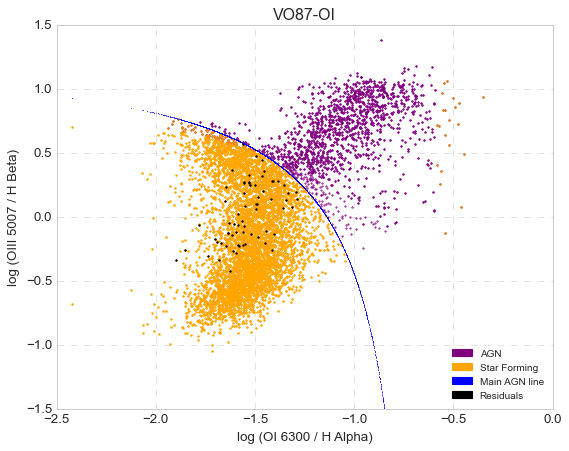

In [155]:
x_data_residuales = np.log10(flujos_residuales['oi_6300_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'] / flujos_residuales['h_alpha_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'])
y_data_residuales = np.log10(flujos_residuales['oiii_5007_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'] / flujos_residuales['h_beta_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'])

x_data = np.log10(merged_df_filtered_SN2['oi_6300_flux'] / merged_df_filtered_SN2['h_alpha_flux'])
y_data = np.log10(merged_df_filtered_SN2['oiii_5007_flux']/ merged_df_filtered_SN2['h_beta_flux'])

### Corregigas por extinción
#x_data = np.log10(merged_df['oi_6300_flux_dered'] / merged_df['h_alpha_flux_dered'])
#y_data = np.log10(merged_df['oiii_5007_flux_dered'] / merged_df['h_beta_flux_dered'])

# AGN line y LINER/Sy2 line
log_y_agn = 0.73 / (x_data + 0.59) + 1.33
log_y_LINER = 1.18 / (x_data) + 1.30

ids_agn = merged_df_filtered_SN2[y_data > log_y_agn].index

plt.figure(figsize=(8, 6))

plt.plot(x_data[y_data <= log_y_agn], y_data[y_data <= log_y_agn], '.', color='orange', alpha=0.7, markersize=3)
plt.plot(x_data[y_data > log_y_LINER], y_data[y_data > log_y_LINER], '.', color='purple', alpha=0.7, markersize=3)
plt.plot(x_data[y_data > log_y_agn], y_data[y_data > log_y_agn], '.', color='purple', alpha=0.7, markersize=3, label='AGN')
plt.plot(x_data[y_data <= log_y_agn], y_data[y_data <= log_y_agn], '.', color='orange', alpha=0.7, markersize=3)

plt.plot(x_data_residuales, y_data_residuales, '.', color='black', alpha=1, markersize=3, label='Residuals "Star Forming"')

plt.plot(x_data, log_y_agn, '.', color='blue', label='main AGN line', markersize=0.5)
#plt.plot(x_data, log_y_LINER, '.', color='red', label='LINER/Sy2 line', markersize=0.2)

#plt.yscale('log')
#plt.xscale('log')
plt.ylim(-1.5,1.5)
legend_handles = [mpatches.Patch(color='purple', label='AGN'),
                  mpatches.Patch(color='orange', label='Star Forming'),
                  mpatches.Patch(color='blue', label='Main AGN line'),
                  mpatches.Patch(color='black', label='Residuals')]
plt.legend(handles=legend_handles, loc='lower right', prop={'size': 9})

plt.xlabel('log (OI 6300 / H Alpha)')
plt.ylabel('log (OIII 5007 / H Beta)')
plt.title('VO87-OI')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

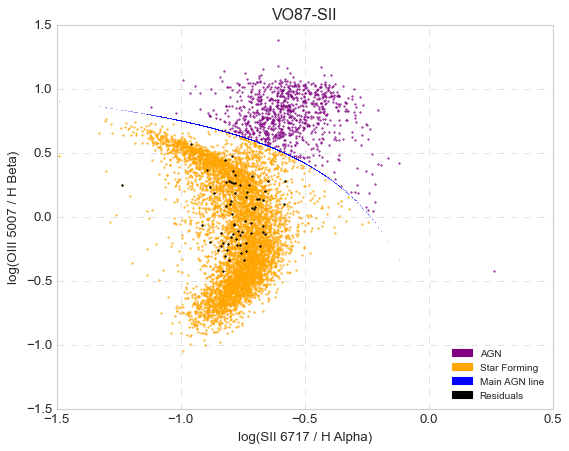

In [157]:
x_data_residuales = np.log10(flujos_residuales['sii_6717_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'] / flujos_residuales['h_alpha_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'])
y_data_residuales = np.log10(flujos_residuales['oiii_5007_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'] / flujos_residuales['h_beta_flux'][flujos_residuales['Galaxy_Type']=='Star Forming'])

x_data = np.log10(merged_df_filtered_SN2['sii_6717_flux'] / merged_df_filtered_SN2['h_alpha_flux'])
y_data = np.log10(merged_df_filtered_SN2['oiii_5007_flux'] / merged_df_filtered_SN2['h_beta_flux'])


# AGN line y LINER/Sy2 line
log_y_agn = 0.72 / ((x_data) - 0.32) + 1.30
log_y_LINER = 1.89 / (x_data) + 0.76

ids_agn = merged_df_filtered_SN2[y_data > log_y_agn].index

plt.figure(figsize=(8, 6))

plt.plot(x_data[y_data > log_y_agn], y_data[y_data > log_y_agn], '.', color='purple', alpha=0.7, markersize=3, label='AGN')

plt.plot(x_data[y_data <= log_y_agn], y_data[y_data <= log_y_agn], '.', color='orange', alpha=0.7, markersize=3)
plt.plot(x_data, log_y_agn, '.', color='blue', label='main AGN line', markersize=0.3)
#plt.plot(x_data, log_y_LINER, '.', color='red', label='LINER/Sy2 line', markersize=0.2)
plt.plot(x_data_residuales, y_data_residuales, '.', color='black', alpha=1, markersize=3, label='Residuals "Star Forming"')

#plt.yscale('log')
#plt.xscale('log')
legend_handles = [mpatches.Patch(color='purple', label='AGN'),
                  mpatches.Patch(color='orange', label='Star Forming'),
                  mpatches.Patch(color='blue', label='Main AGN line'),
                  mpatches.Patch(color='black', label='Residuals')]
plt.legend(handles=legend_handles, loc='lower right', prop={'size': 9})

plt.ylim(-1.5, 1.5)
plt.xlim(-1.5, 0.5)
plt.xlabel('log(SII 6717 / H Alpha)')
plt.ylabel('log(OIII 5007 / H Beta)')
plt.title('VO87-SII')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

## Clustering con DBSCAN

In [587]:
ratio_columns = [col for col in df_galaxies_SN2.columns if 'ratio_' in col]

ratios_data = df_galaxies_SN2[ratio_columns]

len(ratio_columns)

83

In [588]:
"""
# Graficar histogramas para cada columna de ratios
fig, axs = plt.subplots(len(ratio_columns), 1, figsize=(8, len(ratio_columns) * 3), constrained_layout=True)

for i, col in enumerate(ratio_columns):
    axs[i].hist(ratios_data[col], bins=50, color='purple', alpha=0.7)
    axs[i].set_title(f'Distribución de {col}')
    axs[i].set_xlabel('Valor del ratio')
    axs[i].set_ylabel('Frecuencia')
    #axs[i].set_xlim([0, ratios_data[col].quantile(0.99)])  
plt.show()"""


"\n# Graficar histogramas para cada columna de ratios\nfig, axs = plt.subplots(len(ratio_columns), 1, figsize=(8, len(ratio_columns) * 3), constrained_layout=True)\n\nfor i, col in enumerate(ratio_columns):\n    axs[i].hist(ratios_data[col], bins=50, color='purple', alpha=0.7)\n    axs[i].set_title(f'Distribución de {col}')\n    axs[i].set_xlabel('Valor del ratio')\n    axs[i].set_ylabel('Frecuencia')\n    #axs[i].set_xlim([0, ratios_data[col].quantile(0.99)])  \nplt.show()"

In [589]:
#IQR para cada columna de ratio
iqr_limits = {}

for col in ratio_columns:
    Q1 = ratios_data[col].quantile(0.15)
    Q3 = ratios_data[col].quantile(0.85)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR  # Límite superior típico para outliers
    iqr_limits[col] = upper_limit

print("Límites superiores basados en IQR para cada ratio:")
for col, limit in iqr_limits.items():
    print(f"{col}: {limit}")


Límites superiores basados en IQR para cada ratio:
ratio_OII 3729/OII 3726: 2.214857494128977
ratio_OIII 4363/OII 3726: 0.3608371392593529
ratio_OIII 4363/OII 3729: 0.3569095216859497
ratio_Hβ/OII 3726: 3.8941523419746114
ratio_Hβ/OII 3729: 3.8243107016555458
ratio_Hβ/OIII 4363: 91.6426122980078
ratio_OIII 4959/OII 3726: 2.6956062168946
ratio_OIII 4959/OII 3729: 2.690129172763453
ratio_OIII 4959/OIII 4363: 72.98283472942421
ratio_OIII 4959/Hβ: 2.8500035370182832
ratio_OIII 5007/OII 3726: 8.164018750370973
ratio_OIII 5007/OII 3729: 8.178391822251147
ratio_OIII 5007/OIII 4363: 219.0386991146288
ratio_OIII 5007/Hβ: 8.595216417110365
ratio_OIII 5007/OIII 4959: 4.159944874084177
ratio_HeI 5876/OII 3726: 0.4501077271844791
ratio_HeI 5876/OII 3729: 0.44308617388680926
ratio_HeI 5876/OIII 4363: 11.531622300216018
ratio_HeI 5876/Hβ: 0.22588757494933537
ratio_HeI 5876/OIII 4959: 2.377320445716856
ratio_HeI 5876/OIII 5007: 0.8814904851332721
ratio_OI 6300/OII 3726: 0.8146351469088284
ratio_OI 630

In [590]:
# Recorte usando los límites calculados en el IQR
ratios_data_clipped = ratios_data.copy()

for col in ratio_columns:
    limit = iqr_limits[col]
    ratios_data_clipped[col] = ratios_data[col].clip(upper=limit)

# Normalización
ratios_data_norm = ratios_data_clipped.copy()
for i, col in enumerate(ratio_columns):
    max_value = ratios_data_clipped[col].max()
    ratios_data_norm[col] = ratios_data_clipped[col] / max_value

# Crear un nuevo DataFrame con los ratios normalizados
df_galaxies_SN2_normalized = df_galaxies_SN2.copy()
df_galaxies_SN2_normalized[ratio_columns] = ratios_data_norm


In [591]:
df_galaxies_SN2_normalized

,specObjId,color_gr,M_r,z,AGN_Kewley,AGN_VO87-OI,AGN_BPT-NII,AGN_VO87-SII,ratio_OII 3729/OII 3726,ratio_OIII 4363/OII 3726,ratio_OIII 4363/OII 3729,ratio_Hβ/OII 3726,ratio_Hβ/OII 3729,ratio_Hβ/OIII 4363,ratio_OIII 4959/OII 3726,ratio_OIII 4959/OII 3729,ratio_OIII 4959/OIII 4363,ratio_OIII 4959/Hβ,ratio_OIII 5007/OII 3726,ratio_OIII 5007/OII 3729,ratio_OIII 5007/OIII 4363,ratio_OIII 5007/Hβ,ratio_OIII 5007/OIII 4959,ratio_HeI 5876/OII 3726,ratio_HeI 5876/OII 3729,ratio_HeI 5876/OIII 4363,ratio_HeI 5876/Hβ,ratio_HeI 5876/OIII 4959,ratio_HeI 5876/OIII 5007,ratio_OI 6300/OII 3726,ratio_OI 6300/OII 3729,ratio_OI 6300/OIII 4363,ratio_OI 6300/Hβ,ratio_OI 6300/OIII 4959,ratio_OI 6300/OIII 5007,ratio_OI 6300/HeI 5876,ratio_NII 6548/OII 3726,ratio_NII 6548/OII 3729,ratio_NII 6548/OIII 4363,ratio_NII 6548/Hβ,ratio_NII 6548/OIII 4959,ratio_NII 6548/OIII 5007,ratio_NII 6548/HeI 5876,ratio_NII 6548/OI 6300,ratio_Hα/OII 3726,ratio_Hα/OII 3729,ratio_Hα/OIII 4363,ratio_Hα/Hβ,ratio_Hα/OIII 4959,ratio_Hα/OIII 5007,ratio_Hα/HeI 5876,ratio_Hα/OI 6300,ratio_Hα/NII 6548,ratio_NII 6584/OII 3726,ratio_NII 6584/OII 3729,ratio_NII 6584/OIII 4363,ratio_NII 6584/Hβ,ratio_NII 6584/OIII 4959,ratio_NII 6584/OIII 5007,ratio_NII 6584/HeI 5876,ratio_NII 6584/OI 6300,ratio_NII 6584/NII 6548,ratio_NII 6584/Hα,ratio_SII 6717/OII 3726,ratio_SII 6717/OII 3729,ratio_SII 6717/OIII 4363,ratio_SII 6717/Hβ,ratio_SII 6717/OIII 4959,ratio_SII 6717/OIII 5007,ratio_SII 6717/HeI 5876,ratio_SII 6717/OI 6300,ratio_SII 6717/NII 6548,ratio_SII 6717/Hα,ratio_SII 6717/NII 6584,ratio_SII 6731/OII 3726,ratio_SII 6731/OII 3729,ratio_SII 6731/OIII 4363,ratio_SII 6731/Hβ,ratio_SII 6731/OIII 4959,ratio_SII 6731/OIII 5007,ratio_SII 6731/HeI 5876,ratio_SII 6731/OI 6300,ratio_SII 6731/NII 6548,ratio_SII 6731/Hα,ratio_SII 6731/NII 6584,ratio_SII 6731/SII 6717,ratio_(OII 3726 + OII 3729)/OIII 4363,ratio_(OII 3726 + OII 3729)/OIII 5007,ratio_(OIII 5007 + OII 3726)/Hα,ratio_(SII 6717 + SII 6731)/OIII 4363,ratio_(SII 6717 + SII 6731)/OIII 5007,Galaxy_Type,AGN_combinado,Cluster_norm_1
0,1890442071513262080,0.30752,-20.203112,0.504029,False,False,False,False,0.504204,0.048114,0.043558,0.206235,0.188048,0.504772,0.171179,0.153597,0.364170,0.201598,0.171426,0.153236,0.368026,0.202745,0.729099,0.204578,0.186095,0.459941,0.507583,0.083942,0.074641,0.082501,0.069395,0.352224,0.138794,0.053192,0.047099,0.146173,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.135576,0.125506,0.439122,0.458341,0.057801,0.051332,0.375139,0.421597,0.440531,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.999999,0.110408,0.120187,0.108067,0.424751,0.265839,0.051225,0.044772,0.247664,0.444487,0.412058,0.380545,0.412058,0.115305,0.101048,0.422004,0.242232,0.051854,0.045801,0.228203,0.467483,0.440515,0.367423,0.440514,0.685317,0.507747,0.153168,0.284893,0.424282,0.045058,Star Forming,False,0
1,1515512174368286720,0.13382,-17.908267,0.158843,False,False,False,False,0.530120,0.042947,0.036980,0.246846,0.214075,0.676861,0.326866,0.278954,0.779044,0.321618,0.321243,0.273118,0.772635,0.317425,0.715525,0.264186,0.228569,0.665415,0.547638,0.056769,0.051436,0.064537,0.051630,0.308677,0.090709,0.021791,0.019661,0.088545,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.172187,0.151605,0.624799,0.486340,0.038445,0.034790,0.368942,0.684490,0.580890,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.999999,0.083731,0.110507,0.094506,0.437530,0.204215,0.024666,0.021968,0.176338,0.522452,0.393363,0.275501,0.393363,0.104482,0.087087,0.428399,0.183383,0.024607,0.022147,0.160127,0.541517,0.414434,0.262146,0.414434,0.675384,0.584260,0.083952,0.338660,0.434341,0.021971,Star Forming,False,0
2,1849999284963928064,0.43996,-21.099340,0.658958,False,False,False,False,0.149755,0.048780,0.148684,0.212955,0.653764,0.514107,0.052832,0.159607,0.110862,0.060257,0.052682,0.158552,0.111557,0.060340,0.725982,0.216753,0.663847,0.480665,0.520823,0.288166,0.257336,0.

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/1784180057.py:69: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


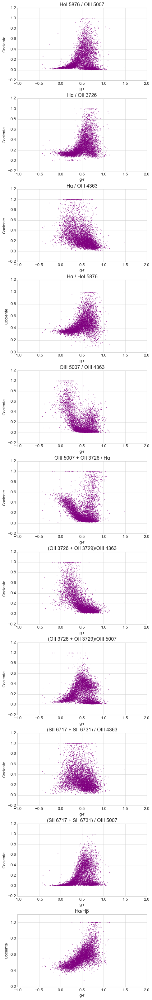

In [592]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = df_galaxies_SN2_normalized['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
axs[0].scatter(x_1, df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'], s=0.2, color='purple')
axs[0].set_title('HeI 5876 / OIII 5007')

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
axs[1].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OII 3726'], s=0.2, color='purple')
axs[1].set_title('Hα / OII 3726')

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
axs[2].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'], s=0.2, color='purple')
axs[2].set_title('Hα / OIII 4363')

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
axs[3].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'], s=0.2, color='purple')
axs[3].set_title('Hα / HeI 5876')

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
axs[4].scatter(x_1, df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'], s=0.2, color='purple')
axs[4].set_title('OIII 5007 / OIII 4363')

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

axs[5].scatter(x_1, (df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα']), s=0.2, color='purple')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
axs[6].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'] , s=0.2, color='purple')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
axs[7].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'] , s=0.2, color='purple')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

axs[8].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=0.2, color='purple')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007

#axs[9].scatter(x, df_galaxies['ratio_SII 6717/OIII 5007'] + df_galaxies['ratio_SII 6731/OIII 5007'], s=0.2)
axs[9].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=0.2, color='purple')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')

axs[10].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/Hβ'] , s=0.2, color='purple')
axs[10].set_title('Hα/Hβ')

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Cociente')

plt.style.use('seaborn-whitegrid')
plt.show()

In [593]:
#### Calculo de l 
### Volumen minimo homogeneo

max = np.zeros(len(ratio_columns))

for i in range(len(ratio_columns)):
    max[i]= np.max(ratios_data_norm[ratio_columns[i]])

  
vol = np.prod(max)

l = (vol/7067)**(1.0/len(max))

l

0.8987184832839902

In [594]:
#l = 17.58112330095015
l = 0.8987184832839902

#Aplicar DBSCAN en el espacio de características de cocientes
dbscan = DBSCAN(eps=0.5*l, min_samples=13)
clusters = dbscan.fit_predict(ratios_data_norm)


In [595]:
df_galaxies_SN2['Cluster_norm_1'] = clusters
df_galaxies_SN2_normalized['Cluster_norm_1'] = clusters


cluster_counts = df_galaxies_SN2['Cluster_norm_1'].value_counts()
print("Conteo de galaxias por cluster:\n", cluster_counts)


Conteo de galaxias por cluster:
 -1    3908
 0    3143
 1      16
Name: Cluster_norm_1, dtype: int64


min_samples: 2, clusters: 192
min_samples: 3, clusters: 62
min_samples: 4, clusters: 22
min_samples: 5, clusters: 14
min_samples: 6, clusters: 6
min_samples: 7, clusters: 4
min_samples: 8, clusters: 5
min_samples: 9, clusters: 6
min_samples: 10, clusters: 5
min_samples: 11, clusters: 3
min_samples: 12, clusters: 3
min_samples: 13, clusters: 2
min_samples: 14, clusters: 3
min_samples: 15, clusters: 2
min_samples: 16, clusters: 1
min_samples: 17, clusters: 2
min_samples: 18, clusters: 2
min_samples: 19, clusters: 1
min_samples: 20, clusters: 1
min_samples: 21, clusters: 1
min_samples: 22, clusters: 1
min_samples: 23, clusters: 1
min_samples: 24, clusters: 1
min_samples: 25, clusters: 1
min_samples: 26, clusters: 1
min_samples: 27, clusters: 1
min_samples: 28, clusters: 1
min_samples: 29, clusters: 1
min_samples: 30, clusters: 1


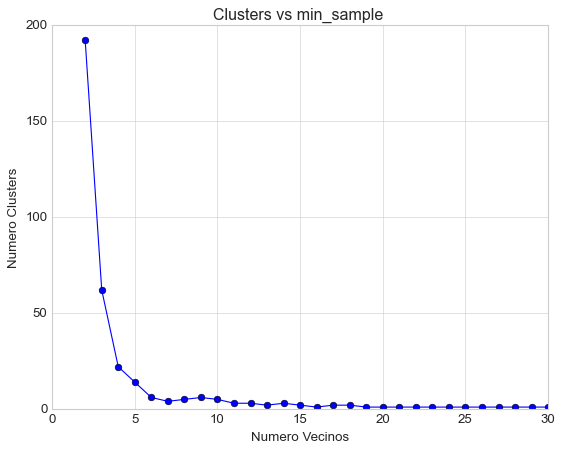

In [596]:
##### Analizando qué cantidad de vecinos maximiza el numero de clusters #####


#l = 17.58112330095015
l = 0.8987184832839902
eps_value = 0.5 * l

cluster_counts = []
min_samples_range = range(2, 31, 1)

for min_samples in min_samples_range:
    dbscan = DBSCAN(eps=eps_value, min_samples=min_samples)
    clusters = dbscan.fit_predict(ratios_data_norm)
    
    # Count clusters excluding noise (-1 label)
    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
    
    cluster_counts.append(n_clusters)
    print(f"min_samples: {min_samples}, clusters: {n_clusters}")

plt.plot(min_samples_range, cluster_counts, marker='o')
plt.xlabel('Numero Vecinos')
plt.ylabel('Numero Clusters')
plt.title('Clusters vs min_sample ')
plt.show()


Text(0.5, 0, '$M_r$')

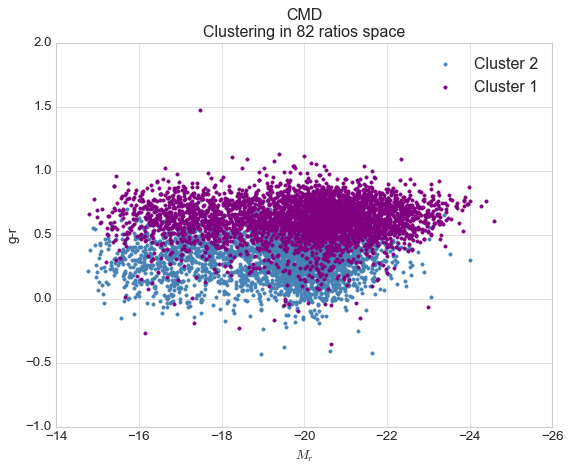

In [597]:

#graficos.color_Mag_by_label(df_galaxies_SN2, 'color_gr', label_column='Cluster_norm_1')
plt.plot(df_galaxies_SN2['M_r'][df_galaxies_SN2['Cluster_norm_1'] >= 0], df_galaxies_SN2['color_gr'][df_galaxies_SN2['Cluster_norm_1'] >=0], '.', label='Cluster 2', color='steelblue')
plt.plot(df_galaxies_SN2['M_r'][df_galaxies_SN2['Cluster_norm_1'] == -1], df_galaxies_SN2['color_gr'][df_galaxies_SN2['Cluster_norm_1'] ==-1], '.', label='Cluster 1', color='purple')
#plt.plot(df_galaxies_SN2['M_r'][df_galaxies_SN2['Cluster_norm_1'] == 5], df_galaxies_SN2['color_gr'][df_galaxies_SN2['Cluster_norm_1'] == 5], 'o', label='5')
plt.legend()
plt.ylim(-1, 2)
plt.xlim(-14,-26)
plt.title('CMD\nClustering in 82 ratios space')
plt.ylabel('g-r')
plt.xlabel('$M_r$')


/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/980302749.py:82: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


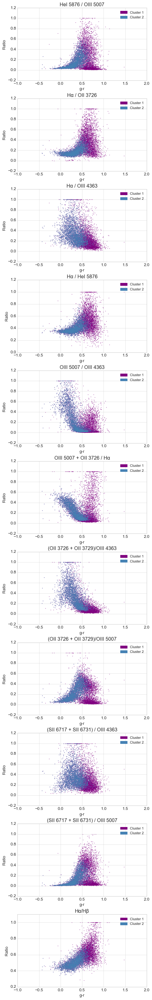

In [598]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = df_galaxies_SN2_normalized['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
axs[0].scatter(x_1, df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'], s=0.2, color='purple', label='Cluster 2')
axs[0].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[0].set_title('HeI 5876 / OIII 5007')

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
axs[1].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OII 3726'], s=0.2, color='purple', label='Cluster 2')
axs[1].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OII 3726'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[1].set_title('Hα / OII 3726')

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
axs[2].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'], s=0.2, color='purple', label='Cluster 2')
axs[2].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[2].set_title('Hα / OIII 4363')

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
axs[3].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'], s=0.2, color='purple', label='Cluster 2')
axs[3].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[3].set_title('Hα / HeI 5876')

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
axs[4].scatter(x_1, df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'], s=0.2, color='purple', label='Cluster 2')
axs[4].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[4].set_title('OIII 5007 / OIII 4363')

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

axs[5].scatter(x_1, (df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα']), s=0.2, color='purple', label='Cluster 2')
axs[5].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
axs[6].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'] , s=0.2, color='purple', label='Cluster 2')
axs[6].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
axs[7].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'] , s=0.2, color='purple', label='Cluster 2')
axs[7].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

axs[8].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=0.2, color='purple', label='Cluster 2')
axs[8].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
axs[9].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=0.2, color='purple', label='Cluster 2')
axs[9].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')

axs[10].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/Hβ'] , s=0.2, color='purple', label='Cluster 2')
axs[10].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/Hβ'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Cluster 1')
axs[10].set_title('Hα/Hβ')

legend_handles = [mpatches.Patch(color='purple', label='Cluster 1'),
                  mpatches.Patch(color='steelblue', label='Cluster 2')]

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Ratio')
    ax.legend(handles=legend_handles, loc='upper right', prop={'size': 10})

plt.style.use('seaborn-whitegrid')
plt.show()

Se encuentra que *eps= 0.5l* y *min_sample = 13* son dos valores donde se encuentran asociaciones relevantes. 


In [599]:
##### Analizando el eps respecto al min_sample elegido #####
"""
#l = 17.58112330095015
l = 0.8987184832839902

min_samples = 17

cluster_counts = []
eps_range = np.arange(0.1, 1.5, 0.05)
#eps_range = np.linspace(0.1, 5, 100)

for eps_value in eps_range:
    dbscan = DBSCAN(eps=eps_value*l, min_samples=min_samples)
    clusters = dbscan.fit_predict(ratios_data_norm)
    
    # Count clusters excluding noise (-1 label)
    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
    
    cluster_counts.append(n_clusters)
    print(f"fraccion de l: {eps_value}, clusters: {n_clusters}")

plt.plot(eps_range, cluster_counts, marker='o')
plt.xlabel('Fraccion de l')
plt.ylabel('Numero Clusters')
plt.title('Clusters vs l (min_samples = 13 y normalizados) ')
plt.show()"""

'\n#l = 17.58112330095015\nl = 0.8987184832839902\n\nmin_samples = 17\n\ncluster_counts = []\neps_range = np.arange(0.1, 1.5, 0.05)\n#eps_range = np.linspace(0.1, 5, 100)\n\nfor eps_value in eps_range:\n    dbscan = DBSCAN(eps=eps_value*l, min_samples=min_samples)\n    clusters = dbscan.fit_predict(ratios_data_norm)\n    \n    # Count clusters excluding noise (-1 label)\n    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)\n    \n    cluster_counts.append(n_clusters)\n    print(f"fraccion de l: {eps_value}, clusters: {n_clusters}")\n\nplt.plot(eps_range, cluster_counts, marker=\'o\')\nplt.xlabel(\'Fraccion de l\')\nplt.ylabel(\'Numero Clusters\')\nplt.title(\'Clusters vs l (min_samples = 13 y normalizados) \')\nplt.show()'

In [600]:
###Guardar lo que se ha hecho

df_galaxies_SN2_normalized.to_csv('galaxy_ratios_SN2_norm.csv', index=False)


### Partición de clusters 

Usando eps=0.5l y min_samples=13 reunir los dos clusters y empezar a buscar subclusters en cada uno.

In [601]:
secuencia_azul = df_galaxies_SN2_normalized.loc[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0]
secuencia_roja = df_galaxies_SN2_normalized.loc[df_galaxies_SN2_normalized['Cluster_norm_1'] == -1]

In [602]:
"""
plt.plot(secuencia_azul['color_gr'], secuencia_azul['ratio_(OIII 5007 + OII 3726)/Hα'], 'o', color='purple')
plt.title('OIII 5007 + OII 3726 / Hα')

plt.show()

plt.plot(secuencia_roja['color_gr'], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'],'o', color='blue')
plt.title('OIII 5007 + OII 3726 / Hα')

plt.show()"""


"\nplt.plot(secuencia_azul['color_gr'], secuencia_azul['ratio_(OIII 5007 + OII 3726)/Hα'], 'o', color='purple')\nplt.title('OIII 5007 + OII 3726 / Hα')\n\nplt.show()\n\nplt.plot(secuencia_roja['color_gr'], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'],'o', color='blue')\nplt.title('OIII 5007 + OII 3726 / Hα')\n\nplt.show()"

In [603]:
ratios_azul = ratios_data_norm.loc[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0]
ratios_azul

ratios_roja = ratios_data_norm.loc[df_galaxies_SN2_normalized['Cluster_norm_1'] == -1]
ratios_roja

,ratio_OII 3729/OII 3726,ratio_OIII 4363/OII 3726,ratio_OIII 4363/OII 3729,ratio_Hβ/OII 3726,ratio_Hβ/OII 3729,ratio_Hβ/OIII 4363,ratio_OIII 4959/OII 3726,ratio_OIII 4959/OII 3729,ratio_OIII 4959/OIII 4363,ratio_OIII 4959/Hβ,ratio_OIII 5007/OII 3726,ratio_OIII 5007/OII 3729,ratio_OIII 5007/OIII 4363,ratio_OIII 5007/Hβ,ratio_OIII 5007/OIII 4959,ratio_HeI 5876/OII 3726,ratio_HeI 5876/OII 3729,ratio_HeI 5876/OIII 4363,ratio_HeI 5876/Hβ,ratio_HeI 5876/OIII 4959,ratio_HeI 5876/OIII 5007,ratio_OI 6300/OII 3726,ratio_OI 6300/OII 3729,ratio_OI 6300/OIII 4363,ratio_OI 6300/Hβ,ratio_OI 6300/OIII 4959,ratio_OI 6300/OIII 5007,ratio_OI 6300/HeI 5876,ratio_NII 6548/OII 3726,ratio_NII 6548/OII 3729,ratio_NII 6548/OIII 4363,ratio_NII 6548/Hβ,ratio_NII 6548/OIII 4959,ratio_NII 6548/OIII 5007,ratio_NII 6548/HeI 5876,ratio_NII 6548/OI 6300,ratio_Hα/OII 3726,ratio_Hα/OII 3729,ratio_Hα/OIII 4363,ratio_Hα/Hβ,ratio_Hα/OIII 4959,ratio_Hα/OIII 5007,ratio_Hα/HeI 5876,ratio_Hα/OI 6300,ratio_Hα/NII 6548,ratio_NII 6584/OII 3726,ratio_NII 6584/OII 3729,ratio_NII 6584/OIII 4363,ratio_NII 6584/Hβ,ratio_NII 6584/OIII 4959,ratio_NII 6584/OIII 5007,ratio_NII 6584/HeI 5876,ratio_NII 6584/OI 6300,ratio_NII 6584/NII 6548,ratio_NII 6584/Hα,ratio_SII 6717/OII 3726,ratio_SII 6717/OII 3729,ratio_SII 6717/OIII 4363,ratio_SII 6717/Hβ,ratio_SII 6717/OIII 4959,ratio_SII 6717/OIII 5007,ratio_SII 6717/HeI 5876,ratio_SII 6717/OI 6300,ratio_SII 6717/NII 6548,ratio_SII 6717/Hα,ratio_SII 6717/NII 6584,ratio_SII 6731/OII 3726,ratio_SII 6731/OII 3729,ratio_SII 6731/OIII 4363,ratio_SII 6731/Hβ,ratio_SII 6731/OIII 4959,ratio_SII 6731/OIII 5007,ratio_SII 6731/HeI 5876,ratio_SII 6731/OI 6300,ratio_SII 6731/NII 6548,ratio_SII 6731/Hα,ratio_SII 6731/NII 6584,ratio_SII 6731/SII 6717,ratio_(OII 3726 + OII 3729)/OIII 4363,ratio_(OII 3726 + OII 3729)/OIII 5007,ratio_(OIII 5007 + OII 3726)/Hα,ratio_(SII 6717 + SII 6731)/OIII 4363,ratio_(SII 6717 + SII 6731)/OIII 5007
2,0.149755,0.048780,0.148684,0.212955,0.653764,0.514107,0.052832,0.159607,0.110862,0.060257,0.052682,0.158552,0.111557,0.060340,0.725982,0.216753,0.663847,0.480665,0.520823,0.288166,0.257336,0.125624,0.355767,0.529012,0.204672,0.262434,0.233368,0.210074,0.130147,0.388312,0.685358,0.257327,0.246428,0.215710,0.251829,0.406555,0.189435,0.590428,0.605191,0.620209,0.261678,0.233390,0.494720,0.386864,0.174316,0.130147,0.388312,0.685358,0.257327,0.246428,0.215710,0.251829,0.406555,0.999999,0.279023,0.162253,0.491193,0.565590,0.347559,0.224066,0.196678,0.315566,0.394076,0.157536,0.367676,0.157536,0.168473,0.497092,0.608181,0.342759,0.245481,0.217757,0.314701,0.448575,0.182277,0.384216,0.182277,0.741721,0.315075,0.313559,0.121519,0.584820,0.204891
4,0.643424,0.238408,0.169134,0.280180,0.200195,0.138395,0.649890,0.456961,0.279025,0.563380,0.699494,0.489978,0.303065,0.608950,0.783618,0.292105,0.208221,0.132536,0.533474,0.031570,0.026119,0.906750,0.597672,0.781264,1.000000,0.153989,0.126862,1.000000,0.511622,0.355287,0.551252,0.768867,0.078752,0.063865,0.734595,0.221422,0.307896,0.223354,0.201259,0.766184,0.034575,0.028570,0.596666,0.087114,0.072072,0.511622,0.355287,0.551253,0.768867,0.078752,0.063865,0.734595,0.221422,1.000000,0.674856,0.468998,0.330456,0.334502,0.763586,0.052651,0.042817,0.676856,0.157813,0.115836,0.653883,0.115836,0.520240,0.357267,0.384258,0.804476,0.061624,0.050643,0.721104,0.191908,0.143182,0.729968,0.143182,0.792382,0.117397,0.043005,0.350835,0.356421,0.045965
5,0.537115,0.021023,0.017866,0.241099,0.206368,1.000000,0.297875,0.250903,1.000000,0.300080,0.292676,0.245590,1.000000,0.296092,0.715340,0.263697,0.225175,1.000000,0.559656,0.062179,0.056352,0.086902,0.068618,0.849115,0.125057,0.032199,0.029058,0.119451,0.033631,0.027977,0.410934,0.058734,0.011294,0.010034,0.053491,0.151870,0.165723,0.144013,1.000000,0.479240,0.040602,0.036752,0.355749,0.489241,0.590132,0.033631,0.027977,0.410934,0.058734,0.011294,0.010034,0.053491,0.151871,0.999999,0.082419,0.117607,0.099267,0.951229,0.222516,0.028806,0.025661,0.188015,0.412

In [604]:
#### Calculo de l para cada grupo
### Volumen minimo homogeneo

max = np.zeros(len(ratio_columns))

for i in range(len(ratio_columns)):
    max[i]= np.max(ratios_data_norm[ratio_columns[i]])

  
vol = np.prod(max)

l = (vol/7067)**(1.0/len(max))

### Para cada grupo
l_azul = (1.0/len(secuencia_azul))**(1.0/82)
l_roja = (1.0/len(secuencia_roja))**(1.0/82)

print('l secuencia azul:', l_azul, '\nl secuencia roja:', l_roja)

l secuencia azul: 0.9064055697257534 
l secuencia roja: 0.9040567146733534


In [605]:
residual_galaxies = df_galaxies_SN2_normalized.loc[residual_AGN]

### Secuencia Azul

min_samples: 2, clusters: 39
min_samples: 3, clusters: 11
min_samples: 4, clusters: 5
min_samples: 5, clusters: 6
min_samples: 6, clusters: 6
min_samples: 7, clusters: 5
min_samples: 8, clusters: 4
min_samples: 9, clusters: 1
min_samples: 10, clusters: 1
min_samples: 11, clusters: 1
min_samples: 12, clusters: 1
min_samples: 13, clusters: 2
min_samples: 14, clusters: 4
min_samples: 15, clusters: 3
min_samples: 16, clusters: 2
min_samples: 17, clusters: 2
min_samples: 18, clusters: 1
min_samples: 19, clusters: 1
min_samples: 20, clusters: 1
min_samples: 21, clusters: 1
min_samples: 22, clusters: 1
min_samples: 23, clusters: 1
min_samples: 24, clusters: 1
min_samples: 25, clusters: 1
min_samples: 26, clusters: 1
min_samples: 27, clusters: 1
min_samples: 28, clusters: 1
min_samples: 29, clusters: 1
min_samples: 30, clusters: 1


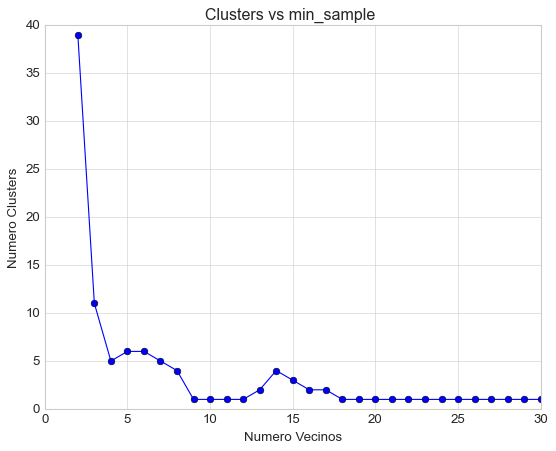

In [606]:
##### Analizando qué cantidad de vecinos maximiza el numero de clusters #####

eps_value = 0.4 * l_azul

cluster_counts = []
min_samples_range = range(2, 31, 1)

for min_samples in min_samples_range:
    dbscan = DBSCAN(eps=eps_value, min_samples=min_samples)
    clusters = dbscan.fit_predict(ratios_azul)
    
    # Count clusters excluding noise (-1 label)
    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
    
    cluster_counts.append(n_clusters)
    print(f"min_samples: {min_samples}, clusters: {n_clusters}")

plt.plot(min_samples_range, cluster_counts, marker='o')
plt.xlabel('Numero Vecinos')
plt.ylabel('Numero Clusters')
plt.title('Clusters vs min_sample ')
plt.show()

In [607]:
#Aplicar DBSCAN en el espacio de características de cocientes
dbscan = DBSCAN(eps=0.43*l_azul, min_samples=10)
clusters = dbscan.fit_predict(ratios_azul)

In [608]:
secuencia_azul['Cluster_1'] = clusters

cluster_counts = secuencia_azul['Cluster_1'].value_counts()
print("Conteo de galaxias por cluster:\n", cluster_counts)


Conteo de galaxias por cluster:
  0    2644
-1     505
 1      10
Name: Cluster_1, dtype: int64


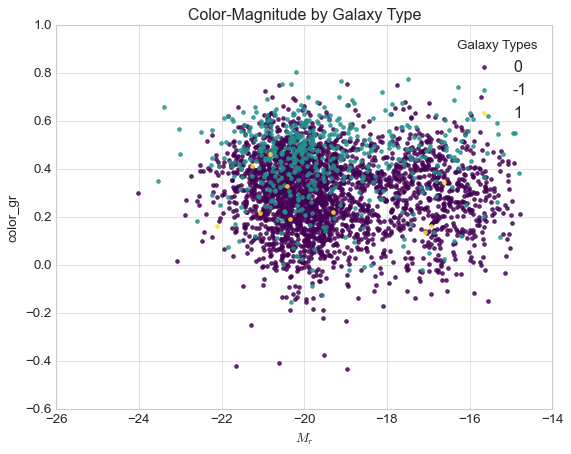

Text(0.5, 0, '$M_r$')

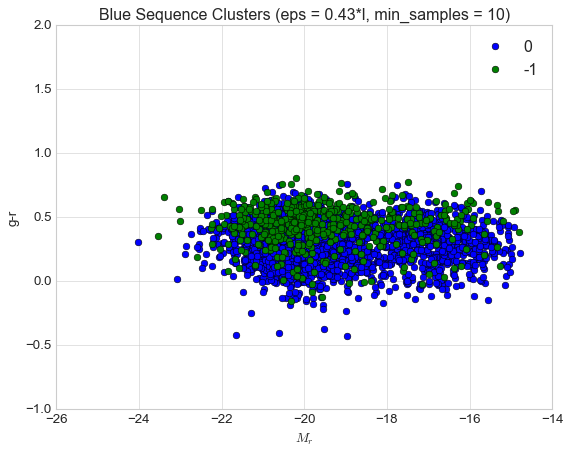

In [609]:
graficos.color_Mag_by_label(secuencia_azul, 'color_gr', label_column='Cluster_1')
plt.plot(secuencia_azul['M_r'][secuencia_azul['Cluster_1'] == 0], secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == 0], 'o', label='0')
plt.plot(secuencia_azul['M_r'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], 'o', label='-1')

plt.legend()
plt.ylim(-1, 2)
plt.title('Blue Sequence Clusters (eps = 0.43*l, min_samples = 10)')
plt.ylabel('g-r')
plt.xlabel('$M_r$')

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/3162098754.py:104: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


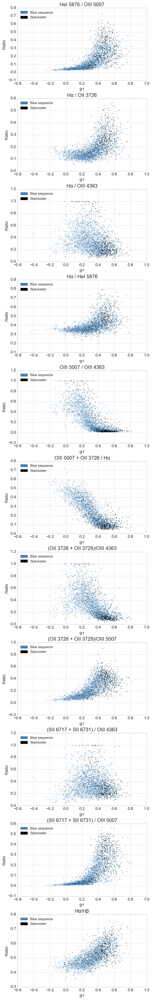

In [610]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = df_galaxies_SN2_normalized['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
#axs[0].scatter(x_1, df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'], s=0.2, color='purple', label='All galaxies')
axs[0].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[0].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_HeI 5876/OIII 5007'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[0].set_title('HeI 5876 / OIII 5007')
axs[0].legend()

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
#axs[1].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OII 3726'], s=0.2, color='purple', label='All galaxies')
axs[1].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OII 3726'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[1].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/OII 3726'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[1].set_title('Hα / OII 3726')
axs[1].legend()

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
#axs[2].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'], s=0.2, color='purple', label='All galaxies')
axs[2].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[2].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[2].set_title('Hα / OIII 4363')
axs[2].legend()

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
#axs[3].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'], s=0.2, color='purple', label='All galaxies')
axs[3].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[3].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/HeI 5876'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[3].set_title('Hα / HeI 5876')
axs[3].legend()

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
#axs[4].scatter(x_1, df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'], s=0.2, color='purple', label='All galaxies')
axs[4].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[4].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_OIII 5007/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[4].set_title('OIII 5007 / OIII 4363')
axs[4].legend()
# Gráfico 6: (OIII 5007 + OII 3726) / Hα

#axs[5].scatter(x_1, (df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα']), s=0.2, color='purple', label='All galaxies')
axs[5].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[5].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')
axs[5].legend()

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
#axs[6].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'] , s=0.2, color='purple', label='All galaxies')
axs[6].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[6].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')
axs[6].legend()

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
#axs[7].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'] , s=0.2, color='purple', label='All galaxies')
axs[7].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[7].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')
axs[7].legend()

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

#axs[8].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=0.2, color='purple', label='All galaxies')
axs[8].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[8].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')
axs[8].legend()

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
#axs[9].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=0.2, color='purple', label='All galaxies')
axs[9].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[9].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')
axs[9].legend()

#axs[10].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/Hβ'] , s=0.2, color='purple', label='All galaxies')
axs[10].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/Hβ'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[10].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/Hβ'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[10].set_title('Hα/Hβ')
axs[10].legend()

legend_handles = [#mpatches.Patch(color='purple', label='All galaxies'),
                  mpatches.Patch(color='steelblue', label='Blue sequence'),
                  mpatches.Patch(color='black', label='Subcluster')]

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Ratio')
    ax.legend(handles=legend_handles, loc='upper left', prop={'size': 10})

plt.style.use('seaborn-whitegrid')
plt.show()

In [611]:
secuencia_filtrada = secuencia_azul[secuencia_azul['Cluster_1'] == -1]

residual_secuencia_filtrada = residual_galaxies.merge(secuencia_filtrada, on='specObjId', how='inner')

## IDs de las que son residuales y además estan en el subgrupo de la secuencia azul
filtered_specObjId = residual_secuencia_filtrada['specObjId']

filtered_specObjId

0    1772280860897208320
1    2493870831193581568
2    3098582447676221440
3     666655374371219456
4     552869938277148672
5    1172092085294098432
6    1317340870395062272
7    1649493992766728192
Name: specObjId, dtype: int64

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/2739005813.py:117: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


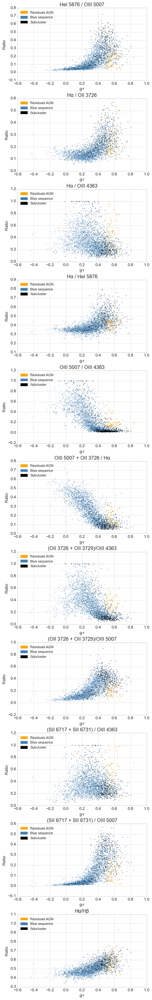

In [612]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = df_galaxies_SN2_normalized['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
#axs[0].scatter(x_1, df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'], s=0.2, color='purple')
axs[0].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[0].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_HeI 5876/OIII 5007'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[0].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_HeI 5876/OIII 5007_x'], s=1, color='orange', label='Residuals')
axs[0].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_HeI 5876/OIII 5007'], s=1, color='orange', label='Residuals')
axs[0].set_title('HeI 5876 / OIII 5007')

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
#axs[1].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OII 3726'], s=0.2, color='purple')
axs[1].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OII 3726'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[1].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/OII 3726'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[1].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_Hα/OII 3726_x'], s=1, color='orange', label='Residuals')
axs[1].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/OII 3726'], s=1, color='orange', label='Residuals')
axs[1].set_title('Hα / OII 3726')

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
#axs[2].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'], s=0.2, color='purple')
axs[2].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[2].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[2].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_Hα/OIII 4363_x'], s=1, color='orange', label='Residuals')
axs[2].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/OIII 4363'], s=1, color='orange', label='Residuals')
axs[2].set_title('Hα / OIII 4363')

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
#axs[3].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'], s=0.2, color='purple')
axs[3].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[3].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/HeI 5876'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[3].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_Hα/HeI 5876_x'], s=1, color='orange', label='Residuals')
axs[3].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/HeI 5876'], s=1, color='orange', label='Residuals')
axs[3].set_title('Hα / HeI 5876')

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
#axs[4].scatter(x_1, df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'], s=0.2, color='purple')
axs[4].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[4].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_OIII 5007/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
axs[4].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_OIII 5007/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[4].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_OIII 5007/OIII 4363_x'], s=1, color='orange', label='Residuals')
axs[4].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_OIII 5007/OIII 4363'], s=1, color='orange', label='Residuals')
axs[4].set_title('OIII 5007 / OIII 4363')

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

#axs[5].scatter(x_1, (df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα']), s=0.2, color='purple')
axs[5].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[5].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[5].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_(OIII 5007 + OII 3726)/Hα_x'], s=1, color='orange', label='Residuals')
axs[5].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OIII 5007 + OII 3726)/Hα'], s=1, color='orange', label='Residuals')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
#axs[6].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'] , s=0.2, color='purple')
axs[6].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[6].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[6].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_(OII 3726 + OII 3729)/OIII 4363_x'], s=1, color='orange', label='Residuals')
axs[6].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OII 3726 + OII 3729)/OIII 4363'], s=1, color='orange', label='Residuals')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
#axs[7].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'] , s=0.2, color='purple')
axs[7].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[7].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[7].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_(OII 3726 + OII 3729)/OIII 5007_x'], s=1, color='orange', label='Residuals')
axs[7].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OII 3726 + OII 3729)/OIII 5007'], s=1, color='orange', label='Residuals')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

#axs[8].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=0.2, color='purple')
axs[8].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[8].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[8].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_(SII 6717 + SII 6731)/OIII 4363_x'], s=1, color='orange', label='Residuals')
axs[8].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=1, color='orange', label='Residuals')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
#axs[9].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=0.2, color='purple')
axs[9].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[9].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[9].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_(SII 6717 + SII 6731)/OIII 5007_x'], s=1, color='orange', label='Residuals')
axs[9].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=1, color='orange', label='Residuals')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')

#axs[10].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/Hβ'] , s=0.2, color='purple')
axs[10].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/Hβ'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='steelblue', label='Blue Sequence')
axs[10].scatter(secuencia_azul['color_gr'][secuencia_azul['Cluster_1'] == -1], secuencia_azul['ratio_Hα/Hβ'][secuencia_azul['Cluster_1'] == -1], s=0.2, color='black', label='Subcluster')
#axs[10].scatter(residual_secuencia_filtrada[#'color_gr_x'], residual_secuencia_filtrada['ratio_Hα/Hβ_x'], s=1, color='orange', label='Residuals')
axs[10].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/Hβ'], s=1, color='orange', label='Residuals')
axs[10].set_title('Hα/Hβ')

legend_handles = [mpatches.Patch(color='orange', label='Residuals AGN'),
                  mpatches.Patch(color='steelblue', label='Blue sequence'),
                  mpatches.Patch(color='black', label='Subcluster')]

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Ratio')
    ax.legend(handles=legend_handles, loc='upper left', prop={'size': 10})

plt.style.use('seaborn-whitegrid')
plt.show()

In [613]:

secuencia_azul.to_csv('subclusters_secuencia_azul.csv', index=False)


### Secuencia Roja

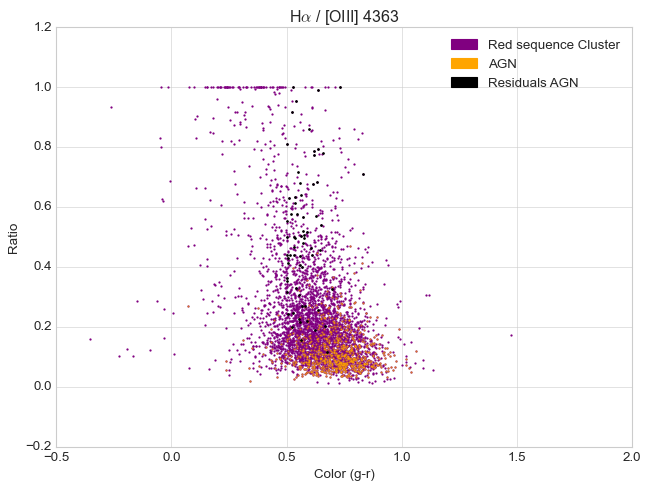

In [614]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(secuencia_roja['color_gr'], 
           secuencia_roja['ratio_Hα/OIII 4363'], 
           s=1, color='purple', label='Red sequence')

ax.scatter(secuencia_roja.loc[secuencia_roja['AGN_combinado'], 'color_gr'], 
           secuencia_roja.loc[secuencia_roja['AGN_combinado'], 'ratio_Hα/OIII 4363'], 
           s=1, alpha=0.5, color='orange', label='AGN')

ax.scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/OIII 4363'], s=2, color='black', label='Residual AGN')

ax.set_title(r'H$\alpha$ / [OIII] 4363')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')

legend_handles = [mpatches.Patch(color='purple', label='Red sequence Cluster'),
                  mpatches.Patch(color='orange', label='AGN'),
                  mpatches.Patch(color='black', label='Residuals AGN')]

ax.legend(handles=legend_handles, loc='upper right', prop={'size': 12})
plt.show()

In [615]:
len(secuencia_roja.loc[secuencia_roja['AGN_combinado']])/len(secuencia_roja)

0.1937052200614125

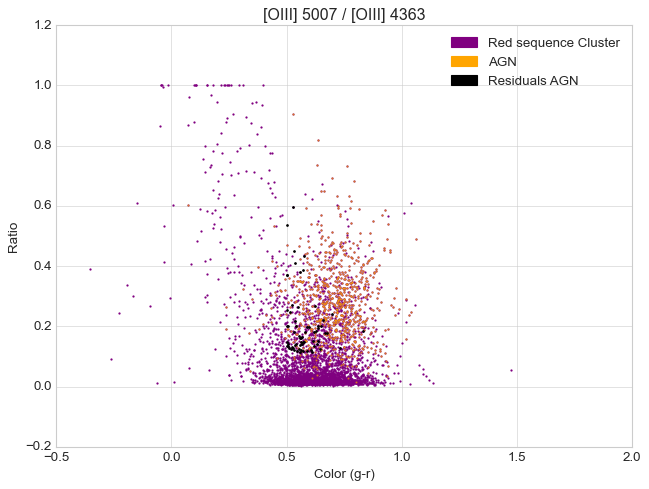

In [616]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(secuencia_roja['color_gr'], 
           secuencia_roja['ratio_OIII 5007/OIII 4363'], 
           s=1, color='purple', label='Red sequence')

ax.scatter(secuencia_roja.loc[secuencia_roja['AGN_combinado'], 'color_gr'], 
           secuencia_roja.loc[secuencia_roja['AGN_combinado'], 'ratio_OIII 5007/OIII 4363'], 
           s=1, alpha=0.5, color='orange', label='AGN')

ax.scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_OIII 5007/OIII 4363'], s=2, color='black', label='Residual AGN')

ax.set_title('[OIII] 5007 / [OIII] 4363')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')

legend_handles = [mpatches.Patch(color='purple', label='Red sequence Cluster'),
                  mpatches.Patch(color='orange', label='AGN'),
                  mpatches.Patch(color='black', label='Residuals AGN')]

ax.legend(handles=legend_handles, loc='upper right', prop={'size': 12})
plt.show()

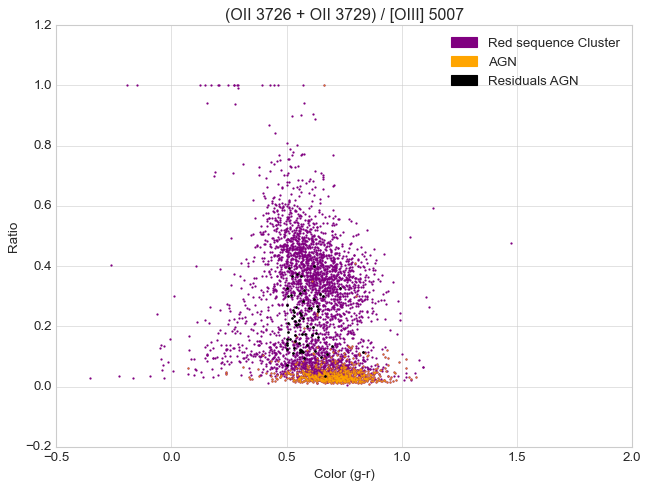

In [617]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(secuencia_roja['color_gr'], 
           secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'], 
           s=1, color='purple', label='Red sequence')

ax.scatter(secuencia_roja.loc[secuencia_roja['AGN_combinado'], 'color_gr'], 
           secuencia_roja.loc[secuencia_roja['AGN_combinado'], 'ratio_(OII 3726 + OII 3729)/OIII 5007'], 
           s=1, alpha=0.5, color='orange', label='AGN')

ax.scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OII 3726 + OII 3729)/OIII 5007'], s=2, color='black', label='Residual AGN')

ax.set_title('(OII 3726 + OII 3729) / [OIII] 5007')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')

legend_handles = [mpatches.Patch(color='purple', label='Red sequence Cluster'),
                  mpatches.Patch(color='orange', label='AGN'),
                  mpatches.Patch(color='black', label='Residuals AGN')]

ax.legend(handles=legend_handles, loc='upper right', prop={'size': 12})
plt.show()


min_samples: 2, clusters: 251
min_samples: 3, clusters: 100
min_samples: 4, clusters: 44
min_samples: 5, clusters: 24
min_samples: 6, clusters: 11
min_samples: 7, clusters: 8
min_samples: 8, clusters: 6
min_samples: 9, clusters: 2
min_samples: 10, clusters: 2
min_samples: 11, clusters: 1
min_samples: 12, clusters: 1
min_samples: 13, clusters: 0
min_samples: 14, clusters: 0
min_samples: 15, clusters: 0
min_samples: 16, clusters: 0
min_samples: 17, clusters: 0
min_samples: 18, clusters: 0
min_samples: 19, clusters: 0
min_samples: 20, clusters: 0
min_samples: 21, clusters: 0
min_samples: 22, clusters: 0
min_samples: 23, clusters: 0
min_samples: 24, clusters: 0
min_samples: 25, clusters: 0
min_samples: 26, clusters: 0
min_samples: 27, clusters: 0
min_samples: 28, clusters: 0
min_samples: 29, clusters: 0
min_samples: 30, clusters: 0


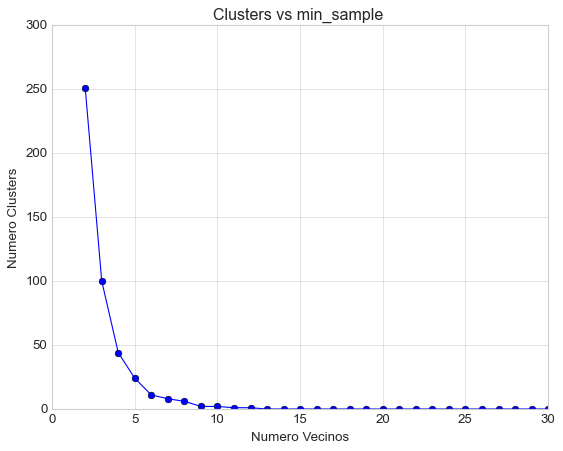

In [618]:
##### Analizando qué cantidad de vecinos maximiza el numero de clusters #####

eps_value = 0.5 * l_roja

cluster_counts = []
min_samples_range = range(2, 31, 1)

for min_samples in min_samples_range:
    dbscan = DBSCAN(eps=eps_value, min_samples=min_samples)
    clusters = dbscan.fit_predict(ratios_roja)
    
    # Count clusters excluding noise (-1 label)
    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
    
    cluster_counts.append(n_clusters)
    print(f"min_samples: {min_samples}, clusters: {n_clusters}")

plt.plot(min_samples_range, cluster_counts, marker='o')
plt.xlabel('Numero Vecinos')
plt.ylabel('Numero Clusters')
plt.title('Clusters vs min_sample ')
plt.show()

In [619]:
#Aplicar DBSCAN en el espacio de características de cocientes
dbscan = DBSCAN(eps=0.6*l_roja, min_samples=10)
clusters = dbscan.fit_predict(ratios_roja)
secuencia_roja['Cluster_1'] = clusters

cluster_counts = secuencia_roja['Cluster_1'].value_counts()
print("Conteo de galaxias por cluster:\n", cluster_counts)


Conteo de galaxias por cluster:
 -1     3222
 0      274
 2      236
 3       36
 4       30
 7       27
 1       18
 5       18
 6       12
 8       11
 11      10
 10       7
 9        7
Name: Cluster_1, dtype: int64


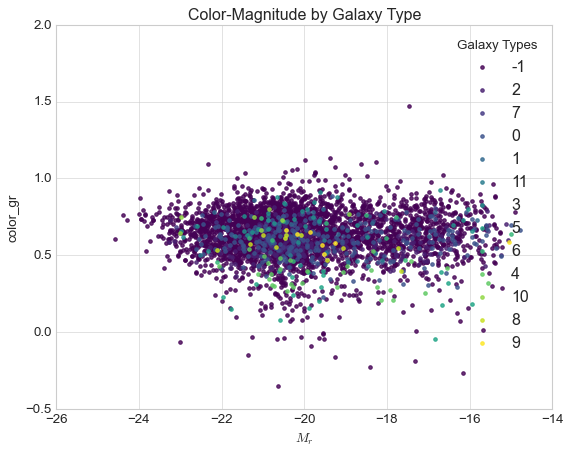

Text(0.5, 0, '$M_r$')

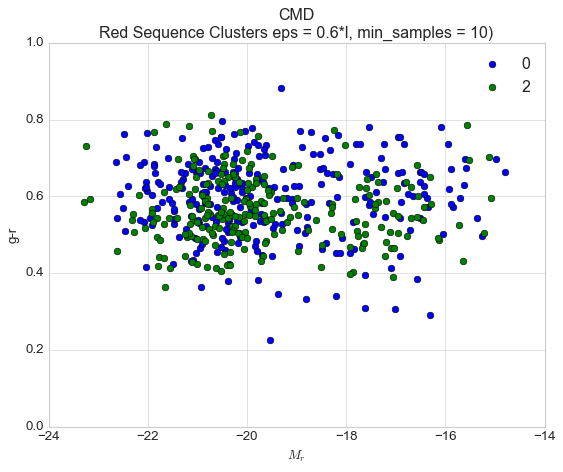

In [620]:
graficos.color_Mag_by_label(secuencia_roja, 'color_gr', label_column='Cluster_1')
#plt.plot(secuencia_roja['M_r'][secuencia_roja['Cluster_norm_1'] == 0], secuencia_roja['color_gr'][secuencia_roja['Cluster_norm_1'] == 0], 'o', label='0')
plt.plot(secuencia_roja['M_r'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], 'o', label='0')
plt.plot(secuencia_roja['M_r'][secuencia_roja['Cluster_1'] == 2], secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 2], 'o', label='2')


plt.legend()
plt.ylim(0, 1)
plt.title('CMD\nRed Sequence Clusters eps = 0.6*l, min_samples = 10)')
plt.ylabel('g-r')
plt.xlabel('$M_r$')

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/2831852333.py:113: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


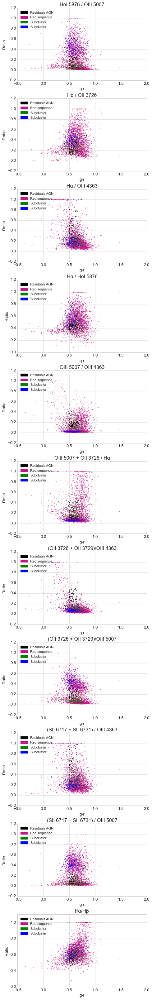

In [621]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = df_galaxies_SN2_normalized['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

axs[0].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_HeI 5876/OIII 5007'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[0].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_HeI 5876/OIII 5007'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster 1')
axs[0].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_HeI 5876/OIII 5007'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster 2')
#axs[0].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_HeI 5876/OIII 5007'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[0].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_HeI 5876/OIII 5007'], s=1, color='black', label='Residuals AGN')
axs[0].set_title('HeI 5876 / OIII 5007')

# Gráfico 2: Hα / OII 3726

axs[1].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_Hα/OII 3726'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[1].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_Hα/OII 3726'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[1].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/OII 3726'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[1].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/OII 3726'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[1].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/OII 3726'], s=1, color='black', label='Residuals AGN')
axs[1].set_title('Hα / OII 3726')

# Gráfico 3: Hα / OIII 4363

axs[2].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_Hα/OIII 4363'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[2].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_Hα/OIII 4363'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[2].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[2].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[2].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/OIII 4363'], s=1, color='black', label='Residuals AGN')
axs[2].set_title('Hα / OIII 4363')

# Gráfico 4: Hα / HeI 5876

axs[3].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_Hα/HeI 5876'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[3].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_Hα/HeI 5876'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[3].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/HeI 5876'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[3].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/HeI 5876'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[3].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/HeI 5876'], s=1, color='black', label='Residuals AGN')
axs[3].set_title('Hα / HeI 5876')

# Gráfico 5: OIII 5007 / OIII 4363

axs[4].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_OIII 5007/OIII 4363'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[4].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[4].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[4].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[4].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_OIII 5007/OIII 4363'], s=1, color='black', label='Residual AGN')
axs[4].set_title('OIII 5007 / OIII 4363')

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

axs[5].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[5].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[5].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[5].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[5].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OIII 5007 + OII 3726)/Hα'], s=1, color='black', label='Residual AGN')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
axs[6].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 4363'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[6].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[6].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[6].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[6].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OII 3726 + OII 3729)/OIII 4363'], s=1, color='black', label='Residual AGN')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
axs[7].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[7].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[7].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[7].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[7].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OII 3726 + OII 3729)/OIII 5007'], s=1, color='black', label='Residual AGN')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

axs[8].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[8].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[8].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[8].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[8].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=1, color='black', label='Residual AGN')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
axs[9].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[9].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[9].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[9].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[9].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=1, color='black', label='Residual AGN')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')


axs[10].scatter(secuencia_roja['color_gr'], secuencia_roja['ratio_Hα/Hβ'], s=0.2, color='mediumvioletred', label='Red Sequence')
axs[10].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], secuencia_roja['ratio_Hα/Hβ'][secuencia_roja['Cluster_1'] ==0], s=0.2, color='green', label='Subcluster')
axs[10].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/Hβ'][secuencia_roja['Cluster_1'] ==2], s=0.2, color='blue', label='Subcluster')
#axs[10].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/Hβ'][secuencia_roja['AGN_combinado'] == True], s=0.5, color='black', label='AGN')
axs[10].scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_Hα/Hβ'], s=1, color='black', label='Residual AGN')
axs[10].set_title('Hα/Hβ')

legend_handles = [mpatches.Patch(color='black', label='Residuals AGN'),
                  mpatches.Patch(color='mediumvioletred', label='Red sequence'),
                  mpatches.Patch(color='green', label='Subcluster'),
                  mpatches.Patch(color='blue', label='Subcluster')]

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Ratio')
    ax.legend(handles=legend_handles, loc='upper left', prop={'size': 10})

plt.style.use('seaborn-whitegrid')
plt.show()

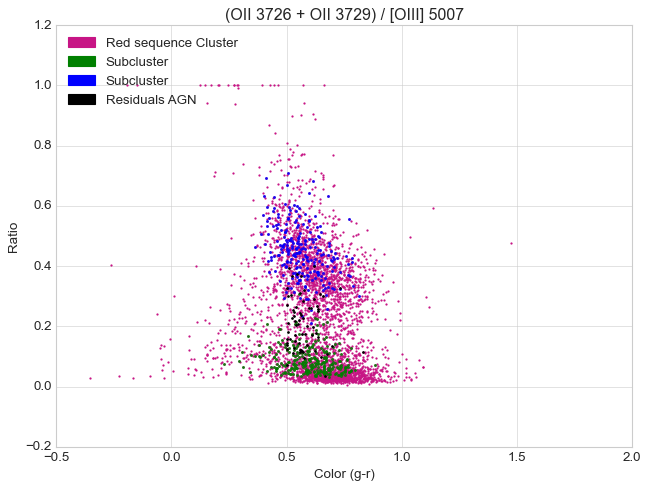

In [622]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(secuencia_roja['color_gr'], 
           secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'], 
           s=1, color='mediumvioletred', label='Red sequence')

ax.scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], 
           secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['Cluster_1'] ==0], 
           s=3, alpha=0.7, color='green', label='Subcluster')
ax.scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], 
           secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['Cluster_1'] ==2], 
           s=3, alpha=0.7, color='blue', label='Subcluster')

ax.scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(OII 3726 + OII 3729)/OIII 5007'], s=2, color='black', label='Residual AGN')

ax.set_title('(OII 3726 + OII 3729) / [OIII] 5007')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')

legend_handles = [mpatches.Patch(color='mediumvioletred', label='Red sequence Cluster'),
                  mpatches.Patch(color='green', label='Subcluster'),
                  mpatches.Patch(color='blue', label='Subcluster'),
                  mpatches.Patch(color='black', label='Residuals AGN')]

ax.legend(handles=legend_handles, loc='upper left', prop={'size': 12})
plt.show()


Text(0, 0.5, 'Ratio')

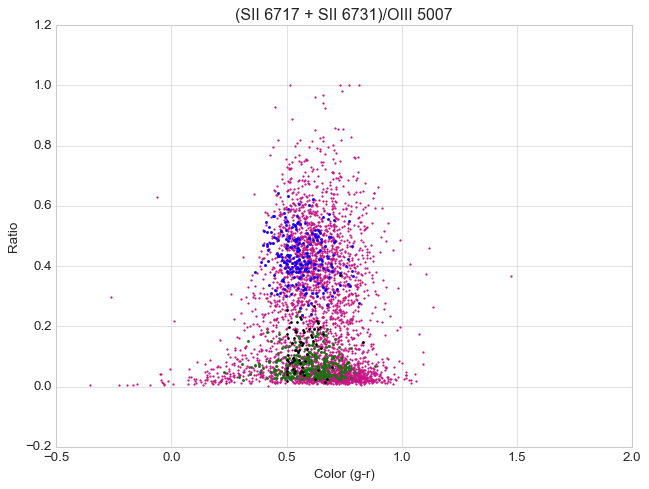

In [623]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(secuencia_roja['color_gr'], 
           secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'], 
           s=1, color='mediumvioletred', label='Red sequence')

ax.scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], 
           secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['Cluster_1'] ==0], 
           s=3, alpha=0.7, color='green', label='Subcluster')
ax.scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], 
           secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['Cluster_1'] ==2], 
           s=3, alpha=0.7, color='blue', label='Subcluster')

ax.scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=2, color='black', label='Residual AGN')

ax.set_title('(SII 6717 + SII 6731)/OIII 5007')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')


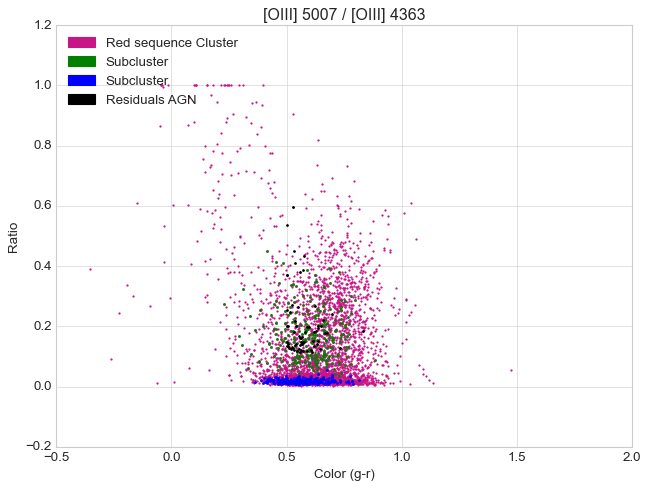

In [624]:
fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

ax.scatter(secuencia_roja['color_gr'], 
           secuencia_roja['ratio_OIII 5007/OIII 4363'], 
           s=1, color='mediumvioletred', label='Red sequence')

ax.scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==0], 
           secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['Cluster_1'] ==0], 
           s=3, alpha=0.7, color='green', label='Subcluster')
ax.scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], 
           secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['Cluster_1'] ==2], 
           s=3, alpha=0.7, color='blue', label='Subcluster')

ax.scatter(residual_galaxies['color_gr'], residual_galaxies['ratio_OIII 5007/OIII 4363'], s=2, color='black', label='Residual AGN')

ax.set_title('[OIII] 5007 / [OIII] 4363')
ax.set_xlabel('Color (g-r)')
ax.set_ylabel('Ratio')

legend_handles = [mpatches.Patch(color='mediumvioletred', label='Red sequence Cluster'),
                  mpatches.Patch(color='green', label='Subcluster'),
                  mpatches.Patch(color='blue', label='Subcluster'),
                  mpatches.Patch(color='black', label='Residuals AGN')]

ax.legend(handles=legend_handles, loc='upper left', prop={'size': 12})
plt.show()

Hipótesis: Las residuales de la clasificación de AGN que tienen características en los cocientes similares a las clasificadas clasicamente como AGN, están relacionadas con uno de los subclusters hallados por DBSCAN dentro de la secuencia roja.

In [434]:
secuencia_filtrada = secuencia_roja[secuencia_roja['Cluster_1'] == 0]

residual_secuencia_filtrada = residual_galaxies.merge(secuencia_filtrada, on='specObjId', how='inner')

## IDs de las que son residuales y además estan en el subgrupo de la secuencia roja
filtered_specObjId = residual_secuencia_filtrada['specObjId']

filtered_specObjId


Series([], Name: specObjId, dtype: int64)

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/1871485619.py:133: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


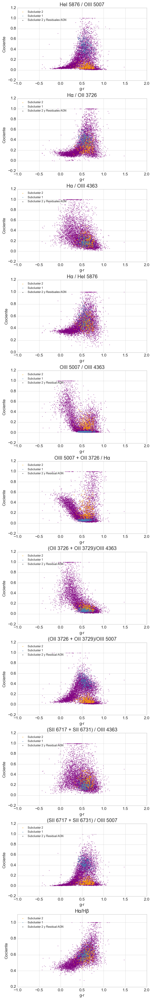

In [362]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = df_galaxies_SN2_normalized['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
axs[0].scatter(x_1, df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'], s=0.2, color='purple')
#axs[0].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_HeI 5876/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[0].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_HeI 5876/OIII 5007'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2 ')
axs[0].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_HeI 5876/OIII 5007'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1 ')
#axs[0].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_HeI 5876/OIII 5007'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[0].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_HeI 5876/OIII 5007_x'], s=0.7, color='black', label='Subcluster 2 y Residuales AGN')
axs[0].set_title('HeI 5876 / OIII 5007')
axs[0].legend(loc='upper left', fontsize=8)

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
axs[1].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OII 3726'], s=0.2, color='purple')
#axs[1].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OII 3726'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[1].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_Hα/OII 3726'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[1].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/OII 3726'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[1].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/OII 3726'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[1].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_Hα/OII 3726_x'], s=0.7, color='black', label='Subcluster 2 y Residuales AGN')
axs[1].set_title('Hα / OII 3726')
axs[1].legend(loc='upper left', fontsize=8)

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
axs[2].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'], s=0.2, color='purple')
#axs[2].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[2].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_Hα/OIII 4363'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[2].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[2].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[2].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_Hα/OIII 4363_x'], s=0.7, color='black', label='Subcluster 2 y Residuales AGN')
axs[2].set_title('Hα / OIII 4363')
axs[2].legend(loc='upper left', fontsize=8)

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
axs[3].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'], s=0.2, color='purple')
#axs[3].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/HeI 5876'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[3].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_Hα/HeI 5876'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[3].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/HeI 5876'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[3].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/HeI 5876'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[3].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_Hα/HeI 5876_x'], s=0.7, color='black', label='Subcluster 2 y Residuales AGN')
axs[3].set_title('Hα / HeI 5876')
axs[3].legend(loc='upper left', fontsize=8)

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
axs[4].scatter(x_1, df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'], s=0.2, color='purple')
#axs[4].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_OIII 5007/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[4].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[4].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[4].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_OIII 5007/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[4].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_OIII 5007/OIII 4363_x'], s=0.7, color='black', label='Subcluster 2 y Residual AGN')
axs[4].set_title('OIII 5007 / OIII 4363')
axs[4].legend(loc='upper left', fontsize=8)

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

axs[5].scatter(x_1, (df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα']), s=0.2, color='purple')
#axs[5].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OIII 5007 + OII 3726)/Hα'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[5].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[5].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[5].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(OIII 5007 + OII 3726)/Hα'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[5].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_(OIII 5007 + OII 3726)/Hα_x'], s=0.7, color='black', label='Subcluster 2 y Residual AGN')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')
axs[5].legend(loc='upper left', fontsize=8)

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
axs[6].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'] , s=0.2, color='purple')
#axs[6].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[6].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[6].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[6].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[6].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_(OII 3726 + OII 3729)/OIII 4363_x'], s=0.7, color='black', label='Subcluster 2 y Residual AGN')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')
axs[6].legend(loc='upper left', fontsize=8)

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
axs[7].scatter(x_1, df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'] , s=0.2, color='purple')
#axs[7].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(OII 3726 + OII 3729)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[7].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[7].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[7].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(OII 3726 + OII 3729)/OIII 5007'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[7].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_(OII 3726 + OII 3729)/OIII 5007_x'], s=0.7, color='black', label='Subcluster 2 y Residual AGN')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')
axs[7].legend(loc='upper left', fontsize=8)

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

axs[8].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=0.2, color='purple')
#axs[8].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 4363'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[8].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[8].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[8].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 4363'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[8].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_(SII 6717 + SII 6731)/OIII 4363_x'], s=0.7, color='black', label='Subcluster 2 y Residual AGN')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')
axs[8].legend(loc='upper left', fontsize=8)

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
axs[9].scatter(x_1, df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=0.2, color='purple')
#axs[9].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_(SII 6717 + SII 6731)/OIII 5007'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[9].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[9].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[9].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_(SII 6717 + SII 6731)/OIII 5007'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[9].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_(SII 6717 + SII 6731)/OIII 5007_x'], s=0.7, color='black', label='Subcluster 2 y Residual AGN')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')
axs[9].legend(loc='upper left', fontsize=8)

axs[10].scatter(x_1, df_galaxies_SN2_normalized['ratio_Hα/Hβ'] , s=0.2, color='purple')
#axs[10].scatter(x_1[df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], df_galaxies_SN2_normalized['ratio_Hα/Hβ'][df_galaxies_SN2_normalized['Cluster_norm_1'] >= 0], s=0.2, color='cyan', label='Cluster 1')
axs[10].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] == 0], secuencia_roja['ratio_Hα/Hβ'][secuencia_roja['Cluster_1'] == 0], s=0.7, color='orange', label='Subcluster 2')
axs[10].scatter(secuencia_roja['color_gr'][secuencia_roja['Cluster_1'] ==2], secuencia_roja['ratio_Hα/Hβ'][secuencia_roja['Cluster_1'] ==2], s=0.7, color='steelblue', label='Subcluster 1')
#axs[10].scatter(secuencia_roja['color_gr'][secuencia_roja['AGN_combinado'] == True], secuencia_roja['ratio_Hα/Hβ'][secuencia_roja['AGN_combinado'] == True], s=0.7, color='black', label='AGN')
axs[10].scatter(residual_secuencia_filtrada['color_gr_x'], residual_secuencia_filtrada['ratio_Hα/Hβ_x'], s=0.7, color='black', label='Subcluster 2 y Residual AGN')
axs[10].set_title('Hα/Hβ')
axs[10].legend(loc='upper left', fontsize=8)

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Cociente')

plt.style.use('seaborn-whitegrid')
plt.show()

Text(0.5, 1.0, 'Residuales de AGN dentro del subcluster de rojas')

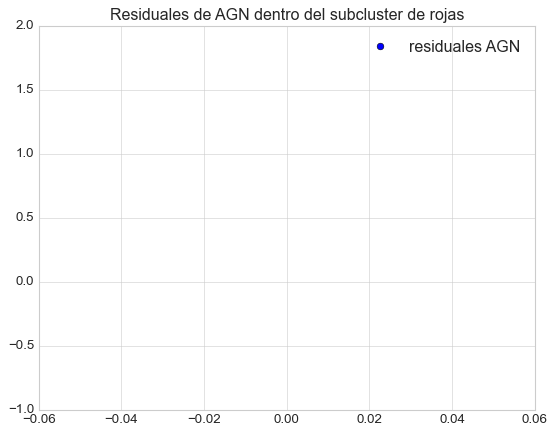

In [357]:
### Residuales de AGN en CDM
plt.plot(residual_secuencia_filtrada['M_r_x'], residual_secuencia_filtrada['color_gr_x'], 'o', label='residuales AGN')
plt.legend()
plt.ylim(-1, 2)
plt.title('Residuales de AGN dentro del subcluster de rojas')


In [438]:
residual_secuencia_filtrada['color_gr_x']

Series([], Name: color_gr_x, dtype: float64)

In [439]:
secuencia_roja.to_csv('subclusters_secuencia_roja.csv', index=False)

## Análisis de Características

In [29]:
#### Para evitar todo el proceso de arriba, traer el archivo #####

data = pd.read_csv('galaxy_ratios_SN2_norm.csv')
data

,specObjId,color_gr,M_r,z,AGN_Kewley,AGN_VO87-OI,AGN_BPT-NII,AGN_VO87-SII,ratio_OII 3729/OII 3726,ratio_OIII 4363/OII 3726,ratio_OIII 4363/OII 3729,ratio_Hβ/OII 3726,ratio_Hβ/OII 3729,ratio_Hβ/OIII 4363,ratio_OIII 4959/OII 3726,ratio_OIII 4959/OII 3729,ratio_OIII 4959/OIII 4363,ratio_OIII 4959/Hβ,ratio_OIII 5007/OII 3726,ratio_OIII 5007/OII 3729,ratio_OIII 5007/OIII 4363,ratio_OIII 5007/Hβ,ratio_OIII 5007/OIII 4959,ratio_HeI 5876/OII 3726,ratio_HeI 5876/OII 3729,ratio_HeI 5876/OIII 4363,ratio_HeI 5876/Hβ,ratio_HeI 5876/OIII 4959,ratio_HeI 5876/OIII 5007,ratio_OI 6300/OII 3726,ratio_OI 6300/OII 3729,ratio_OI 6300/OIII 4363,ratio_OI 6300/Hβ,ratio_OI 6300/OIII 4959,ratio_OI 6300/OIII 5007,ratio_OI 6300/HeI 5876,ratio_NII 6548/OII 3726,ratio_NII 6548/OII 3729,ratio_NII 6548/OIII 4363,ratio_NII 6548/Hβ,ratio_NII 6548/OIII 4959,ratio_NII 6548/OIII 5007,ratio_NII 6548/HeI 5876,ratio_NII 6548/OI 6300,ratio_Hα/OII 3726,ratio_Hα/OII 3729,ratio_Hα/OIII 4363,ratio_Hα/Hβ,ratio_Hα/OIII 4959,ratio_Hα/OIII 5007,ratio_Hα/HeI 5876,ratio_Hα/OI 6300,ratio_Hα/NII 6548,ratio_NII 6584/OII 3726,ratio_NII 6584/OII 3729,ratio_NII 6584/OIII 4363,ratio_NII 6584/Hβ,ratio_NII 6584/OIII 4959,ratio_NII 6584/OIII 5007,ratio_NII 6584/HeI 5876,ratio_NII 6584/OI 6300,ratio_NII 6584/NII 6548,ratio_NII 6584/Hα,ratio_SII 6717/OII 3726,ratio_SII 6717/OII 3729,ratio_SII 6717/OIII 4363,ratio_SII 6717/Hβ,ratio_SII 6717/OIII 4959,ratio_SII 6717/OIII 5007,ratio_SII 6717/HeI 5876,ratio_SII 6717/OI 6300,ratio_SII 6717/NII 6548,ratio_SII 6717/Hα,ratio_SII 6717/NII 6584,ratio_SII 6731/OII 3726,ratio_SII 6731/OII 3729,ratio_SII 6731/OIII 4363,ratio_SII 6731/Hβ,ratio_SII 6731/OIII 4959,ratio_SII 6731/OIII 5007,ratio_SII 6731/HeI 5876,ratio_SII 6731/OI 6300,ratio_SII 6731/NII 6548,ratio_SII 6731/Hα,ratio_SII 6731/NII 6584,ratio_SII 6731/SII 6717,ratio_(OII 3726 + OII 3729)/OIII 4363,ratio_(OII 3726 + OII 3729)/OIII 5007,ratio_(OIII 5007 + OII 3726)/Hα,ratio_(SII 6717 + SII 6731)/OIII 4363,ratio_(SII 6717 + SII 6731)/OIII 5007,Galaxy_Type,AGN_combinado,Cluster_norm_1
0,1890442071513262080,0.30752,-20.203112,0.504029,False,False,False,False,0.504204,0.048114,0.043558,0.206235,0.188048,0.504772,0.171179,0.153597,0.364170,0.201598,0.171426,0.153236,0.368026,0.202745,0.729099,0.204578,0.186095,0.459941,0.507583,0.083942,0.074641,0.082501,0.069395,0.352224,0.138794,0.053192,0.047099,0.146173,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.135576,0.125506,0.439122,0.458341,0.057801,0.051332,0.375139,0.421597,0.440531,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.999999,0.110408,0.120187,0.108067,0.424751,0.265839,0.051225,0.044772,0.247664,0.444487,0.412058,0.380545,0.412058,0.115305,0.101048,0.422004,0.242232,0.051854,0.045801,0.228203,0.467483,0.440515,0.367423,0.440514,0.685317,0.507747,0.153168,0.284893,0.424282,0.045058,Star Forming,False,0
1,1515512174368286720,0.13382,-17.908267,0.158843,False,False,False,False,0.530120,0.042947,0.036980,0.246846,0.214075,0.676861,0.326866,0.278954,0.779044,0.321618,0.321243,0.273118,0.772635,0.317425,0.715525,0.264186,0.228569,0.665415,0.547638,0.056769,0.051436,0.064537,0.051630,0.308677,0.090709,0.021791,0.019661,0.088545,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.172187,0.151605,0.624799,0.486340,0.038445,0.034790,0.368942,0.684490,0.580890,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.999999,0.083731,0.110507,0.094506,0.437530,0.204215,0.024666,0.021968,0.176338,0.522452,0.393363,0.275501,0.393363,0.104482,0.087087,0.428399,0.183383,0.024607,0.022147,0.160127,0.541517,0.414434,0.262146,0.414434,0.675384,0.584260,0.083952,0.338660,0.434341,0.021971,Star Forming,False,0
2,1849999284963928064,0.43996,-21.099340,0.658958,False,False,False,False,0.149755,0.048780,0.148684,0.212955,0.653764,0.514107,0.052832,0.159607,0.110862,0.060257,0.052682,0.158552,0.111557,0.060340,0.725982,0.216753,0.663847,0.480665,0.520823,0.288166,0.257336,0.

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_3163/3269832519.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


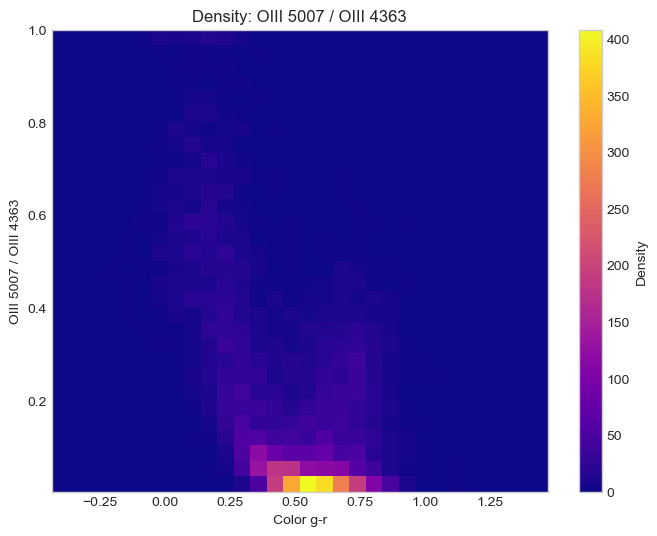

In [30]:
x_1 = data['color_gr']  
y = data['ratio_OIII 5007/OIII 4363']  

#histograma bidimensional
plt.figure(figsize=(8, 6))
plt.hist2d(x_1, y, bins=30, cmap='plasma')
plt.colorbar(label='Density')

plt.style.use('seaborn-whitegrid')
plt.title('Density: OIII 5007 / OIII 4363')
plt.xlabel('Color g-r')
plt.ylabel('OIII 5007 / OIII 4363')
plt.show()


/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_3163/2856387367.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


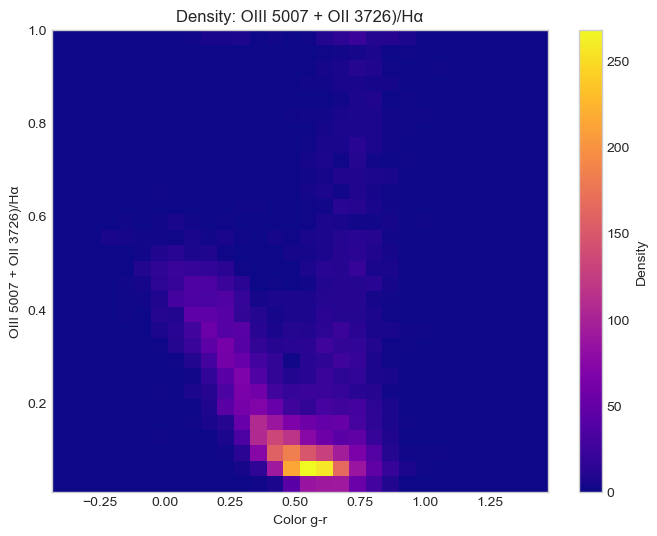

In [31]:
x_1 = data['color_gr']  
y = data['ratio_(OIII 5007 + OII 3726)/Hα']  

#histograma bidimensional
plt.figure(figsize=(8, 6))
plt.hist2d(x_1, y, bins=30, cmap='plasma')
plt.colorbar(label='Density')

plt.style.use('seaborn-whitegrid')
plt.title('Density: OIII 5007 + OII 3726)/Hα')
plt.xlabel('Color g-r')
plt.ylabel('OIII 5007 + OII 3726)/Hα')
plt.show()

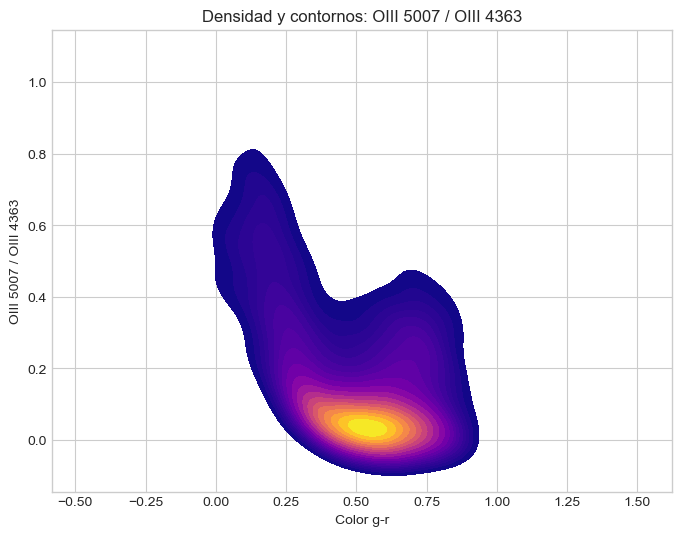

In [32]:
x_1 = data['color_gr']  # Color (x-axis)
y = data['ratio_OIII 5007/OIII 4363']  # Ratio (y-axis)

plt.figure(figsize=(8, 6))
sns.kdeplot(x=x_1, y=y, cmap="plasma", fill=True, levels=20, thresh=0.1)

plt.title('Densidad y contornos: OIII 5007 / OIII 4363')
plt.xlabel('Color g-r')
plt.ylabel('OIII 5007 / OIII 4363')
plt.show()


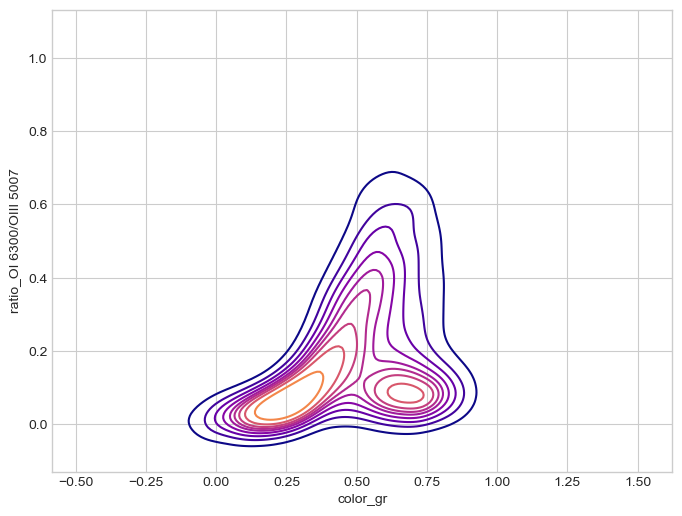

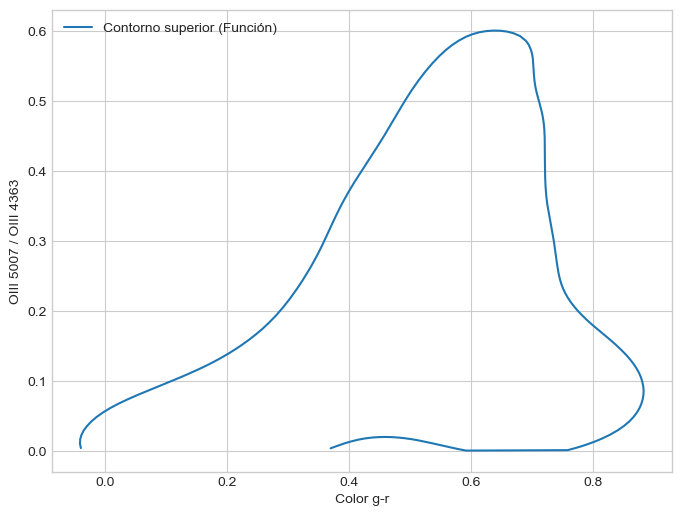

In [33]:
x_1 = data['color_gr']  # Color (x-axis)
#y = data['ratio_HeI 5876/OIII 5007']  # Ratio (y-axis)
y = data['ratio_OI 6300/OIII 5007']

plt.figure(figsize=(8, 6))
kde = sns.kdeplot(x=x_1, y=y, cmap="plasma", fill=False, levels=10, thresh=0.1)

contour_levels = kde.collections[1].get_paths() 

upper_contour = []
for path in contour_levels:
    vertices = path.vertices 
    upper_part = vertices[vertices[:, 1] > 0]  
    if len(upper_part) > 0:
        upper_contour.extend(upper_part)

upper_contour = np.array(upper_contour)

x_upper = upper_contour[:, 0]
y_upper = upper_contour[:, 1]

sorted_indices = np.argsort(x_upper)
x_sorted = x_upper[sorted_indices]
y_sorted = y_upper[sorted_indices]


plt.figure(figsize=(8, 6))
plt.plot(x_upper, y_upper, label="Contorno superior (Función)")
plt.xlabel("Color g-r")
plt.ylabel("OIII 5007 / OIII 4363")
plt.legend()
plt.show()


### Gaussian Mixtures 



In [34]:
### Funciones para la graficación ###

from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=0.5, cmap='inferno', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=0.5, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

In [55]:
#### Para todos los cocientes ####
"""for ratio in ratio_columns:
    x_1 = df_galaxies_SN2_normalized['color_gr']  
    y = df_galaxies_SN2_normalized[ratio]  

    plt.figure(figsize=(8, 6))
    kde = sns.kdeplot(x=x_1, y=y, cmap="plasma", fill=False, levels=10, thresh=0.1)

    contour_levels = kde.collections[1].get_paths()  # Penúltima capa (menor densidad)

    #solo lo que está ncima del eje X
    upper_contour = []
    for path in contour_levels:
        vertices = path.vertices  
        upper_part = vertices[vertices[:, 1] > 0] 
        if len(upper_part) > 0:
            upper_contour.extend(upper_part)

    upper_contour = np.array(upper_contour)

    x_upper = upper_contour[:, 0]
    y_upper = upper_contour[:, 1]

    #Grafico de la funcion
    plt.figure(figsize=(8, 6))
    plt.plot(x_upper, y_upper, label="Contorno superior (Función)")
    plt.title(f"{ratio} - Función del contorno superior")
    plt.xlabel("Color g-r")
    plt.ylabel(ratio)
    plt.legend()
    plt.show()"""


'for ratio in ratio_columns:\n    x_1 = df_galaxies_SN2_normalized[\'color_gr\']  \n    y = df_galaxies_SN2_normalized[ratio]  \n\n    plt.figure(figsize=(8, 6))\n    kde = sns.kdeplot(x=x_1, y=y, cmap="plasma", fill=False, levels=10, thresh=0.1)\n\n    contour_levels = kde.collections[1].get_paths()  # Penúltima capa (menor densidad)\n\n    #solo lo que está ncima del eje X\n    upper_contour = []\n    for path in contour_levels:\n        vertices = path.vertices  \n        upper_part = vertices[vertices[:, 1] > 0] \n        if len(upper_part) > 0:\n            upper_contour.extend(upper_part)\n\n    upper_contour = np.array(upper_contour)\n\n    x_upper = upper_contour[:, 0]\n    y_upper = upper_contour[:, 1]\n\n    #Grafico de la funcion\n    plt.figure(figsize=(8, 6))\n    plt.plot(x_upper, y_upper, label="Contorno superior (Función)")\n    plt.title(f"{ratio} - Función del contorno superior")\n    plt.xlabel("Color g-r")\n    plt.ylabel(ratio)\n    plt.legend()\n    plt.show()'

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_3163/4120950634.py:20: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.add_patch(Ellipse(position, nsig * width, nsig * height,
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


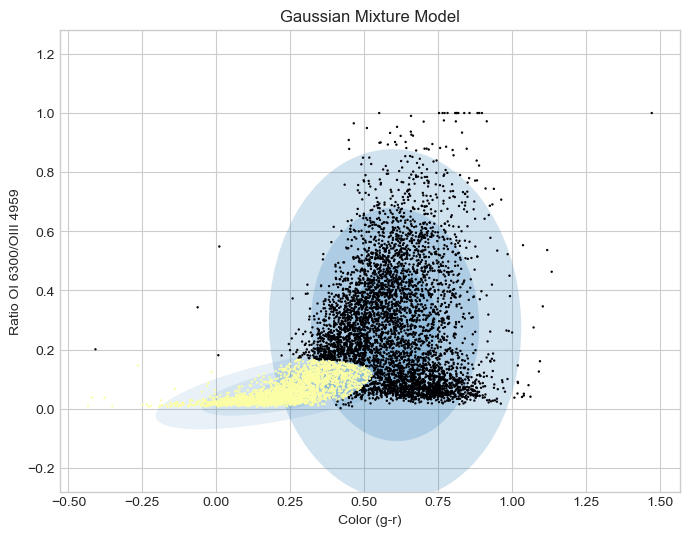

BIC: -11079.69 | AIC: -11155.19


In [35]:
from sklearn.mixture import GaussianMixture


color = data['color_gr'].dropna().values  # Eje X
#ratio = data['ratio_OIII 5007/OIII 4959'].dropna().values.reshape(-1, 1)  
#ratio = data['ratio_HeI 5876/OIII 5007'].dropna().values.reshape(-1, 1)  
#ratio = data['ratio_OI 6300/OIII 4959'].dropna().values.reshape(-1, 1) 
ratio = data['ratio_OI 6300/OIII 5007'].dropna().values.reshape(-1, 1) 



data_2d = np.column_stack((color, ratio))

gmm_2d = GaussianMixture(n_components=2, random_state=42)
gmm_2d.fit(data_2d)

labels = gmm_2d.predict(data_2d)


plt.figure(figsize=(8, 6))
#plt.scatter(color, ratio, c=labels, cmap='viridis', s=10, label='Datos')
plot_gmm(gmm_2d, data_2d)
plt.title('Gaussian Mixture Model')
plt.xlabel('Color (g-r)')
plt.ylabel('Ratio OI 6300/OIII 4959')
#plt.colorbar(label='Componente GMM')
plt.legend()
plt.show()

# Evaluar métricas del modelo
bic = gmm_2d.bic(data_2d)
aic = gmm_2d.aic(data_2d)
print(f"BIC: {bic:.2f} | AIC: {aic:.2f}")


In [36]:
centers = gmm_2d.means_  # Centros de las componentes
covariances = gmm_2d.covariances_  # Covarianzas
print("Centros de las componentes (Color, Cociente):")
print(centers)


Centros de las componentes (Color, Cociente):
[[0.60440144 0.28534704]
 [0.25872855 0.06900721]]


Considerando los pesos dados por los contornos de los kernel:

In [48]:
color = data['color_gr'].dropna().values  # Eje X
#ratio = data['ratio_OIII 5007/OIII 4959'].dropna().values.reshape(-1, 1)  
#ratio = data['ratio_HeI 5876/OIII 5007'].dropna().values.reshape(-1, 1)  
#ratio = data['ratio_OI 6300/OIII 4959'].dropna().values.reshape(-1, 1) 
#ratio = data['ratio_OI 6300/OIII 5007'].dropna().values.reshape(-1, 1) 
#ratio = data['ratio_NII 6548/OIII 5007'].dropna().values.reshape(-1, 1) 
#ratio = data['ratio_NII 6548/OIII 4959'].dropna().values.reshape(-1, 1) 
#ratio = data['ratio_NII 6548/OI 6300'].dropna().values.reshape(-1, 1) 
#ratio = data['ratio_Hα/OIII 5007'].dropna().values.reshape(-1, 1) 
#ratio = data['ratio_SII 6717/OIII 4959'].dropna().values.reshape(-1, 1)
#ratio = data['ratio_SII 6717/OIII 5007'].dropna().values.reshape(-1, 1)
#ratio = data['ratio_SII 6731/OIII 4959'].dropna().values.reshape(-1, 1)
#ratio = data['ratio_(SII 6717 + SII 6731)/OIII 5007'].dropna().values.reshape(-1, 1)
ratio = data['ratio_(OII 3726 + OII 3729)/OIII 5007'].dropna().values.reshape(-1, 1)

##Bimodales
#ratio = data['ratio_OIII 4959/OII 3726'].dropna().values.reshape(-1, 1)


data_2d = np.column_stack((color, ratio))

In [49]:
from scipy.stats import gaussian_kde

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


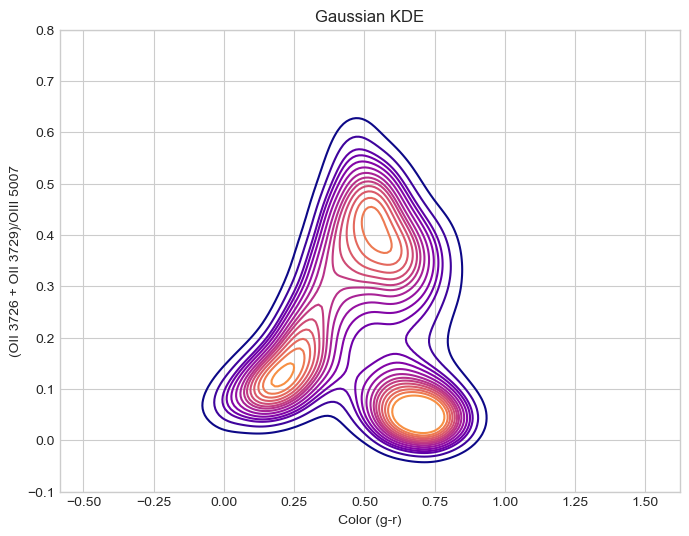

In [57]:

kde = gaussian_kde(data_2d.T)  
kde_values = kde(data_2d.T)   

#normalizar los pesos
weights = kde_values / np.sum(kde_values)

# Resample data based on KDE weights
data_indices = np.random.choice(range(len(data_2d)), size=len(data_2d), replace=True, p=weights)
resampled_data = data_2d[data_indices]

gmm = GaussianMixture(n_components=3, covariance_type='full', random_state=42)
gmm.fit(resampled_data)

plt.figure(figsize=(8, 6))
sns.kdeplot(x=data_2d[:, 0], y=data_2d[:, 1], cmap="plasma", fill=False, levels=15, thresh=0.1)
#plot_gmm(gmm, resampled_data)

plt.title("Gaussian KDE")
plt.xlabel("Color (g-r)")
#plt.ylabel("(SII 6717 + SII 6731)/OIII 5007")

plt.ylabel('(OII 3726 + OII 3729)/OIII 5007')
plt.legend()
plt.ylim(-0.1, 0.8)
plt.show()


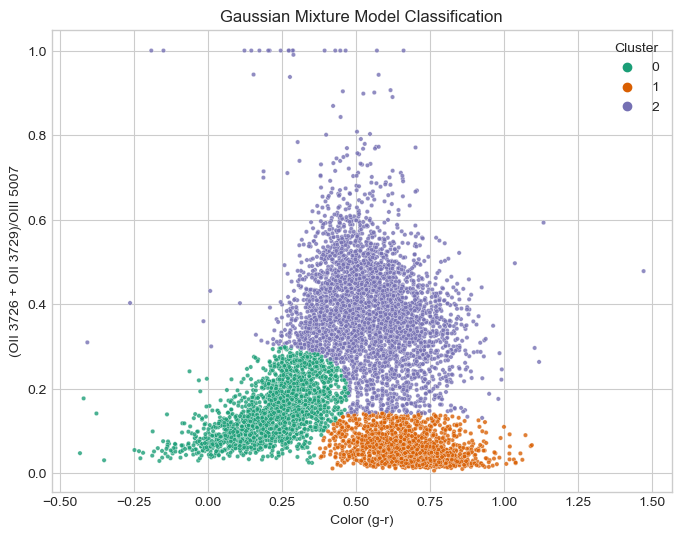

,specObjId,color_gr,M_r,z,AGN_Kewley,AGN_VO87-OI,AGN_BPT-NII,AGN_VO87-SII,ratio_OII 3729/OII 3726,ratio_OIII 4363/OII 3726,ratio_OIII 4363/OII 3729,ratio_Hβ/OII 3726,ratio_Hβ/OII 3729,ratio_Hβ/OIII 4363,ratio_OIII 4959/OII 3726,ratio_OIII 4959/OII 3729,ratio_OIII 4959/OIII 4363,ratio_OIII 4959/Hβ,ratio_OIII 5007/OII 3726,ratio_OIII 5007/OII 3729,ratio_OIII 5007/OIII 4363,ratio_OIII 5007/Hβ,ratio_OIII 5007/OIII 4959,ratio_HeI 5876/OII 3726,ratio_HeI 5876/OII 3729,ratio_HeI 5876/OIII 4363,ratio_HeI 5876/Hβ,ratio_HeI 5876/OIII 4959,ratio_HeI 5876/OIII 5007,ratio_OI 6300/OII 3726,ratio_OI 6300/OII 3729,ratio_OI 6300/OIII 4363,ratio_OI 6300/Hβ,ratio_OI 6300/OIII 4959,ratio_OI 6300/OIII 5007,ratio_OI 6300/HeI 5876,ratio_NII 6548/OII 3726,ratio_NII 6548/OII 3729,ratio_NII 6548/OIII 4363,ratio_NII 6548/Hβ,ratio_NII 6548/OIII 4959,ratio_NII 6548/OIII 5007,ratio_NII 6548/HeI 5876,ratio_NII 6548/OI 6300,ratio_Hα/OII 3726,ratio_Hα/OII 3729,ratio_Hα/OIII 4363,ratio_Hα/Hβ,ratio_Hα/OIII 4959,ratio_Hα/OIII 5007,ratio_Hα/HeI 5876,ratio_Hα/OI 6300,ratio_Hα/NII 6548,ratio_NII 6584/OII 3726,ratio_NII 6584/OII 3729,ratio_NII 6584/OIII 4363,ratio_NII 6584/Hβ,ratio_NII 6584/OIII 4959,ratio_NII 6584/OIII 5007,ratio_NII 6584/HeI 5876,ratio_NII 6584/OI 6300,ratio_NII 6584/NII 6548,ratio_NII 6584/Hα,ratio_SII 6717/OII 3726,ratio_SII 6717/OII 3729,ratio_SII 6717/OIII 4363,ratio_SII 6717/Hβ,ratio_SII 6717/OIII 4959,ratio_SII 6717/OIII 5007,ratio_SII 6717/HeI 5876,ratio_SII 6717/OI 6300,ratio_SII 6717/NII 6548,ratio_SII 6717/Hα,ratio_SII 6717/NII 6584,ratio_SII 6731/OII 3726,ratio_SII 6731/OII 3729,ratio_SII 6731/OIII 4363,ratio_SII 6731/Hβ,ratio_SII 6731/OIII 4959,ratio_SII 6731/OIII 5007,ratio_SII 6731/HeI 5876,ratio_SII 6731/OI 6300,ratio_SII 6731/NII 6548,ratio_SII 6731/Hα,ratio_SII 6731/NII 6584,ratio_SII 6731/SII 6717,ratio_(OII 3726 + OII 3729)/OIII 4363,ratio_(OII 3726 + OII 3729)/OIII 5007,ratio_(OIII 5007 + OII 3726)/Hα,ratio_(SII 6717 + SII 6731)/OIII 4363,ratio_(SII 6717 + SII 6731)/OIII 5007,Galaxy_Type,AGN_combinado,Cluster_norm_1,Cluster
0,1890442071513262080,0.30752,-20.203112,0.504029,False,False,False,False,0.504204,0.048114,0.043558,0.206235,0.188048,0.504772,0.171179,0.153597,0.364170,0.201598,0.171426,0.153236,0.368026,0.202745,0.729099,0.204578,0.186095,0.459941,0.507583,0.083942,0.074641,0.082501,0.069395,0.352224,0.138794,0.053192,0.047099,0.146173,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.135576,0.125506,0.439122,0.458341,0.057801,0.051332,0.375139,0.421597,0.440531,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.999999,0.110408,0.120187,0.108067,0.424751,0.265839,0.051225,0.044772,0.247664,0.444487,0.412058,0.380545,0.412058,0.115305,0.101048,0.422004,0.242232,0.051854,0.045801,0.228203,0.467483,0.440515,0.367423,0.440514,0.685317,0.507747,0.153168,0.284893,0.424282,0.045058,Star Forming,False,0,0
1,1515512174368286720,0.13382,-17.908267,0.158843,False,False,False,False,0.530120,0.042947,0.036980,0.246846,0.214075,0.676861,0.326866,0.278954,0.779044,0.321618,0.321243,0.273118,0.772635,0.317425,0.715525,0.264186,0.228569,0.665415,0.547638,0.056769,0.051436,0.064537,0.051630,0.308677,0.090709,0.021791,0.019661,0.088545,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.172187,0.151605,0.624799,0.486340,0.038445,0.034790,0.368942,0.684490,0.580890,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.999999,0.083731,0.110507,0.094506,0.437530,0.204215,0.024666,0.021968,0.176338,0.522452,0.393363,0.275501,0.393363,0.104482,0.087087,0.428399,0.183383,0.024607,0.022147,0.160127,0.541517,0.414434,0.262146,0.414434,0.675384,0.584260,0.083952,0.338660,0.434341,0.021971,Star Forming,False,0,0
2,1849999284963928064,0.43996,-21.099340,0.658958,False,False,False,False,0.149755,0.048780,0.148684,0.212955,0.653764,0.514107,0.052832,0.159607,0.110862,0.060257,0.052682,0.158552,0.111557,0.060340,0.725982,0.216753,0.663847,0.480665,0.520823,0.288166

In [52]:

# Classify the original data points based on the GMM
cluster_labels = gmm.predict(data_2d)

# Add the classification labels to the original DataFrame
data['Cluster'] = cluster_labels

plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=data_2d[:, 0],
    y=data_2d[:, 1],
    hue=cluster_labels,
    palette='Dark2',
    s=10,
    alpha=0.8
)

plt.title("Gaussian Mixture Model Classification")
plt.xlabel("Color (g-r)")
plt.ylabel("(SII 6717 + SII 6731)/OIII 5007")
plt.ylabel("(OII 3726 + OII 3729)/OIII 5007")
plt.legend(title="Cluster")
plt.show()

# Preview the updated DataFrame
data.head()


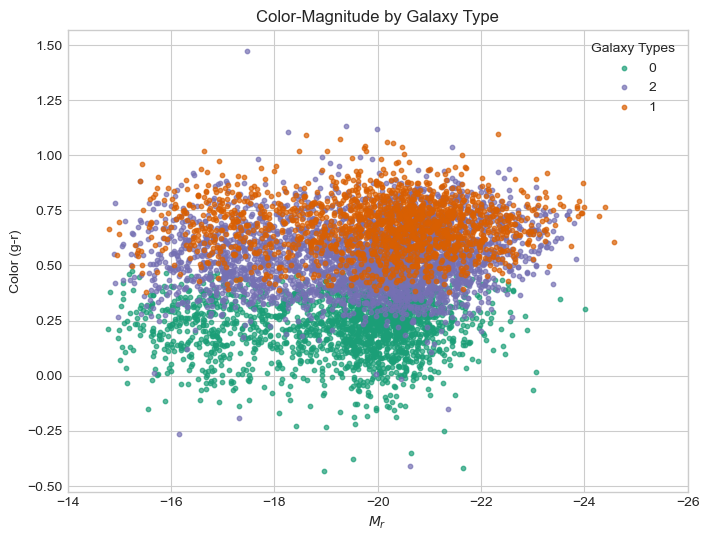

In [53]:
cmap = plt.get_cmap('Dark2')
label_column = 'Cluster'
x_column = 'M_r'
y_column = 'color_gr'

labels = data[label_column].unique()
colors = [cmap(i) for i in [0.0, 0.25, 0.125]] # Ensure enough distinct colors

plt.figure(figsize=(8, 6))

# Plot each group separately
for i, label in enumerate(labels):
    subset = data[data[label_column] == label]
    plt.scatter(subset[x_column], subset[y_column], label=label, color=colors[i], s=10, alpha=0.7)

# Labels and title
plt.xlabel(f'${x_column}$')
plt.xlim(-14,-26)
plt.ylabel('Color (g-r)')
plt.title('Color-Magnitude by Galaxy Type')
plt.legend(title="Galaxy Types")
plt.grid(True)
plt.show()


/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/4053945700.py:100: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


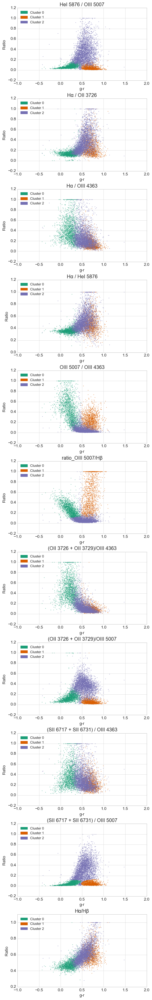

In [503]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = data['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
axs[0].scatter(x_1[data['Cluster']==0], data['ratio_HeI 5876/OIII 5007'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[0].scatter(x_1[data['Cluster'] ==1], data['ratio_HeI 5876/OIII 5007'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[0].scatter(x_1[data['Cluster'] ==2], data['ratio_HeI 5876/OIII 5007'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[0].set_title('HeI 5876 / OIII 5007')

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
axs[1].scatter(x_1[data['Cluster']==0], data['ratio_Hα/OII 3726'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[1].scatter(x_1[data['Cluster'] ==1], data['ratio_Hα/OII 3726'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[1].scatter(x_1[data['Cluster'] ==2], data['ratio_Hα/OII 3726'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[1].set_title('Hα / OII 3726')

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
axs[2].scatter(x_1[data['Cluster']==0], data['ratio_Hα/OIII 4363'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[2].scatter(x_1[data['Cluster'] ==1], data['ratio_Hα/OIII 4363'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[2].scatter(x_1[data['Cluster'] ==2], data['ratio_Hα/OIII 4363'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[2].set_title('Hα / OIII 4363')

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
axs[3].scatter(x_1[data['Cluster']==0], data['ratio_Hα/HeI 5876'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[3].scatter(x_1[data['Cluster'] ==1], data['ratio_Hα/HeI 5876'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[3].scatter(x_1[data['Cluster'] ==2], data['ratio_Hα/HeI 5876'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[3].set_title('Hα / HeI 5876')

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
axs[4].scatter(x_1[data['Cluster']==0], data['ratio_OIII 5007/OIII 4363'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[4].scatter(x_1[data['Cluster'] ==1], data['ratio_OIII 5007/OIII 4363'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[4].scatter(x_1[data['Cluster'] ==2], data['ratio_OIII 5007/OIII 4363'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[4].set_title('OIII 5007 / OIII 4363')

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

axs[5].scatter(x_1[data['Cluster']==0], data['ratio_OIII 5007/Hβ'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[5].scatter(x_1[data['Cluster'] ==1], data['ratio_OIII 5007/Hβ'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[5].scatter(x_1[data['Cluster'] ==2], data['ratio_OIII 5007/Hβ'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[5].set_title('ratio_OIII 5007/Hβ')
"""
axs[5].scatter(x_1[data['Cluster']==0], data['ratio_(OIII 5007 + OII 3726)/Hα'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[5].scatter(x_1[data['Cluster'] ==1], data['ratio_(OIII 5007 + OII 3726)/Hα'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[5].scatter(x_1[data['Cluster'] ==2], data['ratio_(OIII 5007 + OII 3726)/Hα'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')"""

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
axs[6].scatter(x_1[data['Cluster']==0], data['ratio_(OII 3726 + OII 3729)/OIII 4363'][data['Cluster']==0] , s=0.2, color=colors[0], label='0')
axs[6].scatter(x_1[data['Cluster'] ==1], data['ratio_(OII 3726 + OII 3729)/OIII 4363'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[6].scatter(x_1[data['Cluster'] ==2], data['ratio_(OII 3726 + OII 3729)/OIII 4363'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
axs[7].scatter(x_1[data['Cluster']==0], data['ratio_(OII 3726 + OII 3729)/OIII 5007'][data['Cluster']==0] , s=0.2, color=colors[0], label='0')
axs[7].scatter(x_1[data['Cluster'] ==1], data['ratio_(OII 3726 + OII 3729)/OIII 5007'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[7].scatter(x_1[data['Cluster'] ==2], data['ratio_(OII 3726 + OII 3729)/OIII 5007'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

axs[8].scatter(x_1[data['Cluster']==0], data['ratio_(SII 6717 + SII 6731)/OIII 4363'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[8].scatter(x_1[data['Cluster'] ==1], data['ratio_(SII 6717 + SII 6731)/OIII 4363'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[8].scatter(x_1[data['Cluster'] ==2], data['ratio_(SII 6717 + SII 6731)/OIII 4363'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
axs[9].scatter(x_1[data['Cluster']==0], data['ratio_(SII 6717 + SII 6731)/OIII 5007'][data['Cluster']==0], s=0.2, color=colors[0], label='0')
axs[9].scatter(x_1[data['Cluster'] ==1], data['ratio_(SII 6717 + SII 6731)/OIII 5007'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[9].scatter(x_1[data['Cluster'] ==2], data['ratio_(SII 6717 + SII 6731)/OIII 5007'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')

axs[10].scatter(x_1[data['Cluster']==0], data['ratio_Hα/Hβ'][data['Cluster']==0] , s=0.2, color=colors[0], label='0')
axs[10].scatter(x_1[data['Cluster'] ==1], data['ratio_Hα/Hβ'][data['Cluster'] ==1], s=0.2, color=colors[1], label='1')
axs[10].scatter(x_1[data['Cluster'] ==2], data['ratio_Hα/Hβ'][data['Cluster'] ==2], s=0.2, color=colors[2], label='2')
axs[10].set_title('Hα/Hβ')


legend_handles = [mpatches.Patch(color=colors[0], label='Cluster 0'),
                  mpatches.Patch(color=colors[1], label='Cluster 1'),
                  mpatches.Patch(color=colors[2], label='Cluster 2')]

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Ratio')
    ax.legend(handles=legend_handles, loc='upper left', prop={'size': 10})

plt.style.use('seaborn-whitegrid')
plt.show()

In [514]:
data

,specObjId,color_gr,M_r,z,AGN_Kewley,AGN_VO87-OI,AGN_BPT-NII,AGN_VO87-SII,ratio_OII 3729/OII 3726,ratio_OIII 4363/OII 3726,ratio_OIII 4363/OII 3729,ratio_Hβ/OII 3726,ratio_Hβ/OII 3729,ratio_Hβ/OIII 4363,ratio_OIII 4959/OII 3726,ratio_OIII 4959/OII 3729,ratio_OIII 4959/OIII 4363,ratio_OIII 4959/Hβ,ratio_OIII 5007/OII 3726,ratio_OIII 5007/OII 3729,ratio_OIII 5007/OIII 4363,ratio_OIII 5007/Hβ,ratio_OIII 5007/OIII 4959,ratio_HeI 5876/OII 3726,ratio_HeI 5876/OII 3729,ratio_HeI 5876/OIII 4363,ratio_HeI 5876/Hβ,ratio_HeI 5876/OIII 4959,ratio_HeI 5876/OIII 5007,ratio_OI 6300/OII 3726,ratio_OI 6300/OII 3729,ratio_OI 6300/OIII 4363,ratio_OI 6300/Hβ,ratio_OI 6300/OIII 4959,ratio_OI 6300/OIII 5007,ratio_OI 6300/HeI 5876,ratio_NII 6548/OII 3726,ratio_NII 6548/OII 3729,ratio_NII 6548/OIII 4363,ratio_NII 6548/Hβ,ratio_NII 6548/OIII 4959,ratio_NII 6548/OIII 5007,ratio_NII 6548/HeI 5876,ratio_NII 6548/OI 6300,ratio_Hα/OII 3726,ratio_Hα/OII 3729,ratio_Hα/OIII 4363,ratio_Hα/Hβ,ratio_Hα/OIII 4959,ratio_Hα/OIII 5007,ratio_Hα/HeI 5876,ratio_Hα/OI 6300,ratio_Hα/NII 6548,ratio_NII 6584/OII 3726,ratio_NII 6584/OII 3729,ratio_NII 6584/OIII 4363,ratio_NII 6584/Hβ,ratio_NII 6584/OIII 4959,ratio_NII 6584/OIII 5007,ratio_NII 6584/HeI 5876,ratio_NII 6584/OI 6300,ratio_NII 6584/NII 6548,ratio_NII 6584/Hα,ratio_SII 6717/OII 3726,ratio_SII 6717/OII 3729,ratio_SII 6717/OIII 4363,ratio_SII 6717/Hβ,ratio_SII 6717/OIII 4959,ratio_SII 6717/OIII 5007,ratio_SII 6717/HeI 5876,ratio_SII 6717/OI 6300,ratio_SII 6717/NII 6548,ratio_SII 6717/Hα,ratio_SII 6717/NII 6584,ratio_SII 6731/OII 3726,ratio_SII 6731/OII 3729,ratio_SII 6731/OIII 4363,ratio_SII 6731/Hβ,ratio_SII 6731/OIII 4959,ratio_SII 6731/OIII 5007,ratio_SII 6731/HeI 5876,ratio_SII 6731/OI 6300,ratio_SII 6731/NII 6548,ratio_SII 6731/Hα,ratio_SII 6731/NII 6584,ratio_SII 6731/SII 6717,ratio_(OII 3726 + OII 3729)/OIII 4363,ratio_(OII 3726 + OII 3729)/OIII 5007,ratio_(OIII 5007 + OII 3726)/Hα,ratio_(SII 6717 + SII 6731)/OIII 4363,ratio_(SII 6717 + SII 6731)/OIII 5007,Galaxy_Type,AGN_combinado,Cluster_norm_1,Cluster
0,1890442071513262080,0.30752,-20.203112,0.504029,False,False,False,False,0.504204,0.048114,0.043558,0.206235,0.188048,0.504772,0.171179,0.153597,0.364170,0.201598,0.171426,0.153236,0.368026,0.202745,0.729099,0.204578,0.186095,0.459941,0.507583,0.083942,0.074641,0.082501,0.069395,0.352224,0.138794,0.053192,0.047099,0.146173,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.135576,0.125506,0.439122,0.458341,0.057801,0.051332,0.375139,0.421597,0.440531,0.036857,0.032662,0.196776,0.075248,0.021539,0.018773,0.075561,0.175316,0.999999,0.110408,0.120187,0.108067,0.424751,0.265839,0.051225,0.044772,0.247664,0.444487,0.412058,0.380545,0.412058,0.115305,0.101048,0.422004,0.242232,0.051854,0.045801,0.228203,0.467483,0.440515,0.367423,0.440514,0.685317,0.507747,0.153168,0.284893,0.424282,0.045058,Star Forming,False,0,0
1,1515512174368286720,0.13382,-17.908267,0.158843,False,False,False,False,0.530120,0.042947,0.036980,0.246846,0.214075,0.676861,0.326866,0.278954,0.779044,0.321618,0.321243,0.273118,0.772635,0.317425,0.715525,0.264186,0.228569,0.665415,0.547638,0.056769,0.051436,0.064537,0.051630,0.308677,0.090709,0.021791,0.019661,0.088545,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.172187,0.151605,0.624799,0.486340,0.038445,0.034790,0.368942,0.684490,0.580890,0.035499,0.029921,0.212329,0.060552,0.010864,0.009649,0.056357,0.215860,0.999999,0.083731,0.110507,0.094506,0.437530,0.204215,0.024666,0.021968,0.176338,0.522452,0.393363,0.275501,0.393363,0.104482,0.087087,0.428399,0.183383,0.024607,0.022147,0.160127,0.541517,0.414434,0.262146,0.414434,0.675384,0.584260,0.083952,0.338660,0.434341,0.021971,Star Forming,False,0,0
2,1849999284963928064,0.43996,-21.099340,0.658958,False,False,False,False,0.149755,0.048780,0.148684,0.212955,0.653764,0.514107,0.052832,0.159607,0.110862,0.060257,0.052682,0.158552,0.111557,0.060340,0.725982,0.216753,0.663847,0.480665,0.520823,0.288166

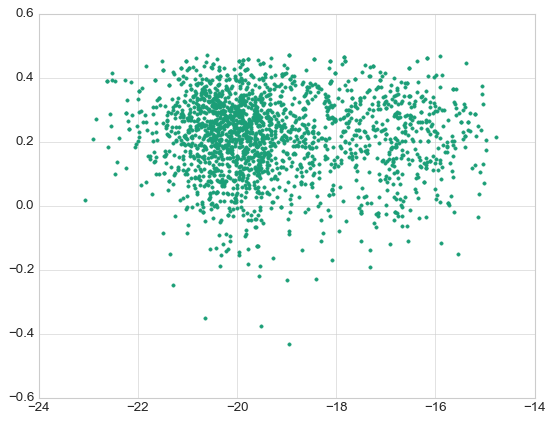

In [515]:
plt.plot(data['M_r'][(data['AGN_combinado'] == True) & (data['Cluster'] == 0)], data['color_gr'][(data['AGN_combinado'] == True) & (data['Cluster'] == 0)], '.', color=colors[0])
#plt.plot(data['M_r'][data['Cluster'] == 1], data['color_gr'][data['Cluster'] == 1], '.', color='green')
plt.plot(data['M_r'][(data['Cluster'] == 0)], data['color_gr'][(data['Cluster'] == 0)], '.', color=colors[0])



In [ ]:
data['M_r'][((data['AGN_combinado'] == True) & (data['Cluster'] == 1))]

#len(data['Cluster'] == 1)/len(data['AGN_combinado'] == True)

1.0

In [ ]:
data['M_r'][data['AGN_combinado'] == True]
data['M_r'][data['Cluster'] == 2]

#1514/3649 #2281 

0.41490819402576046

In [541]:
subsample = data[(data['AGN_combinado'] == False) & (data['Cluster'] == 2)]
ratio_columns = [col for col in data.columns if 'ratio_' in col]
ratios_data_norm = subsample[ratio_columns]
max_values = ratios_data_norm.max().values  # Max values for each ratio
vol = np.prod(max_values)  # Compute the volume
l = (vol / len(subsample)) ** (1.0 / len(max_values))  # Compute homogeneous minimum volume scale


In [545]:
dbscan = DBSCAN(eps=0.5 * l, min_samples=13)  # Adjust eps and min_samples as needed
clusters = dbscan.fit_predict(ratios_data_norm)

subsample['DBSCAN_Cluster'] = clusters  # Add cluster labels to the subsample


In [546]:
subsample['DBSCAN_Cluster'].value_counts()


-1    1813
 0    1145
Name: DBSCAN_Cluster, dtype: int64

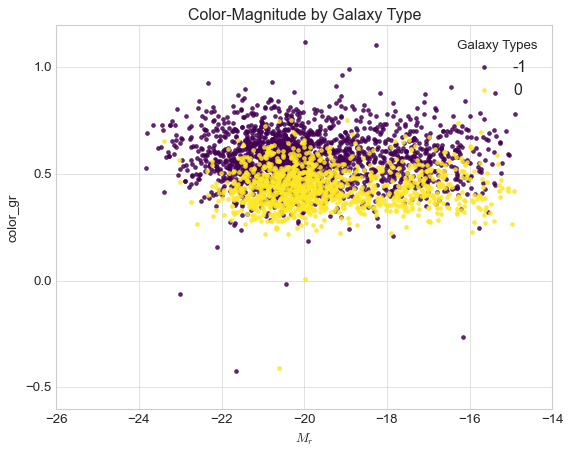

In [547]:
graficos.color_Mag_by_label(subsample, 'color_gr', label_column='DBSCAN_Cluster')


/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_6979/3412628900.py:79: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


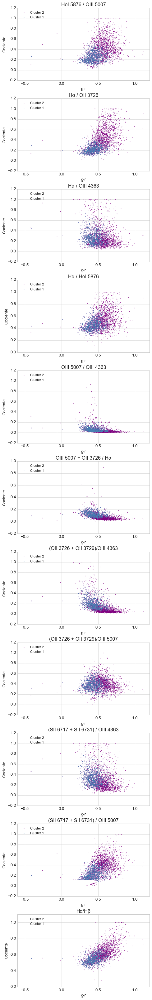

In [548]:
#### Cocientes interesantes a revisar ####

fig, axs = plt.subplots(11, 1, figsize=(6, 40), constrained_layout=True)  

#x = df_galaxies['color_gr'] # SN > 5
x_1 = subsample['color_gr'] # SN > 2

# Gráfico 1: HeI 5876 / OIII 5007

#axs[0].scatter(x, df_galaxies['ratio_HeI 5876/OIII 5007'], s=0.2) 
axs[0].scatter(x_1, subsample['ratio_HeI 5876/OIII 5007'], s=0.2, color='purple', label='Cluster 2')
axs[0].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_HeI 5876/OIII 5007'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[0].set_title('HeI 5876 / OIII 5007')

# Gráfico 2: Hα / OII 3726

#axs[1].scatter(x, df_galaxies['ratio_Hα/OII 3726'], s=0.2)
axs[1].scatter(x_1, subsample['ratio_Hα/OII 3726'], s=0.2, color='purple', label='Cluster 2')
axs[1].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_Hα/OII 3726'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[1].set_title('Hα / OII 3726')

# Gráfico 3: Hα / OIII 4363

#axs[2].scatter(x, df_galaxies['ratio_Hα/OIII 4363'], s=0.2)
axs[2].scatter(x_1, subsample['ratio_Hα/OIII 4363'], s=0.2, color='purple', label='Cluster 2')
axs[2].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_Hα/OIII 4363'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[2].set_title('Hα / OIII 4363')

# Gráfico 4: Hα / HeI 5876

#axs[3].scatter(x, df_galaxies['ratio_Hα/HeI 5876'], s=0.2)
axs[3].scatter(x_1, subsample['ratio_Hα/HeI 5876'], s=0.2, color='purple', label='Cluster 2')
axs[3].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_Hα/HeI 5876'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[3].set_title('Hα / HeI 5876')

# Gráfico 5: OIII 5007 / OIII 4363

#axs[4].scatter(x, df_galaxies['ratio_OIII 5007/OIII 4363'], s=0.2)  # IMPORTANTE
axs[4].scatter(x_1, subsample['ratio_OIII 5007/OIII 4363'], s=0.2, color='purple', label='Cluster 2')
axs[4].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_OIII 5007/OIII 4363'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[4].set_title('OIII 5007 / OIII 4363')

# Gráfico 6: (OIII 5007 + OII 3726) / Hα

axs[5].scatter(x_1, (subsample['ratio_(OIII 5007 + OII 3726)/Hα']), s=0.2, color='purple', label='Cluster 2')
axs[5].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_(OIII 5007 + OII 3726)/Hα'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[5].set_title('OIII 5007 + OII 3726 / Hα')

# Gráfico 7: (OII 3726 + OII 3729) / OIII 4363
axs[6].scatter(x_1, subsample['ratio_(OII 3726 + OII 3729)/OIII 4363'] , s=0.2, color='purple', label='Cluster 2')
axs[6].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_(OII 3726 + OII 3729)/OIII 4363'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[6].set_title('(OII 3726 + OII 3729)/OIII 4363')

# Gráfico 8: (OII 3726 + OII 3729) / OIII 5007
axs[7].scatter(x_1, subsample['ratio_(OII 3726 + OII 3729)/OIII 5007'] , s=0.2, color='purple', label='Cluster 2')
axs[7].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_(OII 3726 + OII 3729)/OIII 5007'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[7].set_title('(OII 3726 + OII 3729)/OIII 5007')

# Gráfico 9: (SII 6717 + SII 6731) / OIII 4363

axs[8].scatter(x_1, subsample['ratio_(SII 6717 + SII 6731)/OIII 4363'], s=0.2, color='purple', label='Cluster 2')
axs[8].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_(SII 6717 + SII 6731)/OIII 4363'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[8].set_title('(SII 6717 + SII 6731) / OIII 4363')

# Gráfico 10: (SII 6717 + SII 6731) / OIII 5007
axs[9].scatter(x_1, subsample['ratio_(SII 6717 + SII 6731)/OIII 5007'], s=0.2, color='purple', label='Cluster 2')
axs[9].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_(SII 6717 + SII 6731)/OIII 5007'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[9].set_title('(SII 6717 + SII 6731) / OIII 5007')

axs[10].scatter(x_1, subsample['ratio_Hα/Hβ'] , s=0.2, color='purple', label='Cluster 2')
axs[10].scatter(x_1[subsample['DBSCAN_Cluster'] == 0], subsample['ratio_Hα/Hβ'][subsample['DBSCAN_Cluster'] == 0], s=0.2, color='steelblue', label='Cluster 1')
axs[10].set_title('Hα/Hβ')

for ax in axs:
    ax.set_xlabel('g-r')
    ax.set_ylabel('Cociente')
    ax.legend(loc='upper left', fontsize=10)

plt.style.use('seaborn-whitegrid')
plt.show()

In [86]:
subsample['specObjId'][subsample['DBSCAN_Cluster']==0]

3       1523417392472942592
6       2019922782556547072
8       2246275099927799808
10      1889289788092082176
16      1387198616124286976
               ...         
7035    1544839177164580864
7041    1933208962979620864
7042    1880332910284793856
7049    2048127455436236800
7065    1634949103702009856
Name: specObjId, Length: 1441, dtype: int64

In [87]:
subsample

,specObjId,color_gr,M_r,z,AGN_Kewley,AGN_VO87-OI,AGN_BPT-NII,AGN_VO87-SII,ratio_OII 3729/OII 3726,ratio_OIII 4363/OII 3726,ratio_OIII 4363/OII 3729,ratio_Hβ/OII 3726,ratio_Hβ/OII 3729,ratio_Hβ/OIII 4363,ratio_OIII 4959/OII 3726,ratio_OIII 4959/OII 3729,ratio_OIII 4959/OIII 4363,ratio_OIII 4959/Hβ,ratio_OIII 5007/OII 3726,ratio_OIII 5007/OII 3729,ratio_OIII 5007/OIII 4363,ratio_OIII 5007/Hβ,ratio_OIII 5007/OIII 4959,ratio_HeI 5876/OII 3726,ratio_HeI 5876/OII 3729,ratio_HeI 5876/OIII 4363,ratio_HeI 5876/Hβ,ratio_HeI 5876/OIII 4959,ratio_HeI 5876/OIII 5007,ratio_OI 6300/OII 3726,ratio_OI 6300/OII 3729,ratio_OI 6300/OIII 4363,ratio_OI 6300/Hβ,ratio_OI 6300/OIII 4959,ratio_OI 6300/OIII 5007,ratio_OI 6300/HeI 5876,ratio_NII 6548/OII 3726,ratio_NII 6548/OII 3729,ratio_NII 6548/OIII 4363,ratio_NII 6548/Hβ,ratio_NII 6548/OIII 4959,ratio_NII 6548/OIII 5007,ratio_NII 6548/HeI 5876,ratio_NII 6548/OI 6300,ratio_Hα/OII 3726,ratio_Hα/OII 3729,ratio_Hα/OIII 4363,ratio_Hα/Hβ,ratio_Hα/OIII 4959,ratio_Hα/OIII 5007,ratio_Hα/HeI 5876,ratio_Hα/OI 6300,ratio_Hα/NII 6548,ratio_NII 6584/OII 3726,ratio_NII 6584/OII 3729,ratio_NII 6584/OIII 4363,ratio_NII 6584/Hβ,ratio_NII 6584/OIII 4959,ratio_NII 6584/OIII 5007,ratio_NII 6584/HeI 5876,ratio_NII 6584/OI 6300,ratio_NII 6584/NII 6548,ratio_NII 6584/Hα,ratio_SII 6717/OII 3726,ratio_SII 6717/OII 3729,ratio_SII 6717/OIII 4363,ratio_SII 6717/Hβ,ratio_SII 6717/OIII 4959,ratio_SII 6717/OIII 5007,ratio_SII 6717/HeI 5876,ratio_SII 6717/OI 6300,ratio_SII 6717/NII 6548,ratio_SII 6717/Hα,ratio_SII 6717/NII 6584,ratio_SII 6731/OII 3726,ratio_SII 6731/OII 3729,ratio_SII 6731/OIII 4363,ratio_SII 6731/Hβ,ratio_SII 6731/OIII 4959,ratio_SII 6731/OIII 5007,ratio_SII 6731/HeI 5876,ratio_SII 6731/OI 6300,ratio_SII 6731/NII 6548,ratio_SII 6731/Hα,ratio_SII 6731/NII 6584,ratio_SII 6731/SII 6717,ratio_(OII 3726 + OII 3729)/OIII 4363,ratio_(OII 3726 + OII 3729)/OIII 5007,ratio_(OIII 5007 + OII 3726)/Hα,ratio_(SII 6717 + SII 6731)/OIII 4363,ratio_(SII 6717 + SII 6731)/OIII 5007,Galaxy_Type,AGN_combinado,Cluster_norm_1,Cluster,DBSCAN_Cluster
2,1849999284963928064,0.43996,-21.099340,0.658958,False,False,False,False,0.149755,0.048780,0.148684,0.212955,0.653764,0.514107,0.052832,0.159607,0.110862,0.060257,0.052682,0.158552,0.111557,0.060340,0.725982,0.216753,0.663847,0.480665,0.520823,0.288166,0.257336,0.125624,0.355767,0.529012,0.204672,0.262434,0.233368,0.210074,0.130147,0.388312,0.685358,0.257327,0.246428,0.215710,0.251829,0.406555,0.189435,0.590428,0.605191,0.620209,0.261678,0.233390,0.494720,0.386864,0.174316,0.130147,0.388312,0.685358,0.257327,0.246428,0.215710,0.251829,0.406555,0.999999,0.279023,0.162253,0.491193,0.565590,0.347559,0.224066,0.196678,0.315566,0.394076,0.157536,0.367676,0.157536,0.168473,0.497092,0.608181,0.342759,0.245481,0.217757,0.314701,0.448575,0.182277,0.384216,0.182277,0.741721,0.315075,0.313559,0.121519,0.584820,0.204891,Star Forming,False,-1,0,-1
3,1523417392472942592,0.28312,-16.768334,0.110968,False,False,False,False,0.503929,0.111864,0.101328,0.262157,0.239170,0.275978,0.060244,0.054086,0.055125,0.055815,0.071726,0.064150,0.066230,0.066734,0.866809,0.239706,0.218168,0.231794,0.467873,0.279472,0.209024,0.121085,0.101905,0.222346,0.160251,0.221829,0.165213,0.183095,0.098151,0.087027,0.225385,0.157642,0.162980,0.119486,0.171733,0.318099,0.194868,0.180493,0.271469,0.518257,0.236065,0.176339,0.460181,0.412879,0.237771,0.098151,0.087027,0.225385,0.157642,0.162980,0.119485,0.171733,0.318099,0.999999,0.204559,0.219268,0.197264,0.333298,0.381538,0.265547,0.195220,0.385622,0.552517,0.282295,0.483023,0.282295,0.201215,0.176432,0.316745,0.332541,0.257117,0.191024,0.339872,0.555837,0.288669,0.446091,0.288669,0.655521,0.218324,0.365969,0.130974,0.326749,0.192820,Star Forming,False,0,0,0
6,2019922782556547072,0.44799,-17.172549,0.140460,False,False,False,False,0.457062,0.162905,0.162692,0.245254,0.246692,0.177291,0.069119,0.068416,0.043430,0.068451,0.065569,0.064657,0.041576,0.065211,0.690660,0.139641,0.140126,0.092

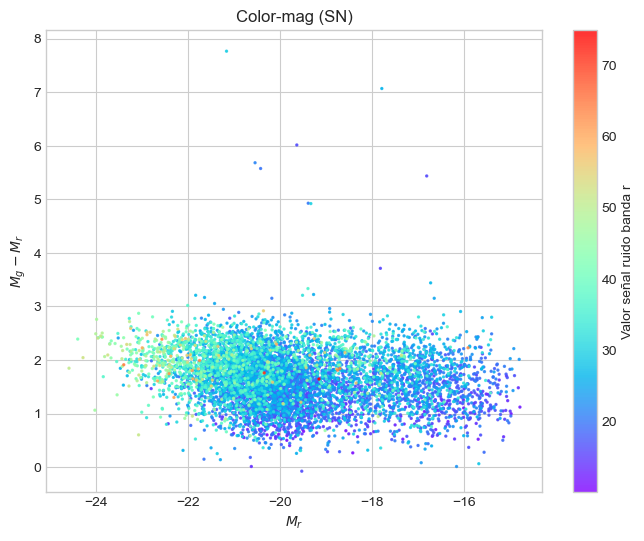

In [95]:
color = merged_df_filtered_SN2['dered_u']-merged_df_filtered_SN2['dered_r']
mag = merged_df_filtered_SN2['M_r']
#plt.plot(mag, color, '.')
graficos.color_Mag_SN(merged_df_filtered_SN2, color, band='r')